# EDA

## 讀取,轉換字串成可以訓練的資料

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import math

%matplotlib inline
data_path = '../../data'

random_seed = 2000

In [2]:
data_list=["raw_data.csv","FE_data1.csv","FE_data2.csv","FE_data2_2.csv","FE_data3.csv","FE_data4.csv",\
           "FE_data4_2.csv","FE_data5.csv","FE_data6.csv","FE_data7.csv","FE_data7_2.csv",\
            "pca_feature.csv","isolationtree_feature.csv","kmeans_feature.csv","svm_rbf_feature.csv"]
# data_list=["raw_data.csv","FE_data6.csv"]
data=[]
for d in data_list:
    x = pd.read_csv('../../data/preprocess/{}'.format(d))
    print('\n',d,x.shape)
    x_null = x.isnull().sum()
    print("Null columns:\n",x_null[x_null>0])
    
    if (d=='FE_data1.csv') or (d=='FE_data2.csv'):
        x.fillna(value=-1,inplace=True)
        
    data.append(x)

all_data = pd.concat(data,axis=1)

all_data_numsum = all_data.isnull().sum()
print('ALL data null:')
print(all_data_numsum[all_data_numsum>0])


 raw_data.csv (1943452, 23)
Null columns:
 fraud_ind    421665
dtype: int64

 FE_data1.csv (1943452, 56)
Null columns:
 cano_conam_skew      92612
cano_conam_kurt     155720
cano_conam_var       38678
bacno_locdt_skew     58303
bacno_locdt_kurt    101191
cano_locdt_skew      92612
cano_locdt_kurt     155720
dtype: int64

 FE_data2.csv (1943452, 30)
Null columns:
 Series([], dtype: int64)

 FE_data2_2.csv (1943452, 31)
Null columns:
 Series([], dtype: int64)

 FE_data3.csv (1943452, 9)
Null columns:
 Series([], dtype: int64)

 FE_data4.csv (1943452, 4)
Null columns:
 Series([], dtype: int64)

 FE_data4_2.csv (1943452, 3)
Null columns:
 Series([], dtype: int64)

 FE_data5.csv (1943452, 4)
Null columns:
 Series([], dtype: int64)

 FE_data6.csv (1943452, 17)
Null columns:
 Series([], dtype: int64)

 FE_data7.csv (1943452, 33)
Null columns:
 Series([], dtype: int64)

 FE_data7_2.csv (1943452, 33)
Null columns:
 Series([], dtype: int64)

 pca_feature.csv (1943452, 5)
Null columns:
 Series([

In [3]:
bool_cols = all_data.columns[all_data.dtypes==bool].values
for b in bool_cols:
    all_data[b] = all_data[b].map({True:1,False:0}) 

## EDA(觀察資料分佈, 找特徵工程的Idea）

#### 方法（四種）:
1. 比較train, validation data, test data各個feature(不包括fraud_ind)的分佈，看各個feature是否會隨時間不同而改變
    * 見 function compare_distribution
    * 檢查差異,目測結果: txkey有一點差異，其他幾乎一樣
    

2. 比較train, validation data各個feature相對於fraud_ind的關係，看他們與fraud_ind的關係是否會隨時間改變，如果會就不適合做training feature
    * 見 function analze_distribution
    * 檢查差異，目測結果:
        * 明顯差異,應該去除,或應該抽取更高層的穩定特徵(TODO): csmcu,mcc,loctm_hr2
        * 無法判讀:應該找出來並想辦法去除或找更高層特徵(TODO): 蠻多特徵都看不出來有沒有差,因為類別太多＝＝


3. 比較normal, fraud data的各個feature分佈差異，找有問題的feature!
    * 結果:


4. 但這樣無法看出單一用戶在normal和fraud的關係，所以要另外印出檢查，看有fraud data的用戶，該資料特點在哪
    * 根據時間順序,以每個bacno來看fraud情況(最重要,適合找data leakage!!!!)
    

## 觀測 train, validation, test的distribution
* 跟fraud_ind相關的，檢查train和validation就好（假設test data跟validation類似）
* 每筆feature的distribution，檢查train,validation和test


In [5]:
def combine_category(arr,f1,f2,cnt1,cnt2):
    max_cnt = cnt1 if cnt1>cnt2 else cnt2
    max_id = 1 if cnt1>cnt2 else 2
    if max_id==1:
        return arr[f2]*max_cnt+arr[f1]
    elif max_id==2:
        return arr[f1]*max_cnt+arr[f2]


In [7]:
def analze_distribution(data, target_col, feature, data_test):
#     if data[feature].nunique()!=data_test[feature].nunique():
#         print('data nunique not the same')
    print(feature)
    plt.clf()
    mean_data = data.groupby(feature)[target_col].mean()
    mean_data_test = data_test.groupby(feature)[target_col].mean()
    distribution_data = data[feature].value_counts(dropna=False)
    distribution_data_test = data_test[feature].value_counts(dropna=False)
    
    fig, axs = plt.subplots(2,2,figsize=(10,5))
    axs[0,0].plot(mean_data.index, mean_data.values, marker='o')
    axs[0,0].set_title('Average {} wrt {}'.format(target_col,feature))
    axs[0,0].set_ylabel('mean of {}'.format(target_col))
    axs[0,0].set_xlabel(feature)
    
    
    bins = data[feature].nunique() if data[feature].nunique()<100 else 100
    data[feature].hist(bins=bins,ax=axs[0,1])

#     axs[0,1].bar(distribution_data.index, distribution_data.values, alpha=0.5)
    axs[0,1].set_title('distribution of {}'.format(feature))
    axs[0,1].set_ylabel('count of {}'.format(feature))
    axs[0,1].set_xlabel(feature)
    
    # Add text in figure coordinates
    plt.figtext(0.5, 1,   'Train data plot', ha='center', va='center', fontsize=15)
    plt.figtext(0.5, 0.5, 'Test data plot', ha='center', va='center', fontsize=15)
    axs[1,0].plot(mean_data_test.index, mean_data_test.values, marker='o')
    axs[1,0].set_title('Average {} wrt {}'.format(target_col,feature))
    axs[1,0].set_ylabel('mean of {}'.format(target_col))
    axs[1,0].set_xlabel(feature)
    
    bins = data_test[feature].nunique() if data_test[feature].nunique()<100 else 100
    data_test[feature].hist(bins=bins,ax=axs[1,1])
#     axs[1,1].bar(distribution_data_test.index, distribution_data_test.values, alpha=0.5)
    distribution_data_test.hist
    axs[1,1].set_title('distribution of {}'.format(feature))
    axs[1,1].set_ylabel('count of {}'.format(feature))
    axs[1,1].set_xlabel(feature)
    plt.tight_layout(pad=3)
    plt.show()

acqic


<Figure size 432x288 with 0 Axes>

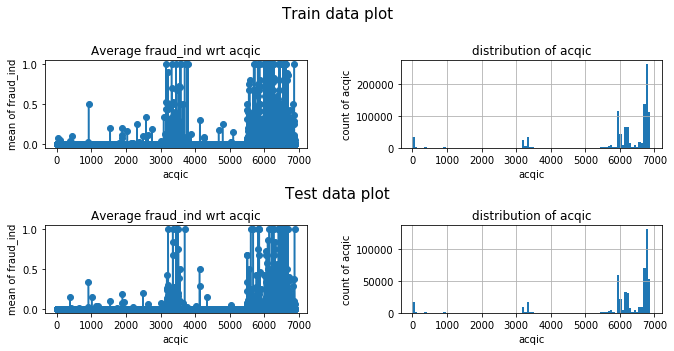

bacno


<Figure size 432x288 with 0 Axes>

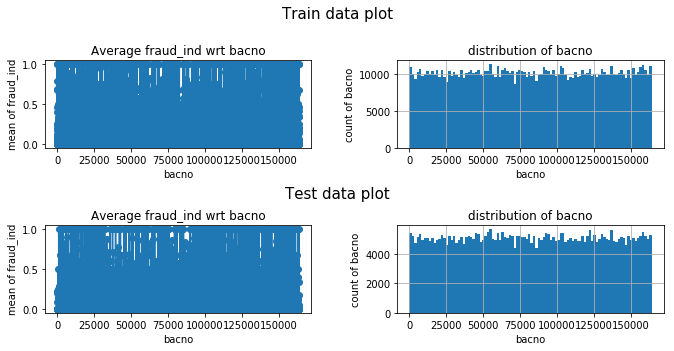

cano


<Figure size 432x288 with 0 Axes>

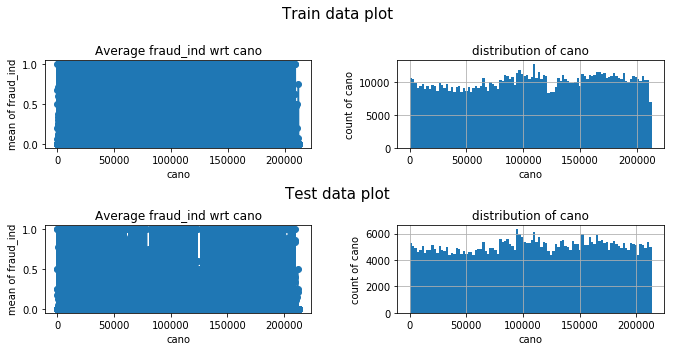

conam


<Figure size 432x288 with 0 Axes>

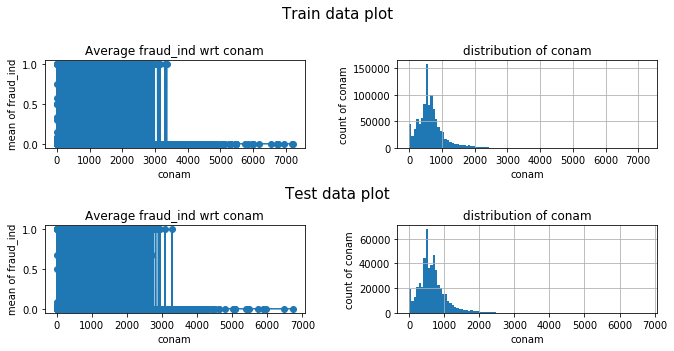

contp


<Figure size 432x288 with 0 Axes>

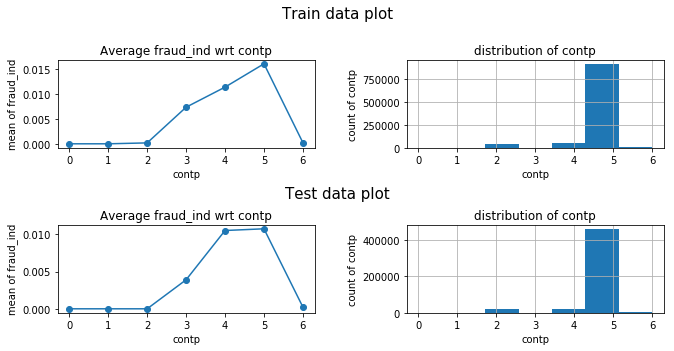

csmcu


<Figure size 432x288 with 0 Axes>

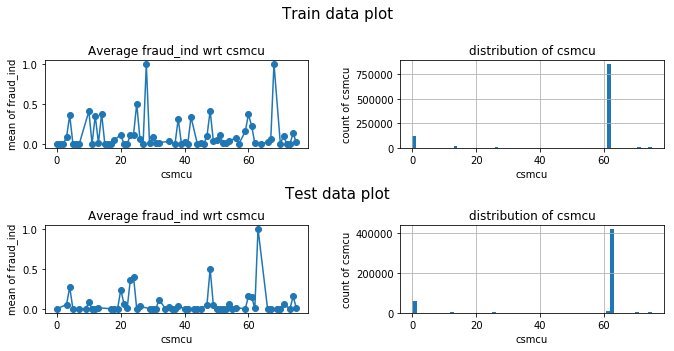

ecfg


<Figure size 432x288 with 0 Axes>

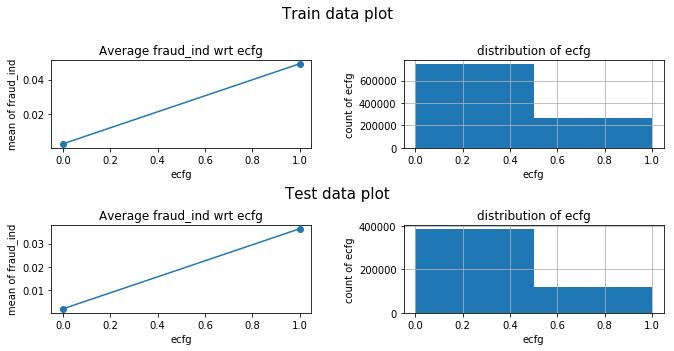

etymd


<Figure size 432x288 with 0 Axes>

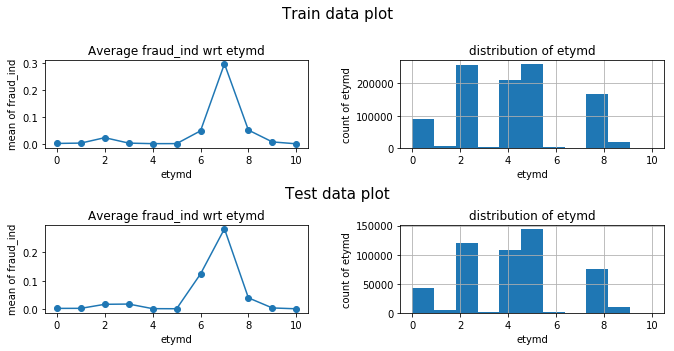

flbmk


<Figure size 432x288 with 0 Axes>

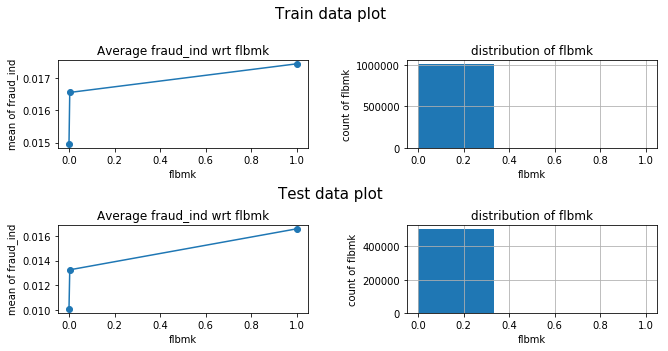

flg_3dsmk


<Figure size 432x288 with 0 Axes>

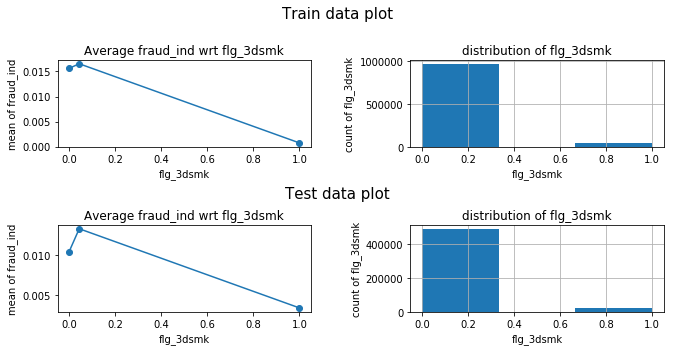

fraud_ind


<Figure size 432x288 with 0 Axes>

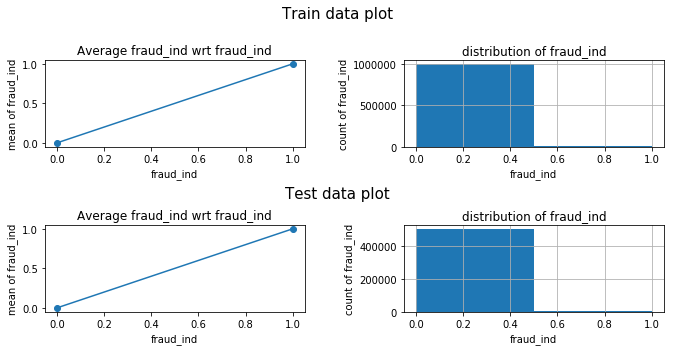

hcefg


<Figure size 432x288 with 0 Axes>

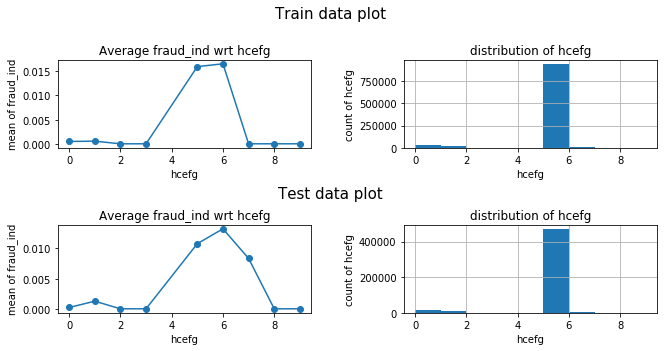

insfg


<Figure size 432x288 with 0 Axes>

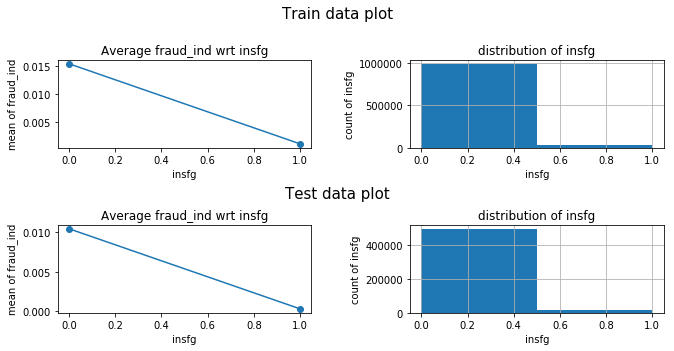

iterm


<Figure size 432x288 with 0 Axes>

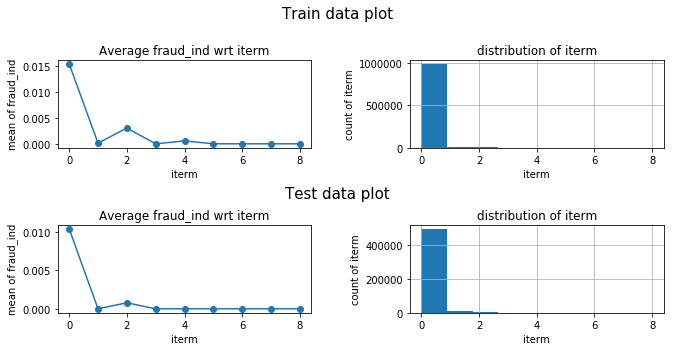

locdt


<Figure size 432x288 with 0 Axes>

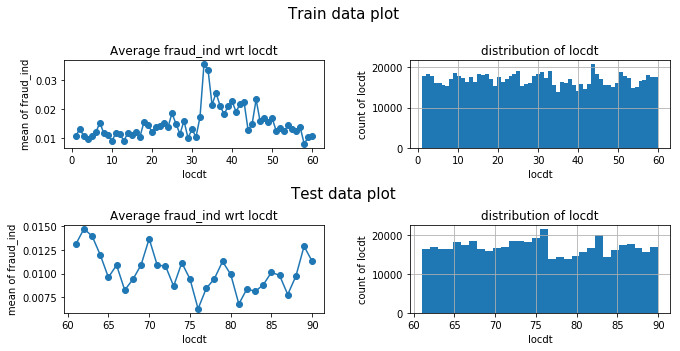

loctm


<Figure size 432x288 with 0 Axes>

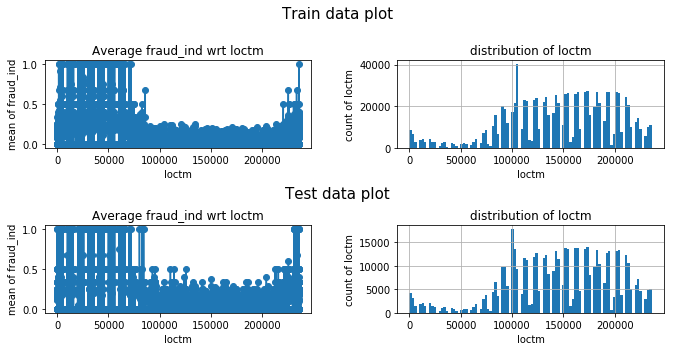

mcc


<Figure size 432x288 with 0 Axes>

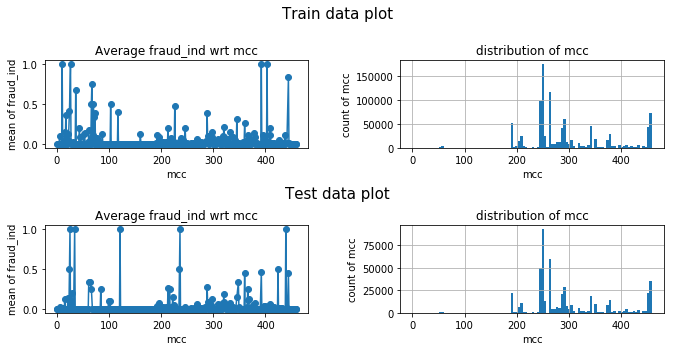

mchno


<Figure size 432x288 with 0 Axes>

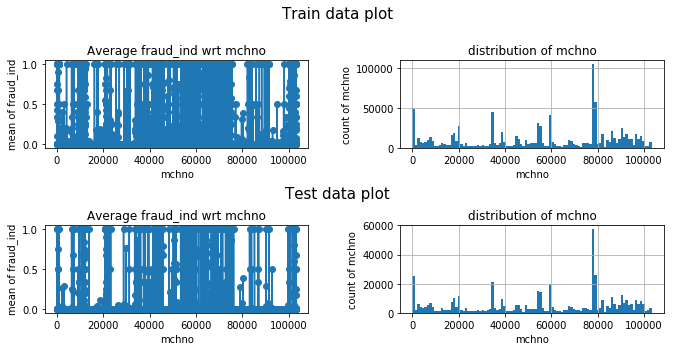

ovrlt


<Figure size 432x288 with 0 Axes>

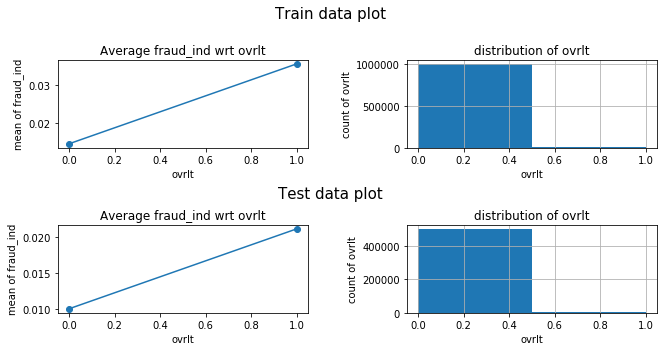

scity


<Figure size 432x288 with 0 Axes>

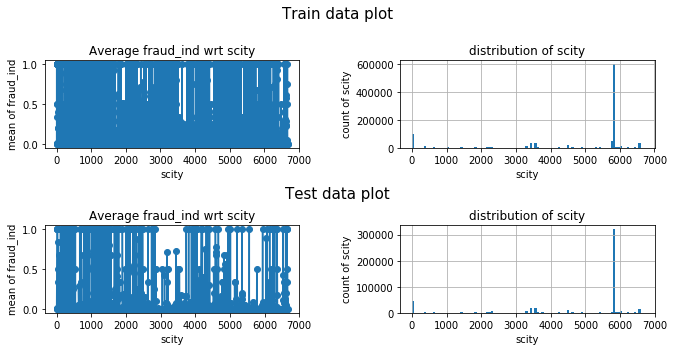

stocn


<Figure size 432x288 with 0 Axes>

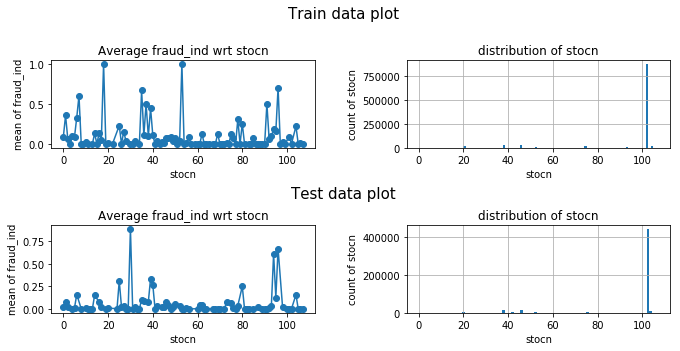

stscd


<Figure size 432x288 with 0 Axes>

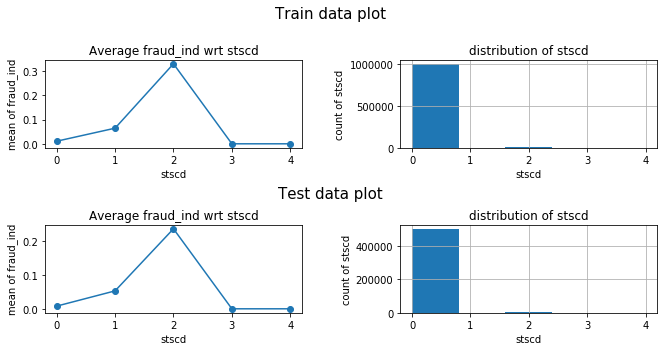

txkey


<Figure size 432x288 with 0 Axes>

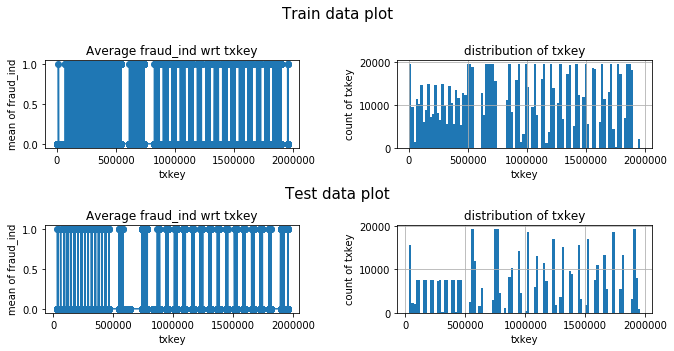

bacno_cano_nunique


<Figure size 432x288 with 0 Axes>

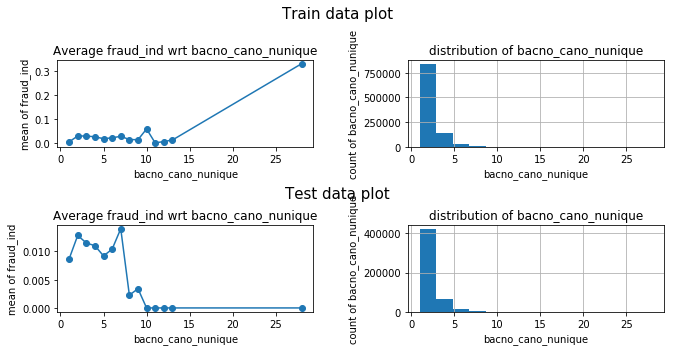

bacno_txkey_nunique


<Figure size 432x288 with 0 Axes>

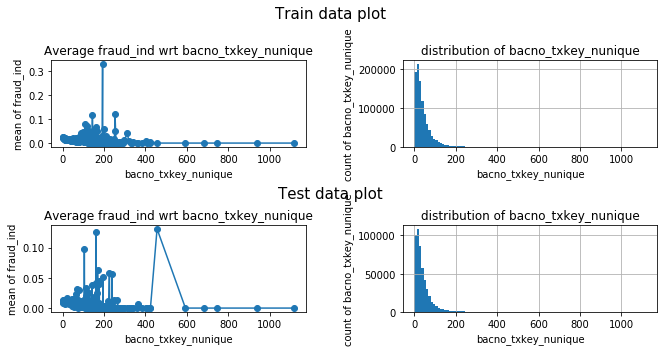

conam_log


<Figure size 432x288 with 0 Axes>

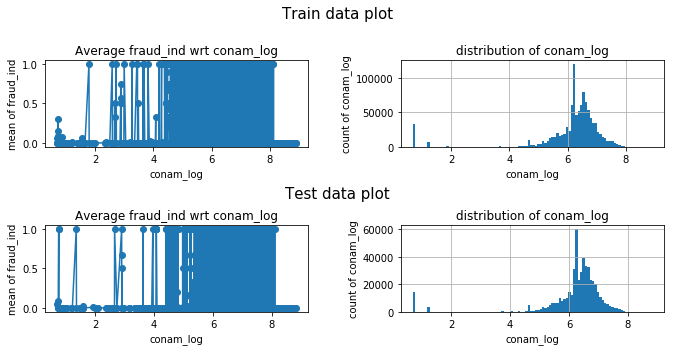

bacno_mean_conam


<Figure size 432x288 with 0 Axes>

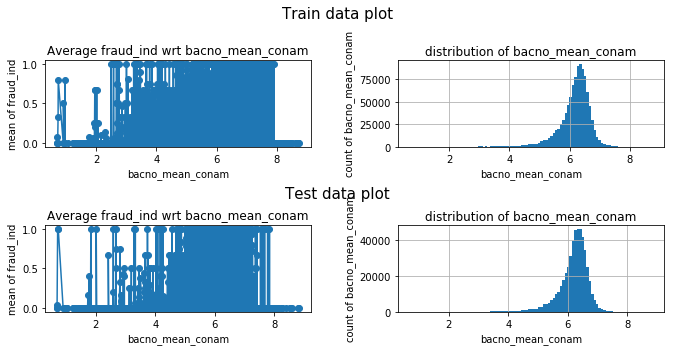

bacno_scale_conam


<Figure size 432x288 with 0 Axes>

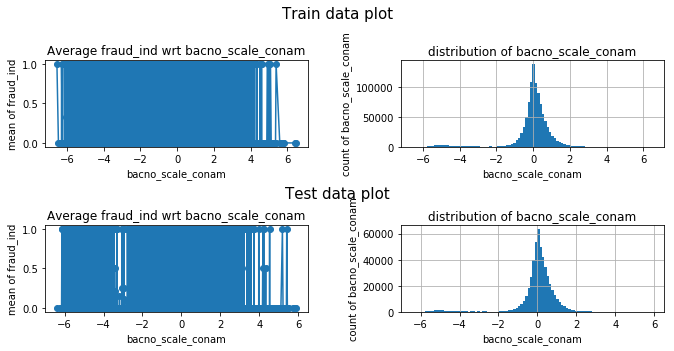

cano_mean_conam


<Figure size 432x288 with 0 Axes>

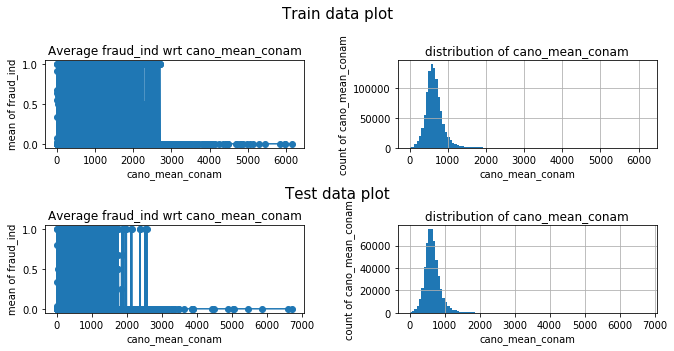

cano_scale_conam


<Figure size 432x288 with 0 Axes>

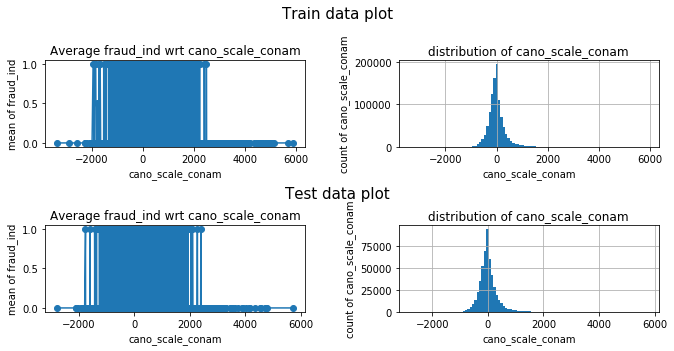

cano_conam_skew


<Figure size 432x288 with 0 Axes>

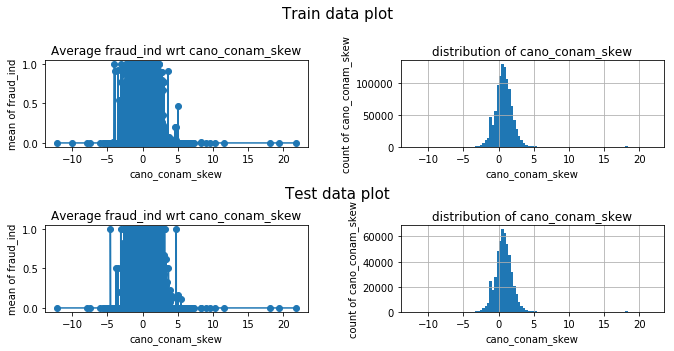

cano_conam_kurt


<Figure size 432x288 with 0 Axes>

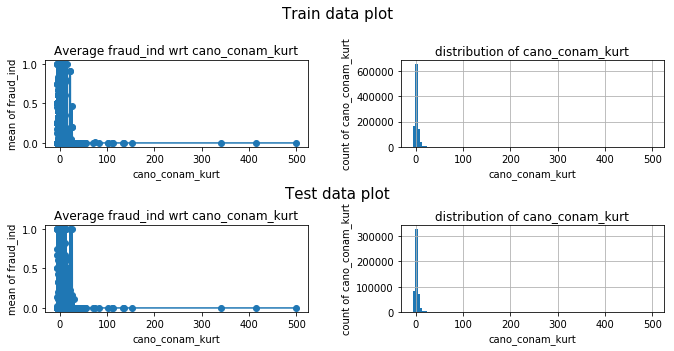

cano_conam_mean


<Figure size 432x288 with 0 Axes>

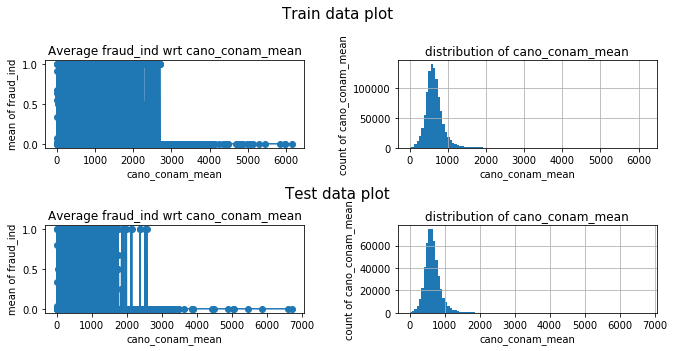

cano_conam_var


<Figure size 432x288 with 0 Axes>

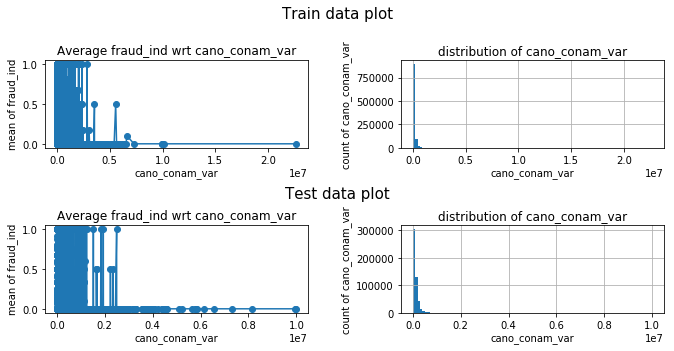

bacno_max_conam


<Figure size 432x288 with 0 Axes>

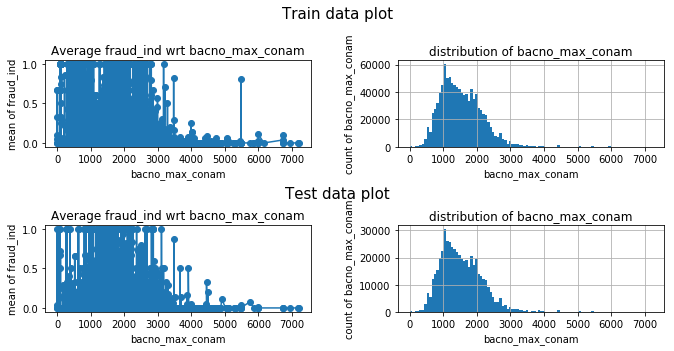

bacno_ismax_conam


<Figure size 432x288 with 0 Axes>

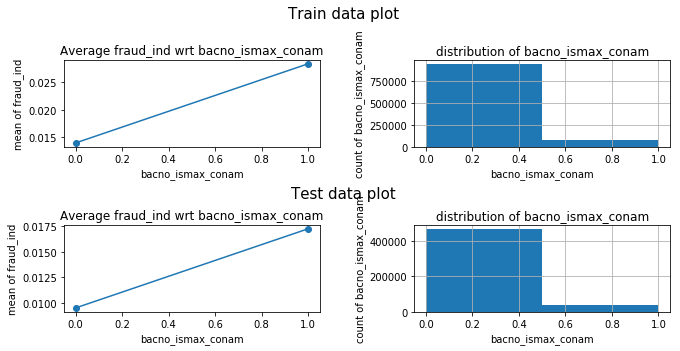

bacno_min_conam


<Figure size 432x288 with 0 Axes>

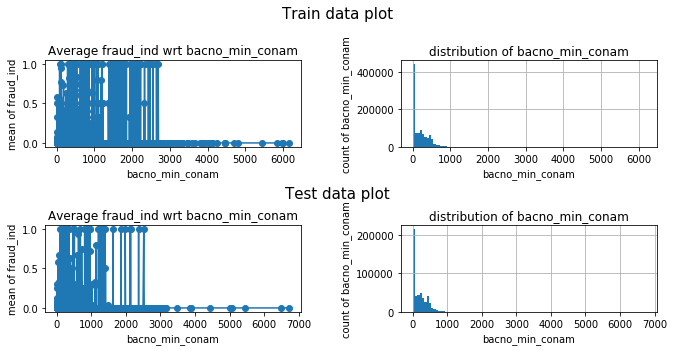

bacno_ismin_conam


<Figure size 432x288 with 0 Axes>

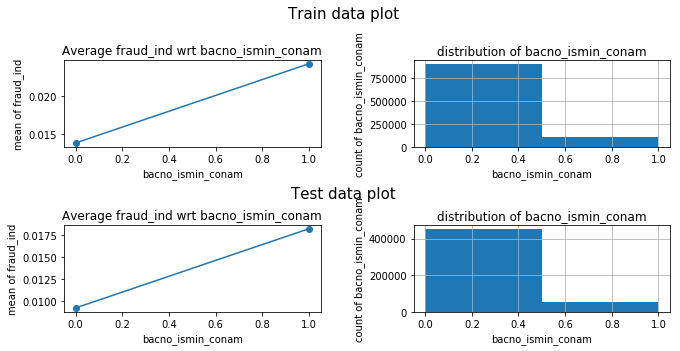

bacno_ratio_ecfg


<Figure size 432x288 with 0 Axes>

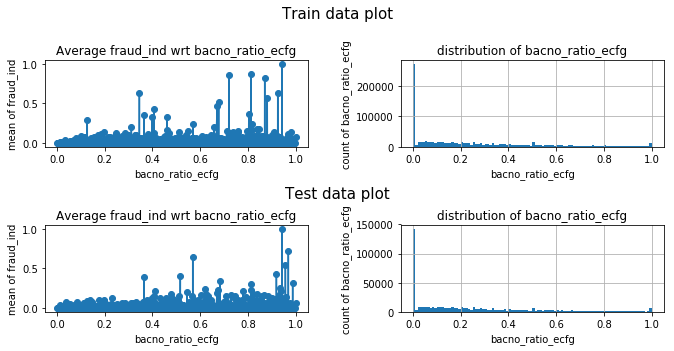

cano_ratio_ecfg


<Figure size 432x288 with 0 Axes>

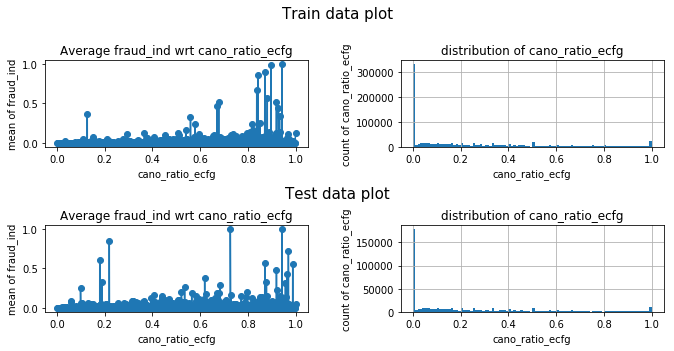

locdt_week


<Figure size 432x288 with 0 Axes>

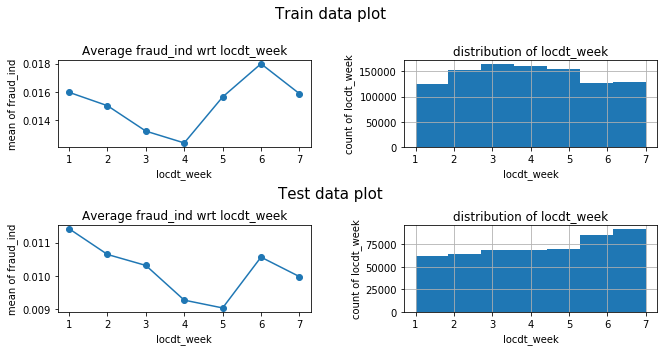

loctm_hr


<Figure size 432x288 with 0 Axes>

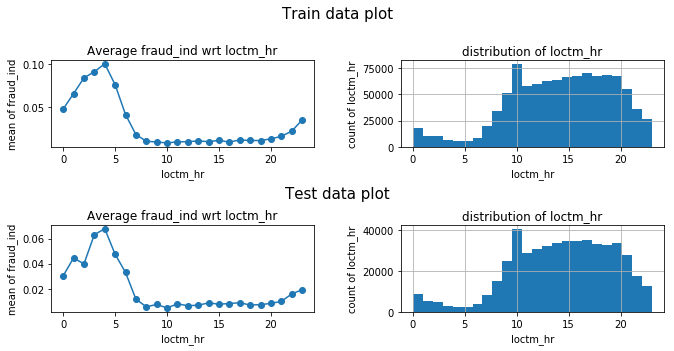

bacno_locdt_skew


<Figure size 432x288 with 0 Axes>

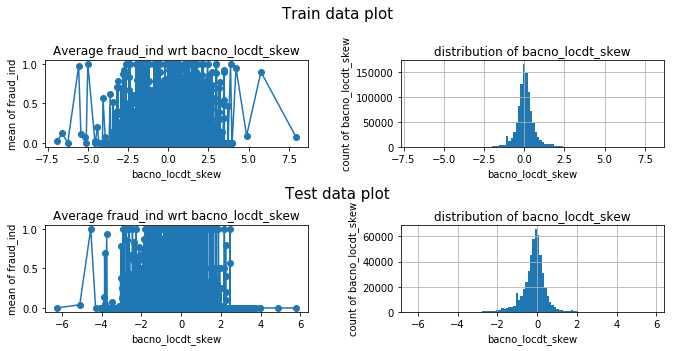

bacno_locdt_kurt


<Figure size 432x288 with 0 Axes>

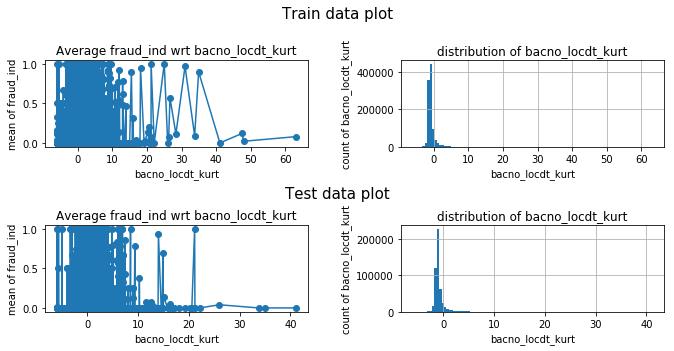

cano_locdt_skew


<Figure size 432x288 with 0 Axes>

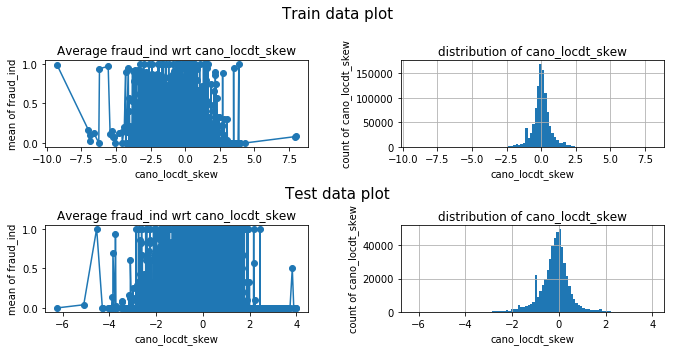

cano_locdt_kurt


<Figure size 432x288 with 0 Axes>

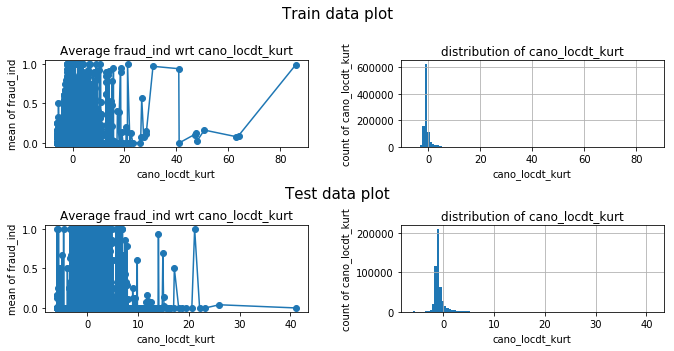

bacno_stocn_mode


<Figure size 432x288 with 0 Axes>

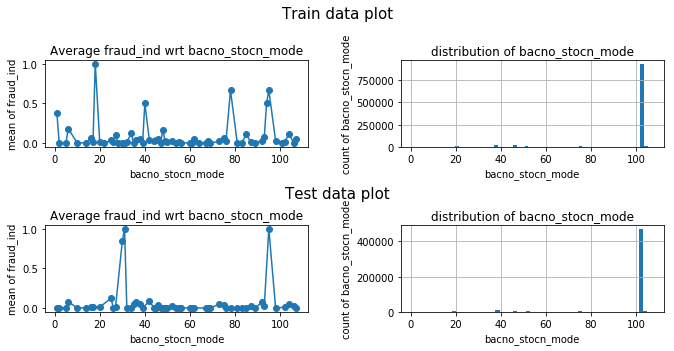

bacno_scity_mode


<Figure size 432x288 with 0 Axes>

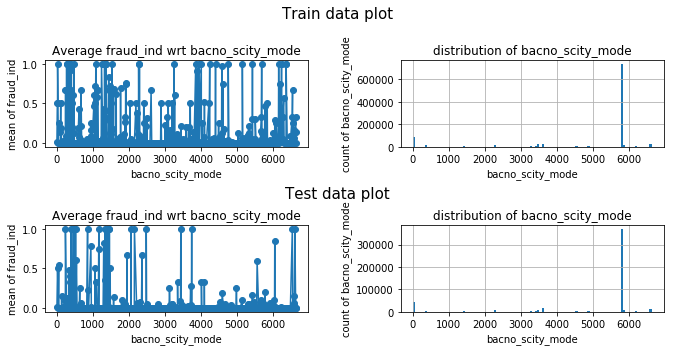

bacno_csmcu_mode


<Figure size 432x288 with 0 Axes>

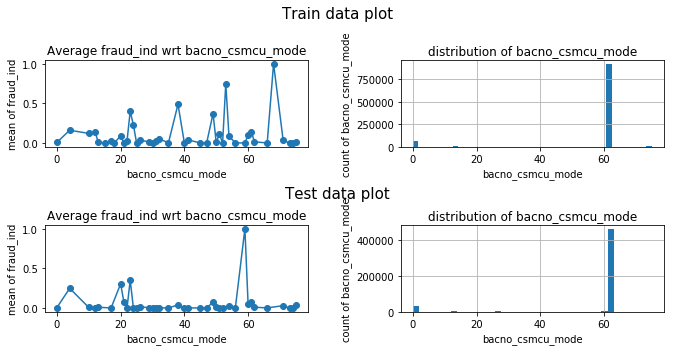

bacno_stocn_ismode


<Figure size 432x288 with 0 Axes>

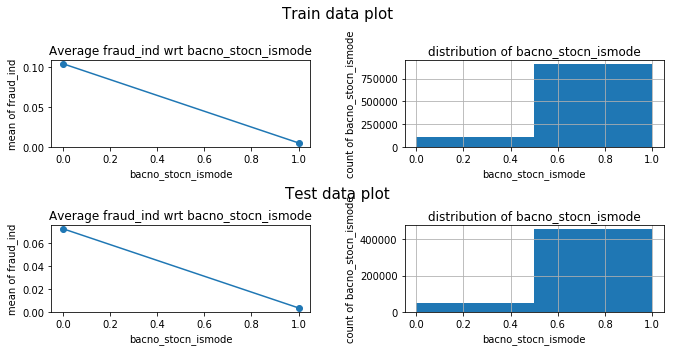

bacno_scity_ismode


<Figure size 432x288 with 0 Axes>

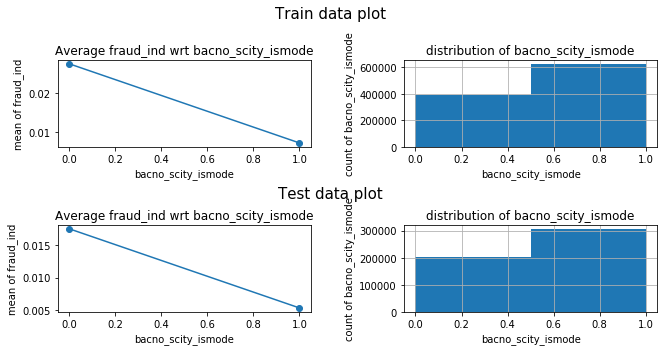

bacno_csmcu_ismode


<Figure size 432x288 with 0 Axes>

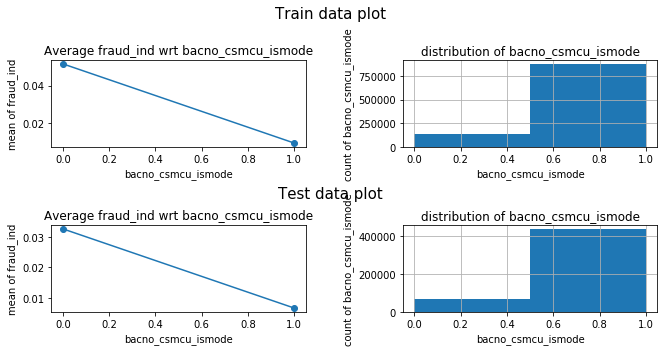

cano_stocn_mode


<Figure size 432x288 with 0 Axes>

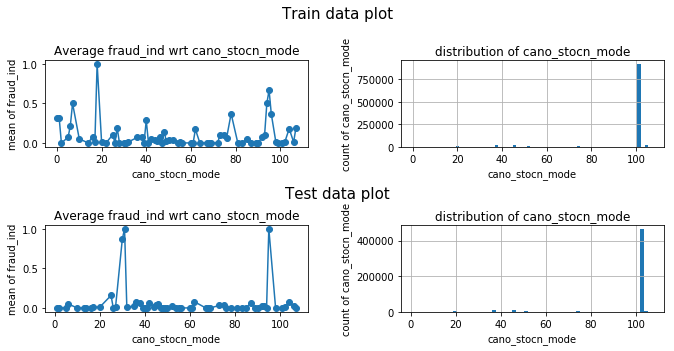

cano_scity_mode


<Figure size 432x288 with 0 Axes>

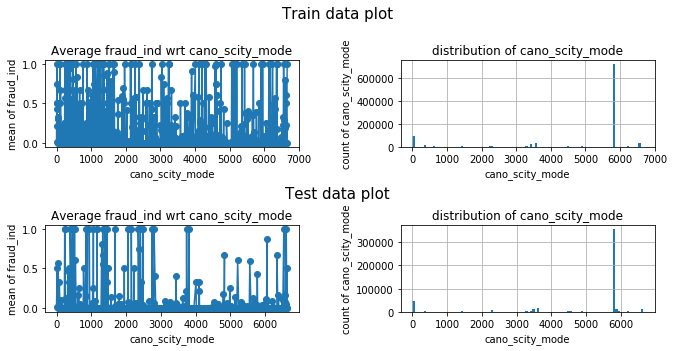

cano_csmcu_mode


<Figure size 432x288 with 0 Axes>

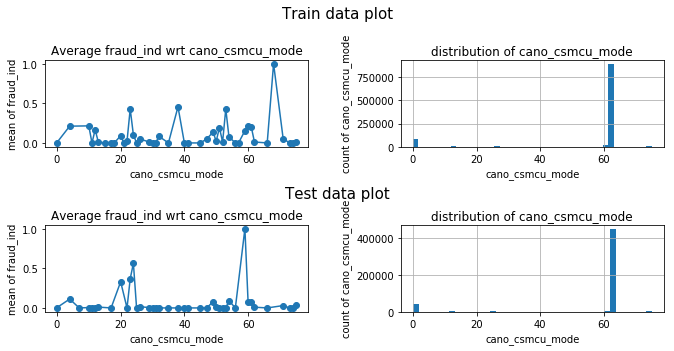

cano_stocn_ismode


<Figure size 432x288 with 0 Axes>

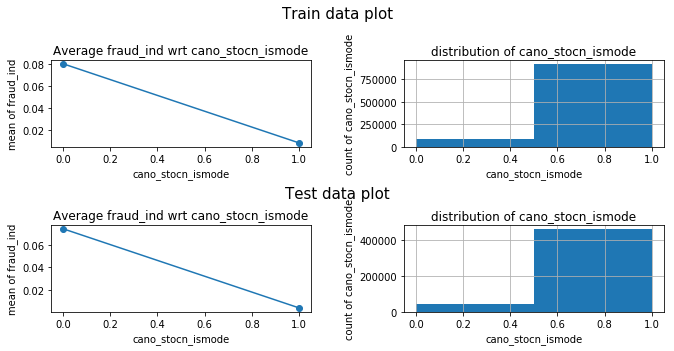

cano_scity_ismode


<Figure size 432x288 with 0 Axes>

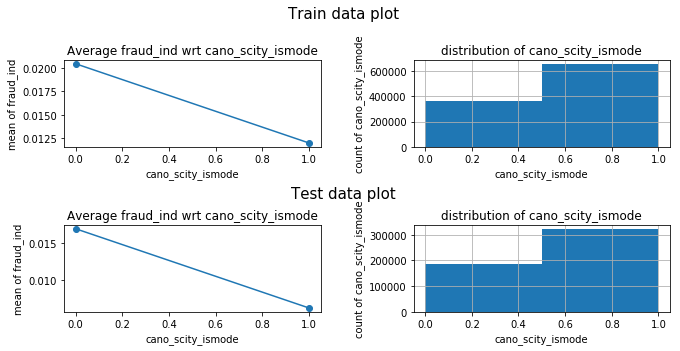

cano_csmcu_ismode


<Figure size 432x288 with 0 Axes>

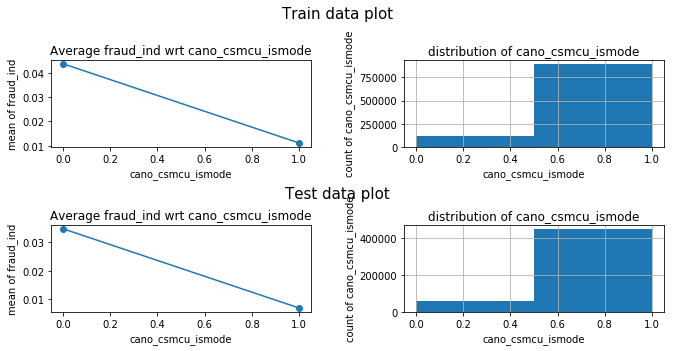

mchno_fraud_mean


<Figure size 432x288 with 0 Axes>

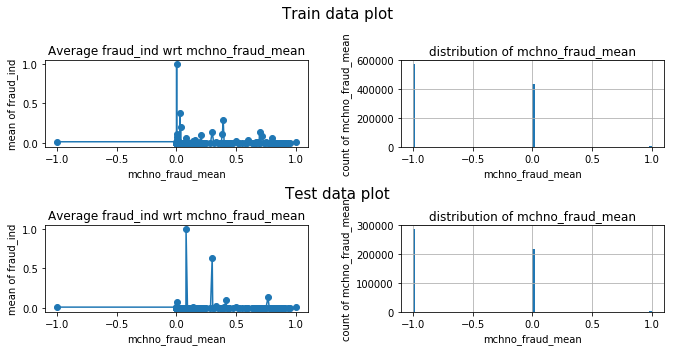

mcc_fraud_mean


<Figure size 432x288 with 0 Axes>

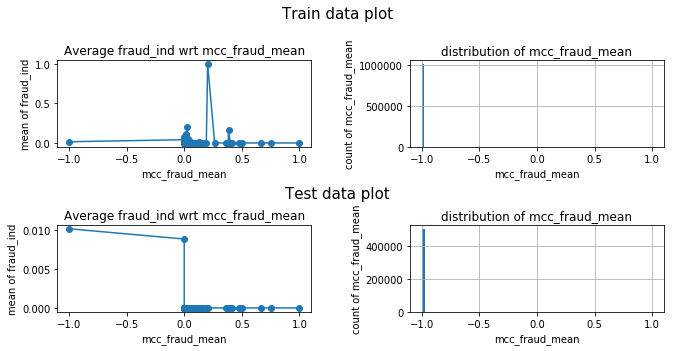

acqic_fraud_mean


<Figure size 432x288 with 0 Axes>

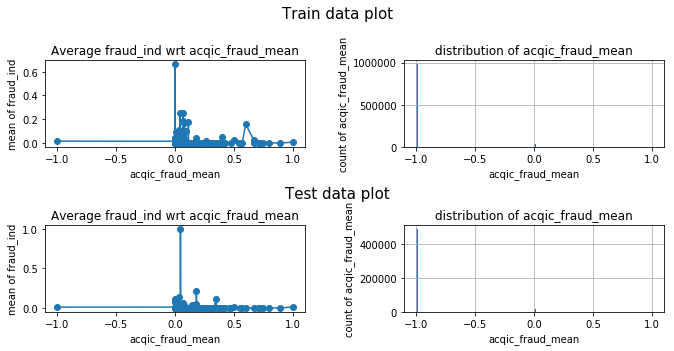

mchno_bacno_nunique


<Figure size 432x288 with 0 Axes>

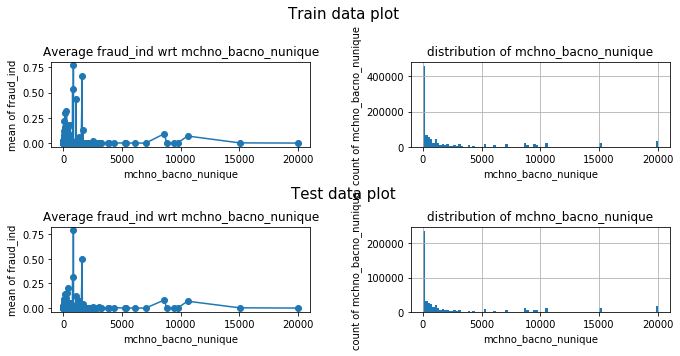

acqic_bacno_nunique


<Figure size 432x288 with 0 Axes>

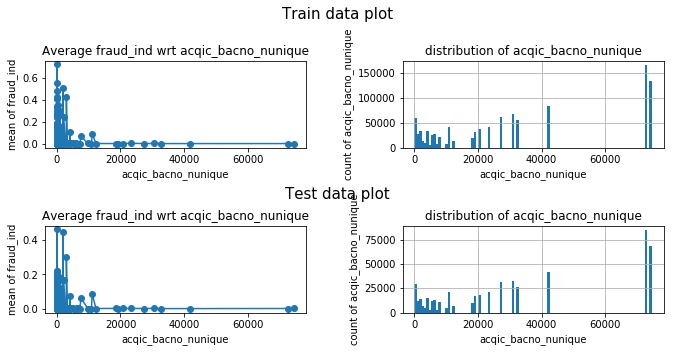

mcc_bacno_nunique


<Figure size 432x288 with 0 Axes>

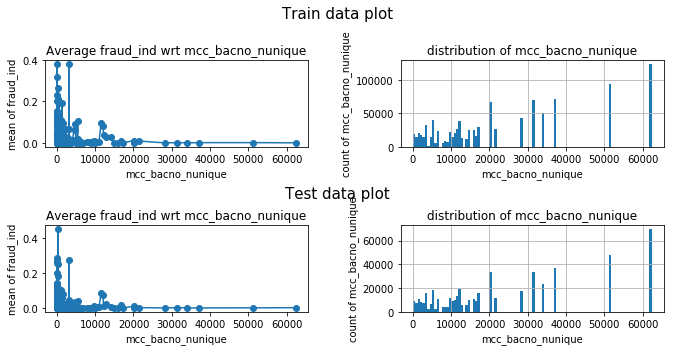

stocn_bacno_nunique


<Figure size 432x288 with 0 Axes>

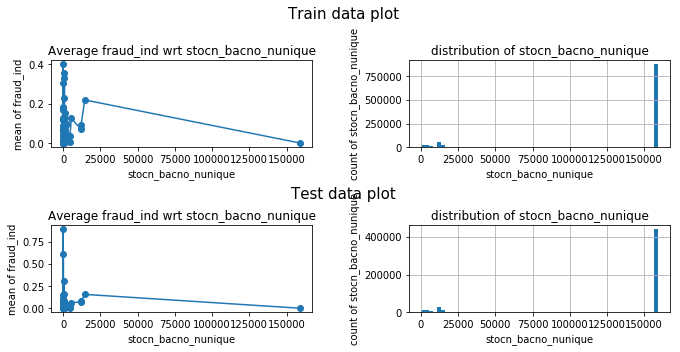

scity_bacno_nunique


<Figure size 432x288 with 0 Axes>

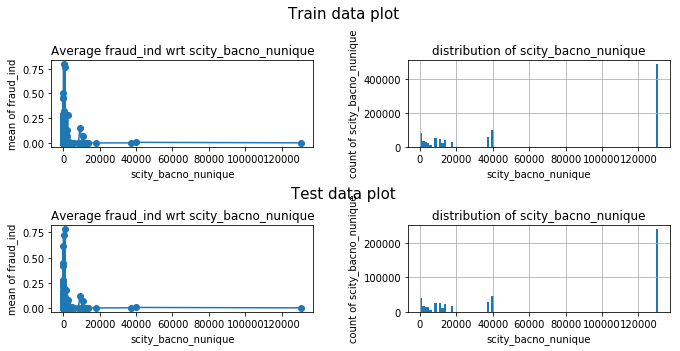

csmcu_bacno_nunique


<Figure size 432x288 with 0 Axes>

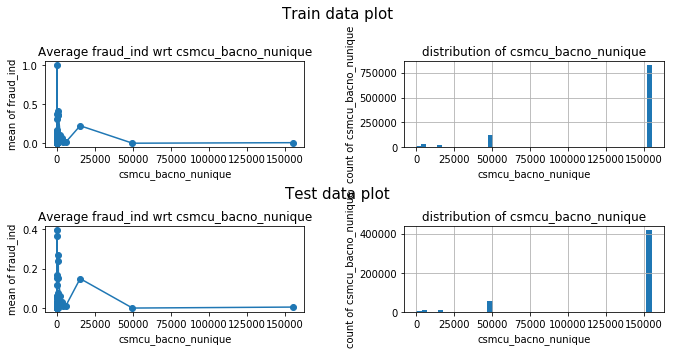

mchno_cano_nunique


<Figure size 432x288 with 0 Axes>

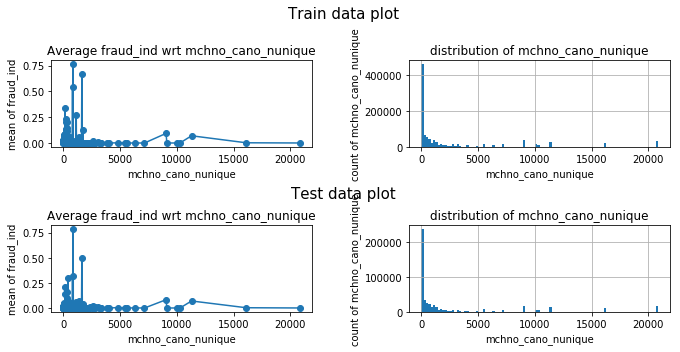

acqic_cano_nunique


<Figure size 432x288 with 0 Axes>

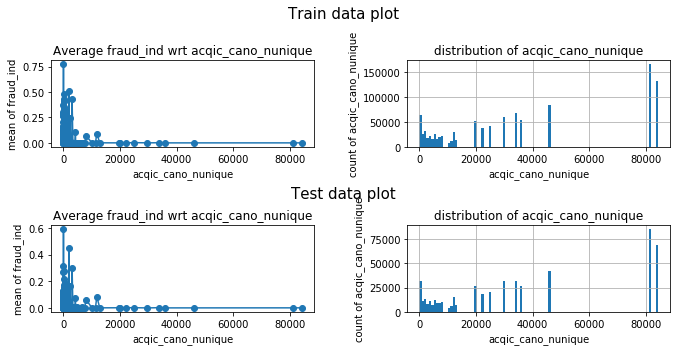

mcc_cano_nunique


<Figure size 432x288 with 0 Axes>

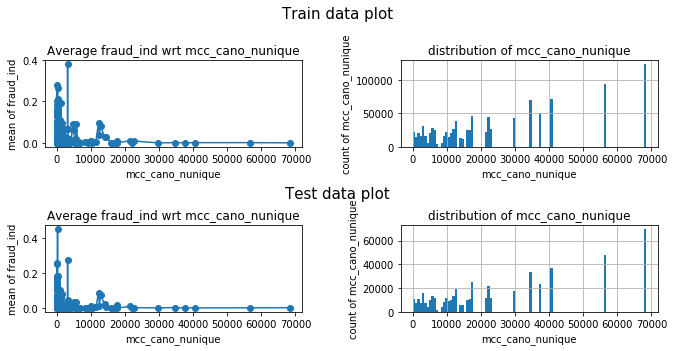

stocn_cano_nunique


<Figure size 432x288 with 0 Axes>

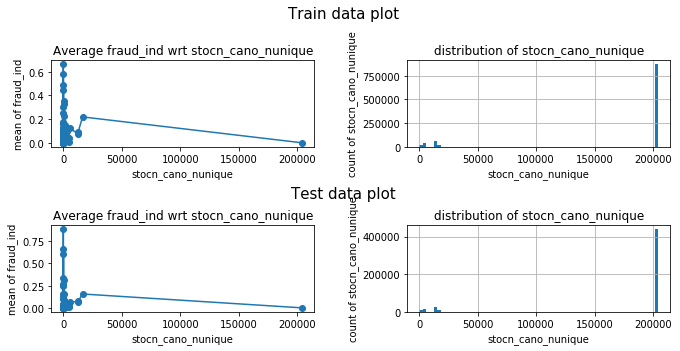

scity_cano_nunique


<Figure size 432x288 with 0 Axes>

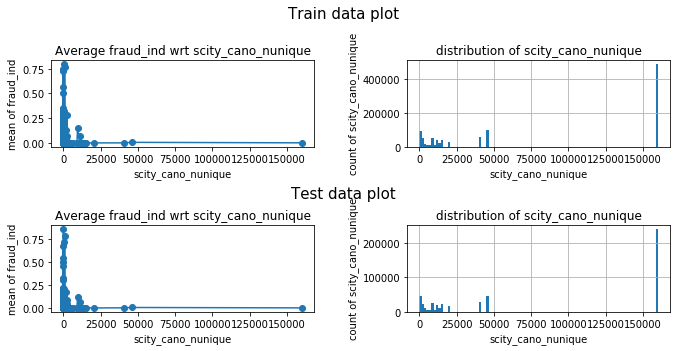

csmcu_cano_nunique


<Figure size 432x288 with 0 Axes>

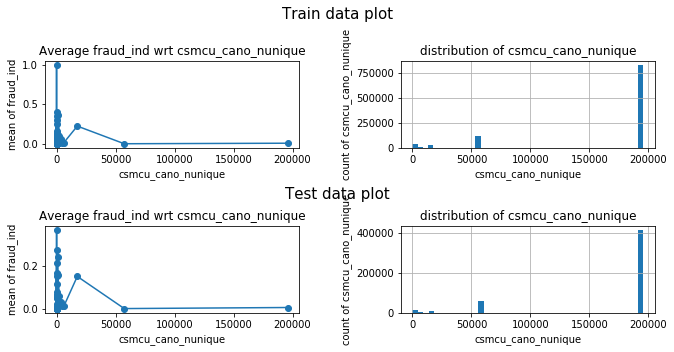

mchno_value_counts_all


<Figure size 432x288 with 0 Axes>

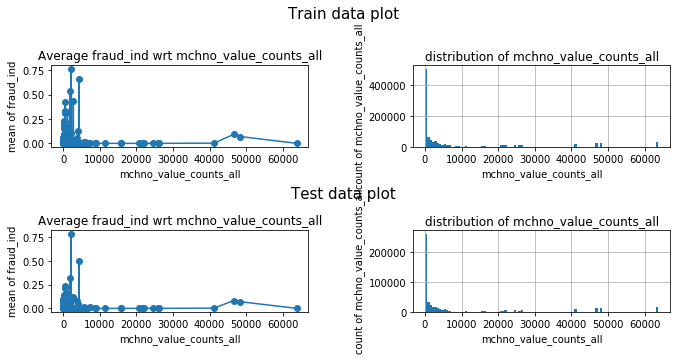

acqic_value_counts_all


<Figure size 432x288 with 0 Axes>

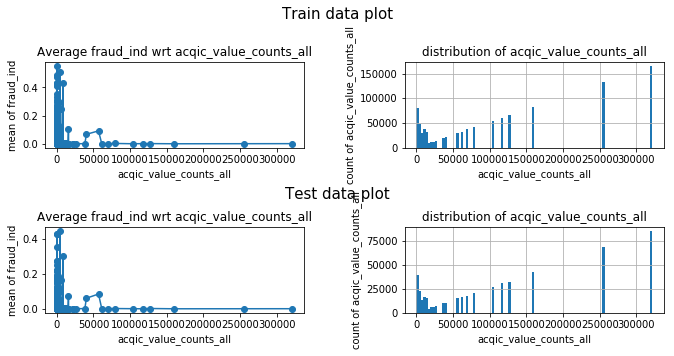

mcc_value_counts_all


<Figure size 432x288 with 0 Axes>

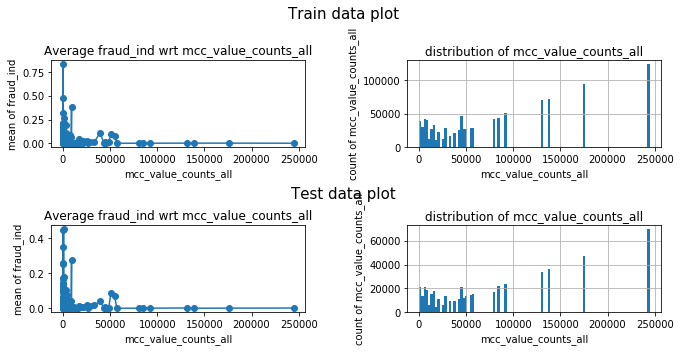

stocn_value_counts_all


<Figure size 432x288 with 0 Axes>

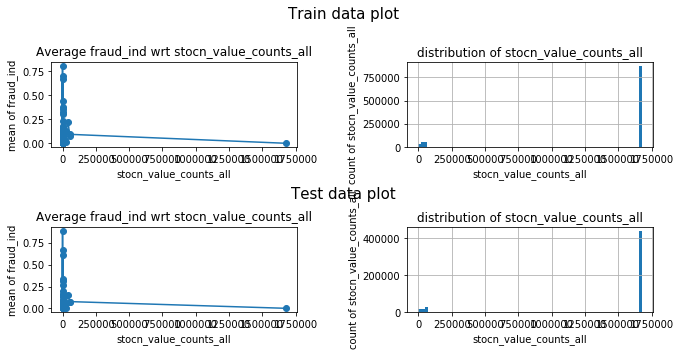

scity_value_counts_all


<Figure size 432x288 with 0 Axes>

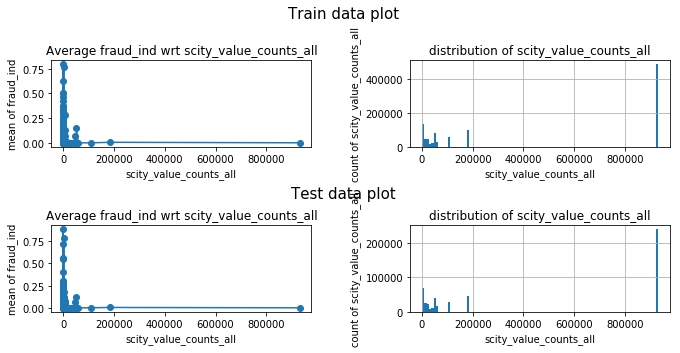

csmcu_value_counts_all


<Figure size 432x288 with 0 Axes>

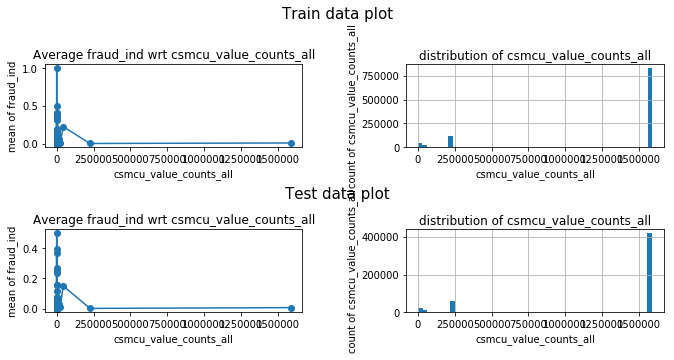

bacno_stocn_nunique


<Figure size 432x288 with 0 Axes>

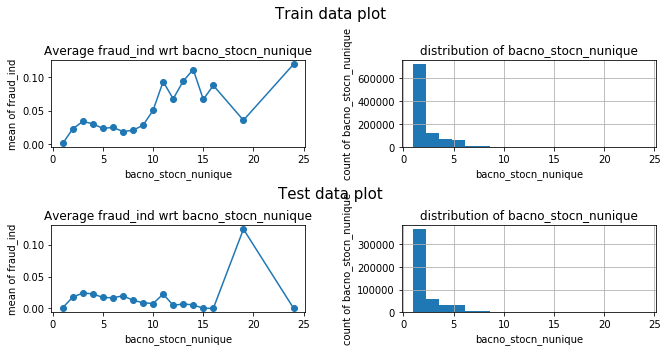

stocn_value_counts


<Figure size 432x288 with 0 Axes>

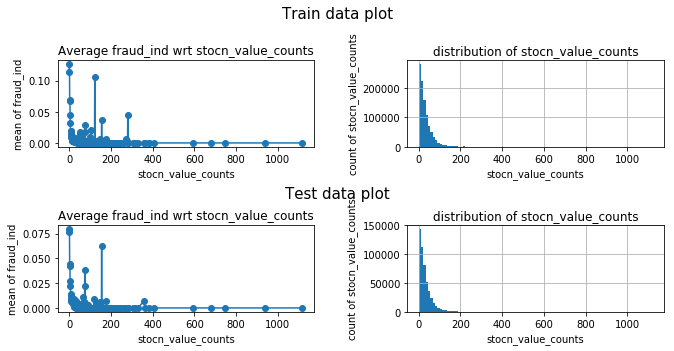

stocn_ratio


<Figure size 432x288 with 0 Axes>

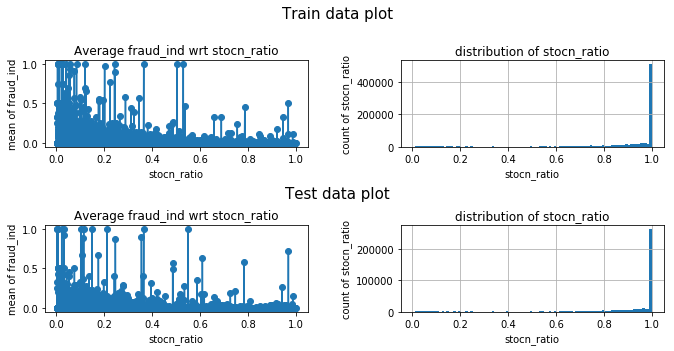

bacno_csmcu_nunique


<Figure size 432x288 with 0 Axes>

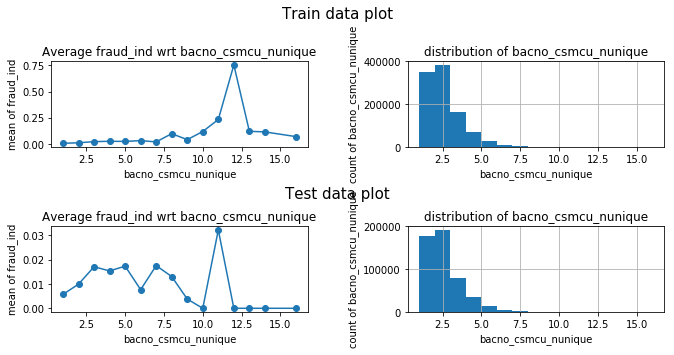

csmcu_value_counts


<Figure size 432x288 with 0 Axes>

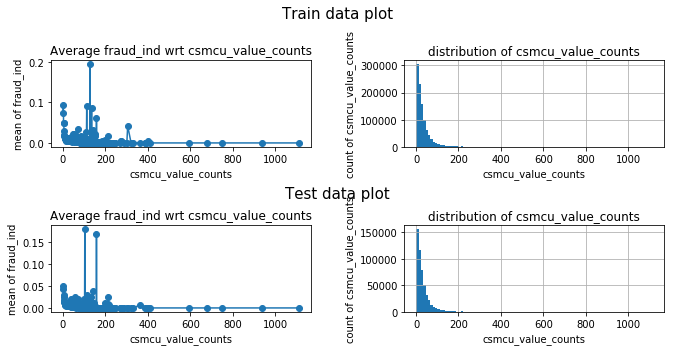

csmcu_ratio


<Figure size 432x288 with 0 Axes>

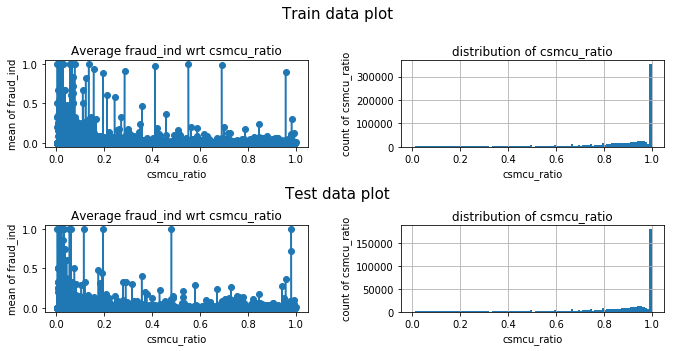

bacno_mchno_nunique


<Figure size 432x288 with 0 Axes>

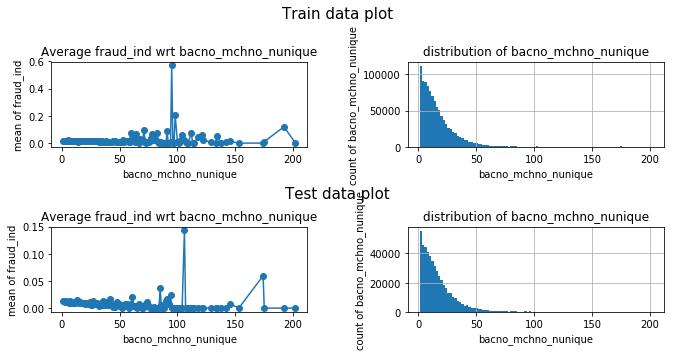

mchno_value_counts


<Figure size 432x288 with 0 Axes>

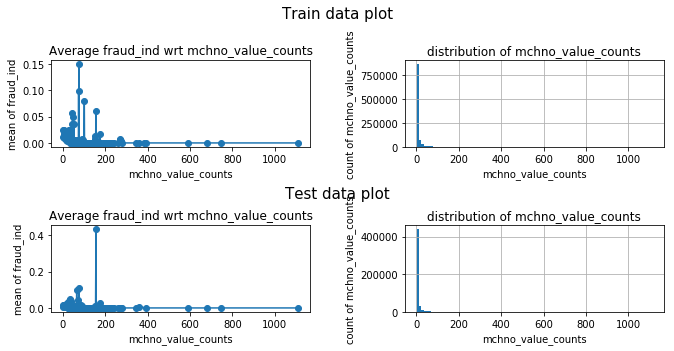

mchno_ratio


<Figure size 432x288 with 0 Axes>

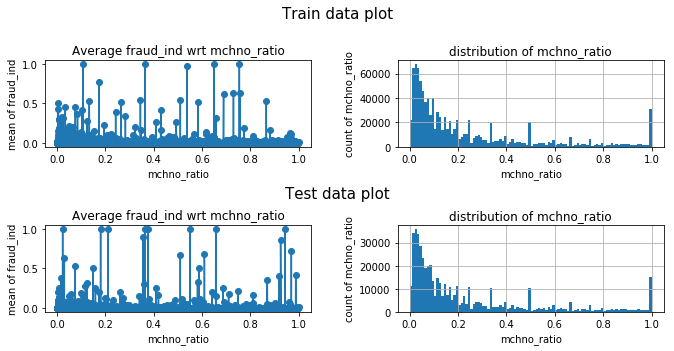

bacno_acqic_nunique


<Figure size 432x288 with 0 Axes>

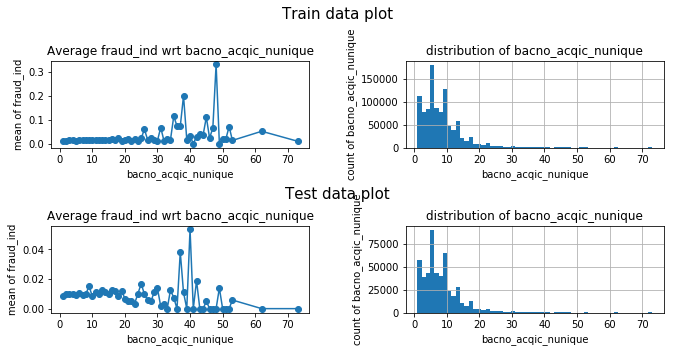

acqic_value_counts


<Figure size 432x288 with 0 Axes>

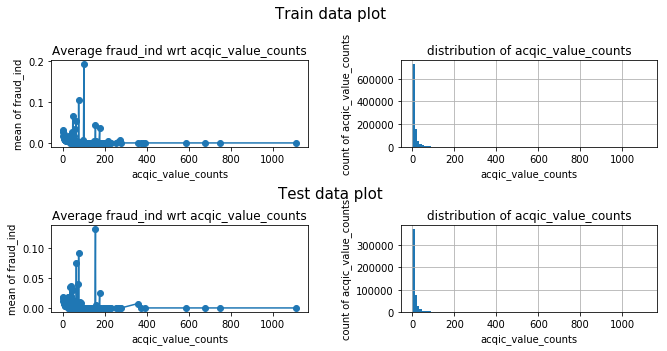

acqic_ratio


<Figure size 432x288 with 0 Axes>

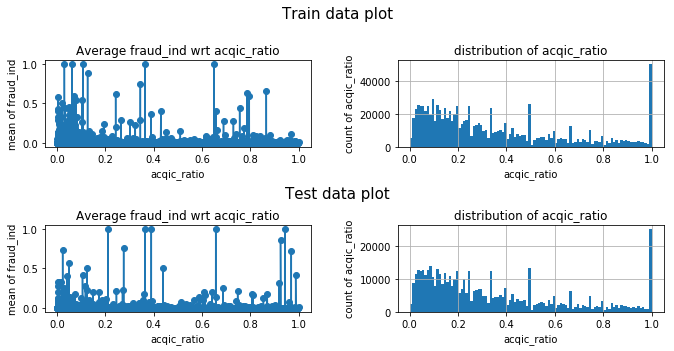

bacno_mcc_nunique


<Figure size 432x288 with 0 Axes>

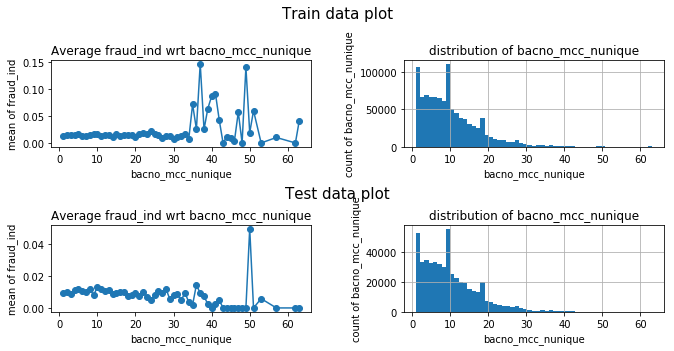

mcc_value_counts


<Figure size 432x288 with 0 Axes>

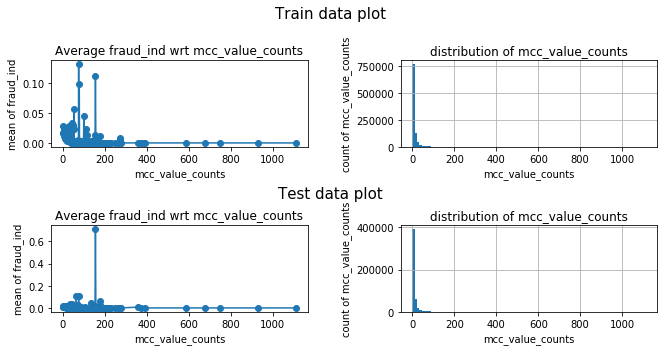

mcc_ratio


<Figure size 432x288 with 0 Axes>

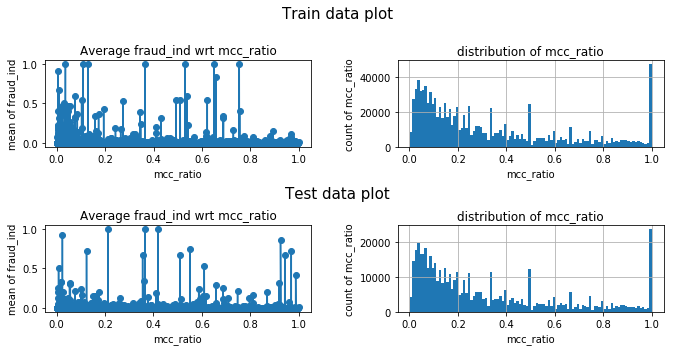

bacno_scity_nunique


<Figure size 432x288 with 0 Axes>

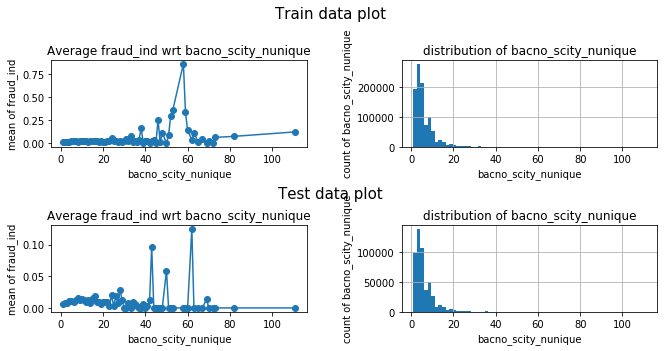

scity_value_counts


<Figure size 432x288 with 0 Axes>

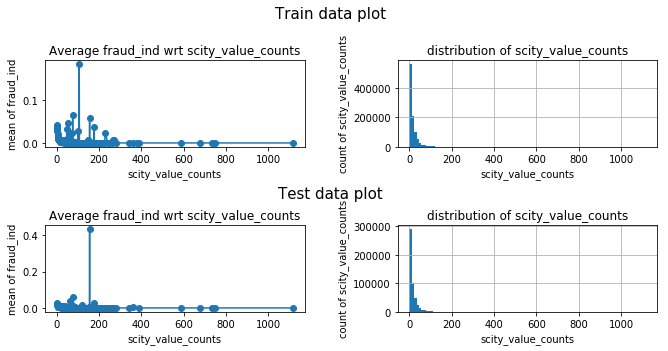

scity_ratio


<Figure size 432x288 with 0 Axes>

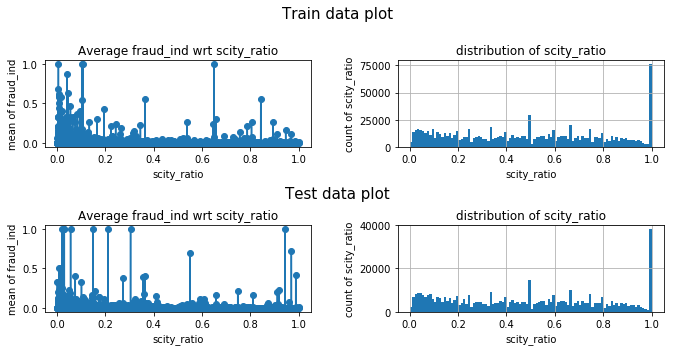

bacno_contp_nunique


<Figure size 432x288 with 0 Axes>

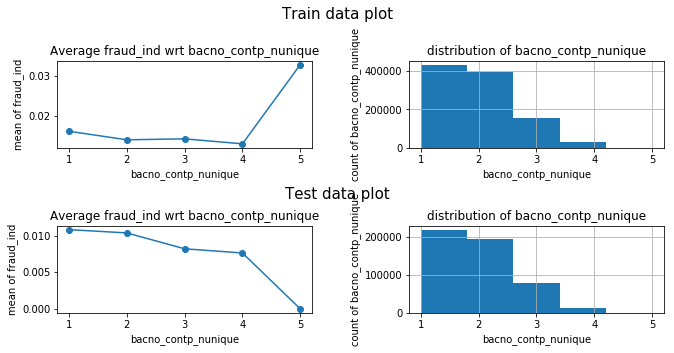

contp_value_counts


<Figure size 432x288 with 0 Axes>

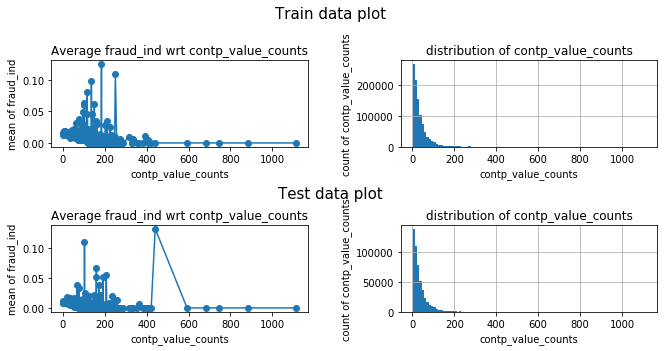

contp_ratio


<Figure size 432x288 with 0 Axes>

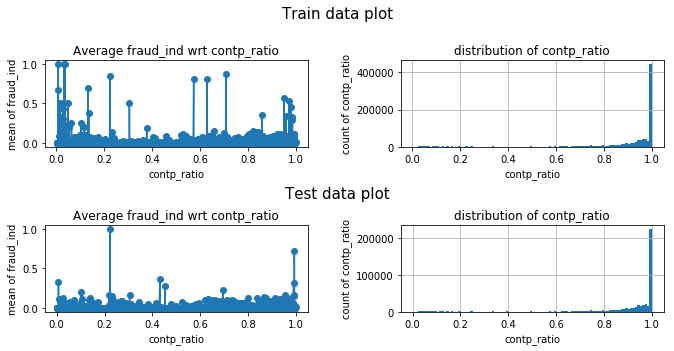

bacno_etymd_nunique


<Figure size 432x288 with 0 Axes>

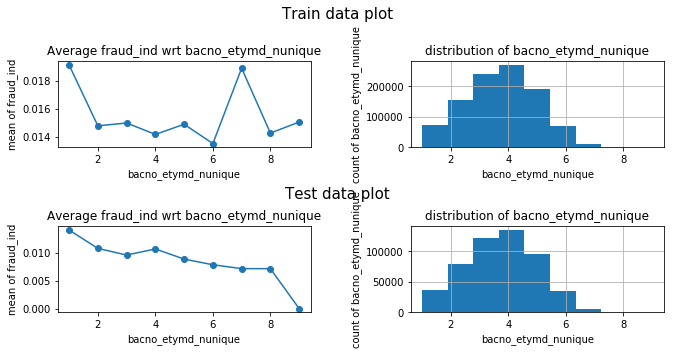

etymd_value_counts


<Figure size 432x288 with 0 Axes>

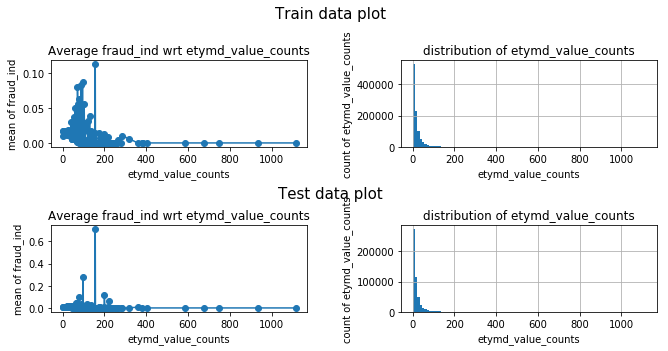

etymd_ratio


<Figure size 432x288 with 0 Axes>

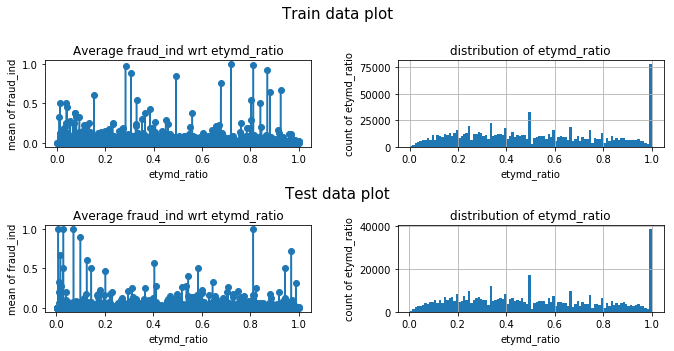

bacno_stscd_nunique


<Figure size 432x288 with 0 Axes>

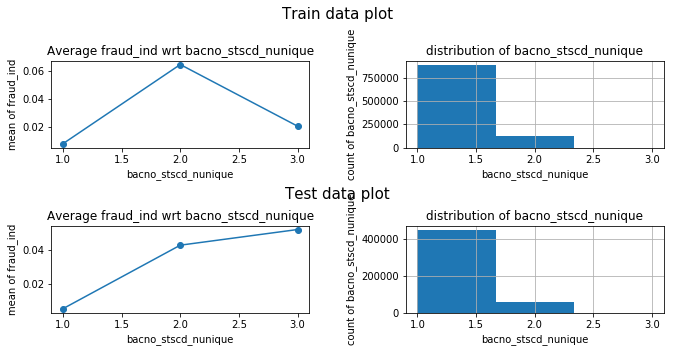

stscd_value_counts


<Figure size 432x288 with 0 Axes>

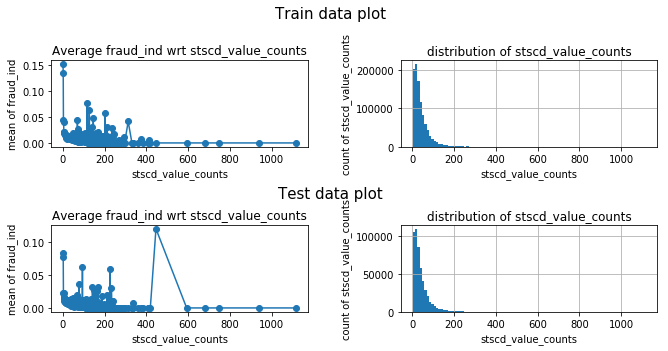

stscd_ratio


<Figure size 432x288 with 0 Axes>

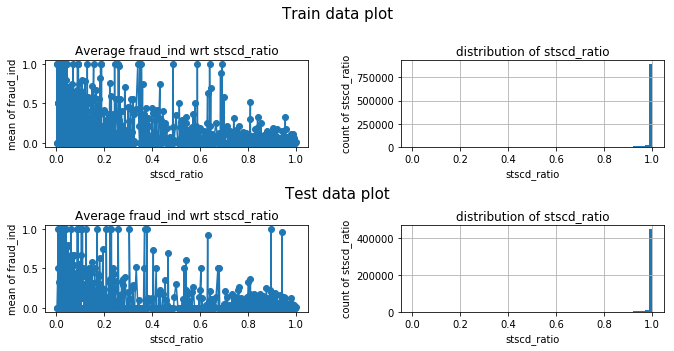

bacno_hcefg_nunique


<Figure size 432x288 with 0 Axes>

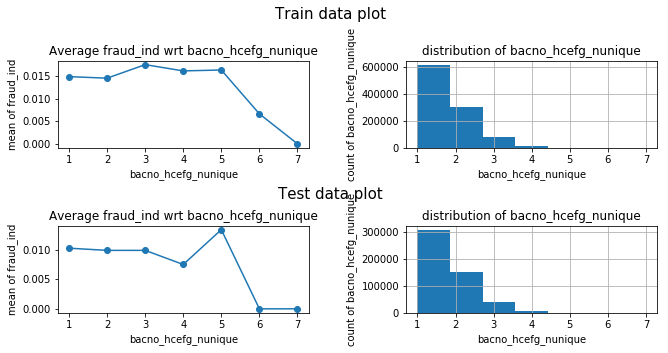

hcefg_value_counts


<Figure size 432x288 with 0 Axes>

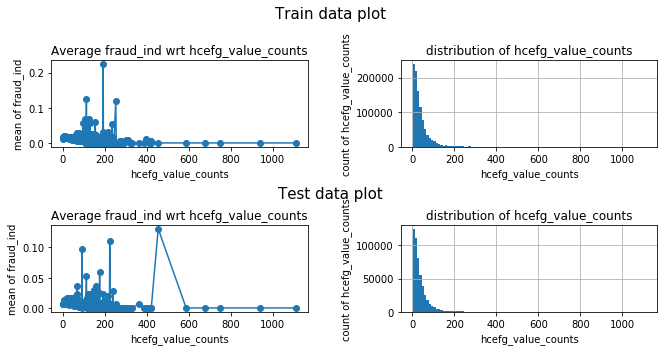

hcefg_ratio


<Figure size 432x288 with 0 Axes>

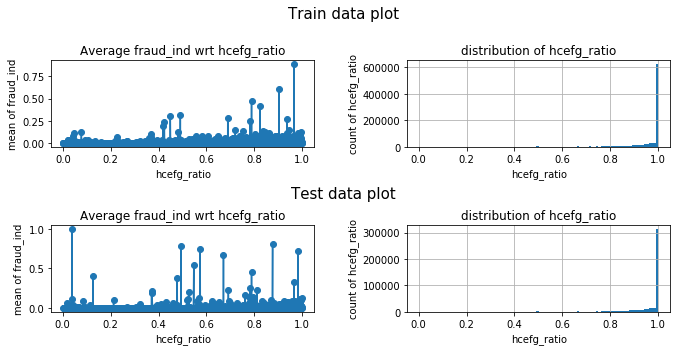

cano_txkey_nunique


<Figure size 432x288 with 0 Axes>

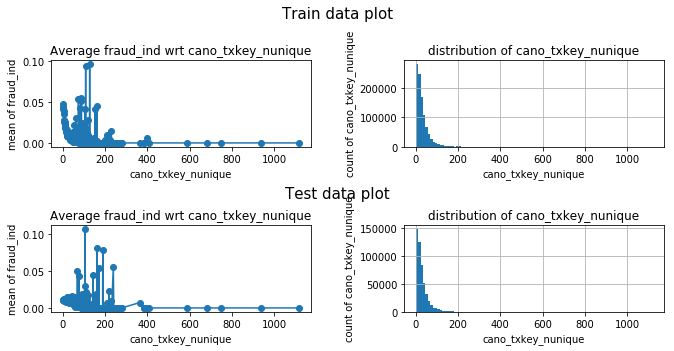

cano_stocn_nunique


<Figure size 432x288 with 0 Axes>

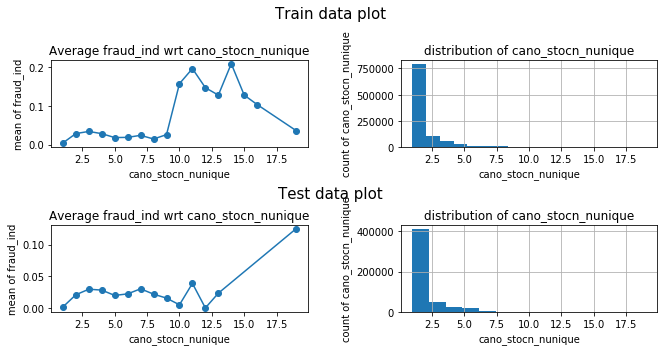

stocn_value_counts_cano


<Figure size 432x288 with 0 Axes>

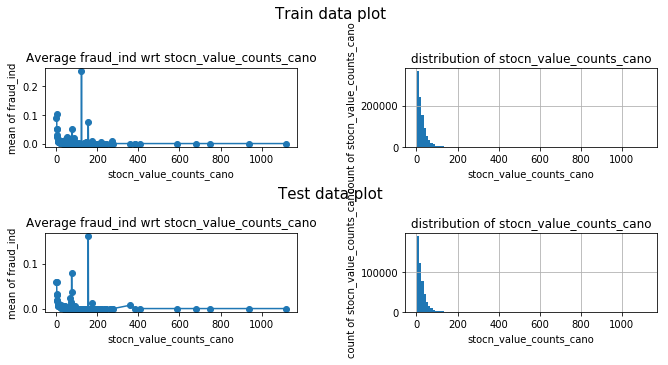

stocn_ratio_cano


<Figure size 432x288 with 0 Axes>

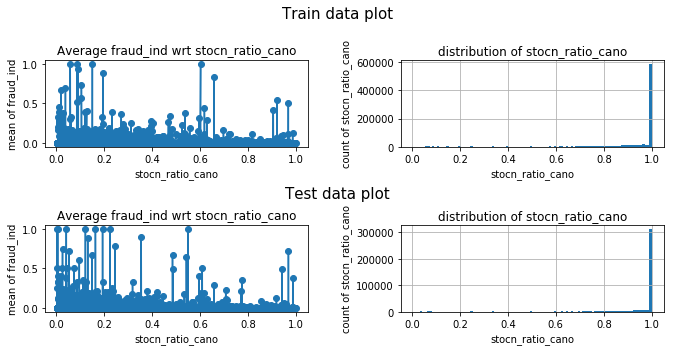

cano_csmcu_nunique


<Figure size 432x288 with 0 Axes>

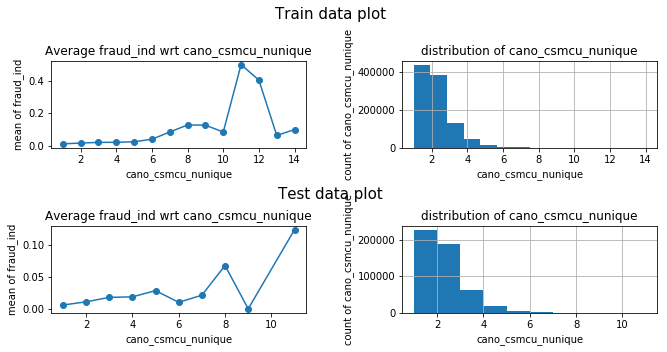

csmcu_value_counts_cano


<Figure size 432x288 with 0 Axes>

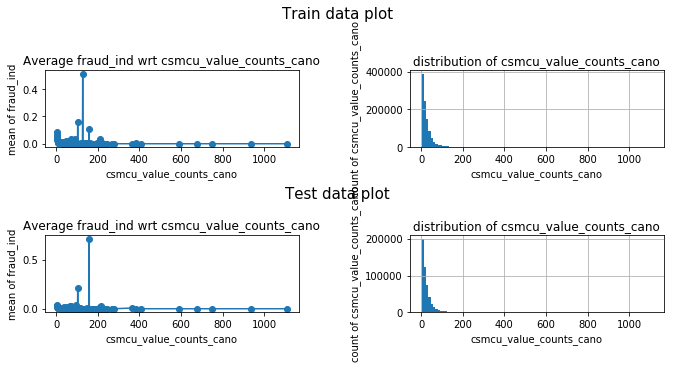

csmcu_ratio_cano


<Figure size 432x288 with 0 Axes>

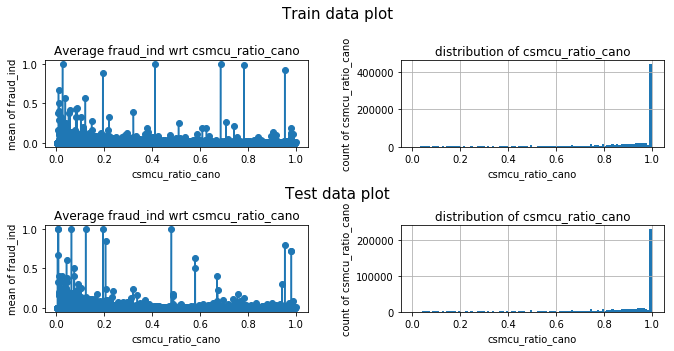

cano_mchno_nunique


<Figure size 432x288 with 0 Axes>

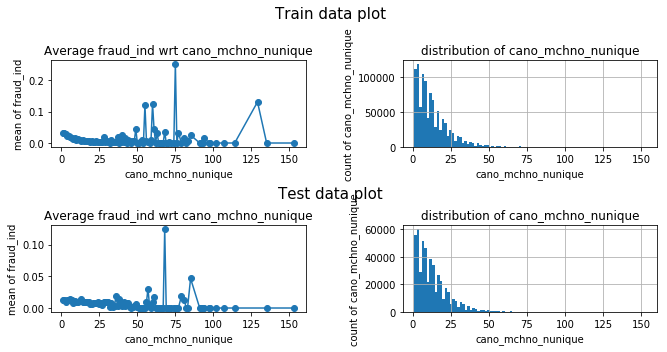

mchno_value_counts_cano


<Figure size 432x288 with 0 Axes>

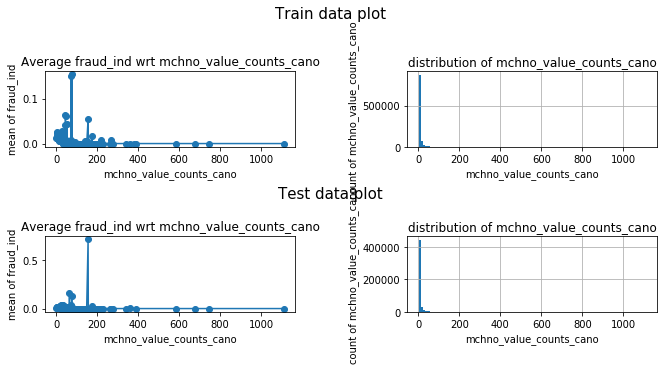

mchno_ratio_cano


<Figure size 432x288 with 0 Axes>

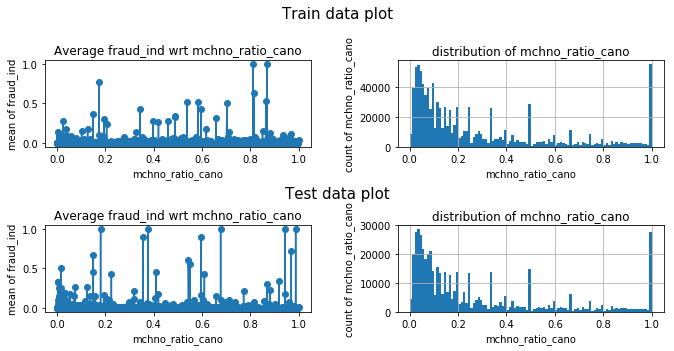

cano_acqic_nunique


<Figure size 432x288 with 0 Axes>

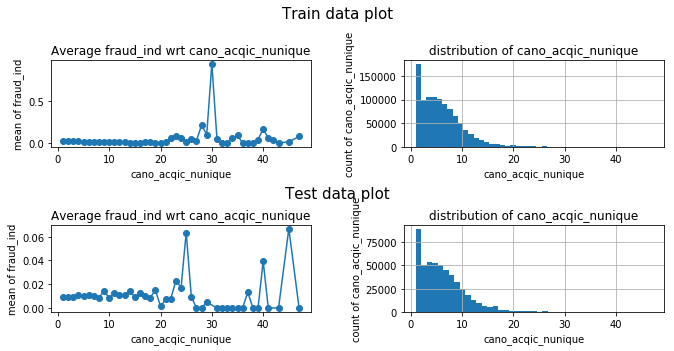

acqic_value_counts_cano


<Figure size 432x288 with 0 Axes>

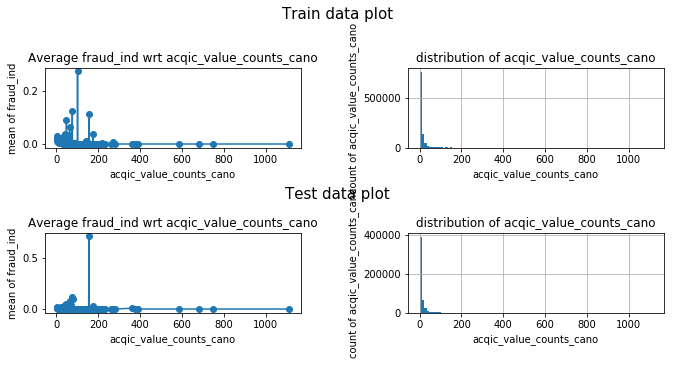

acqic_ratio_cano


<Figure size 432x288 with 0 Axes>

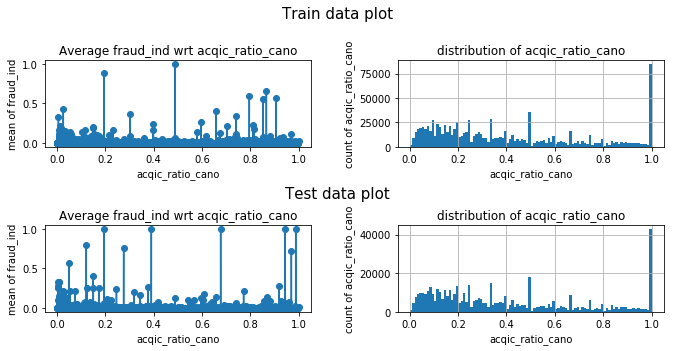

cano_mcc_nunique


<Figure size 432x288 with 0 Axes>

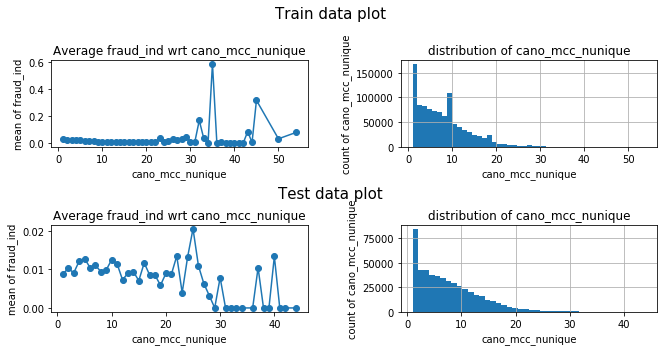

mcc_value_counts_cano


<Figure size 432x288 with 0 Axes>

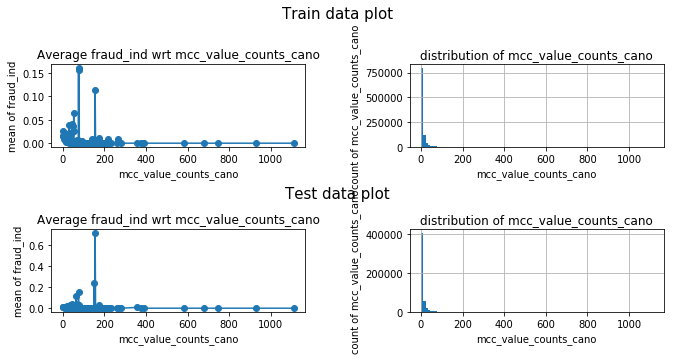

mcc_ratio_cano


<Figure size 432x288 with 0 Axes>

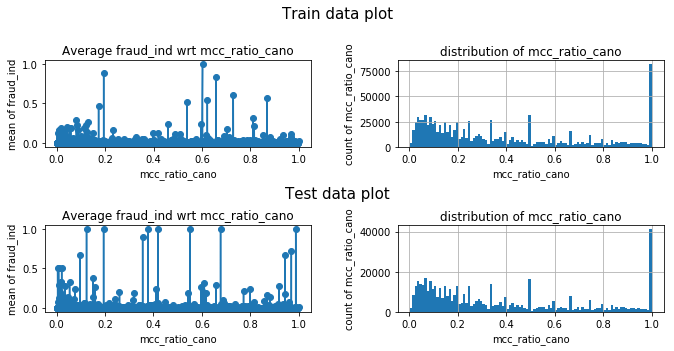

cano_scity_nunique


<Figure size 432x288 with 0 Axes>

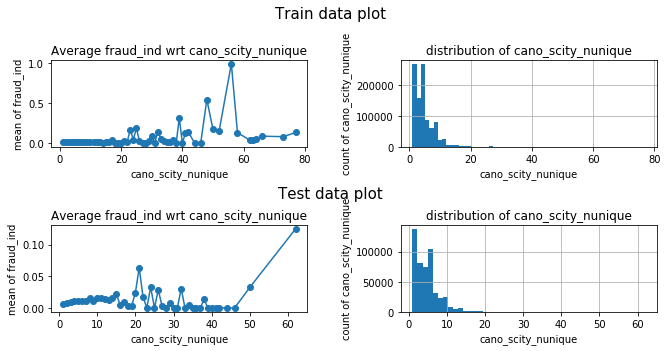

scity_value_counts_cano


<Figure size 432x288 with 0 Axes>

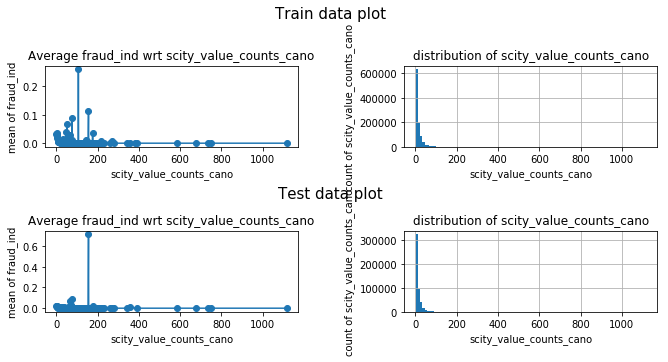

scity_ratio_cano


<Figure size 432x288 with 0 Axes>

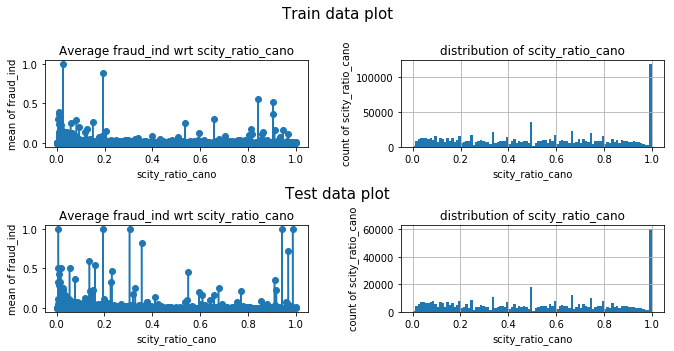

cano_contp_nunique


<Figure size 432x288 with 0 Axes>

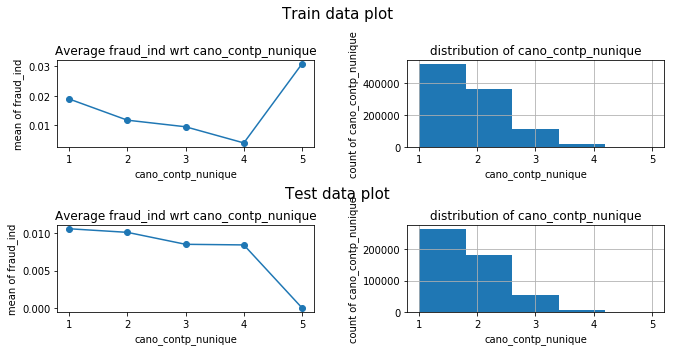

contp_value_counts_cano


<Figure size 432x288 with 0 Axes>

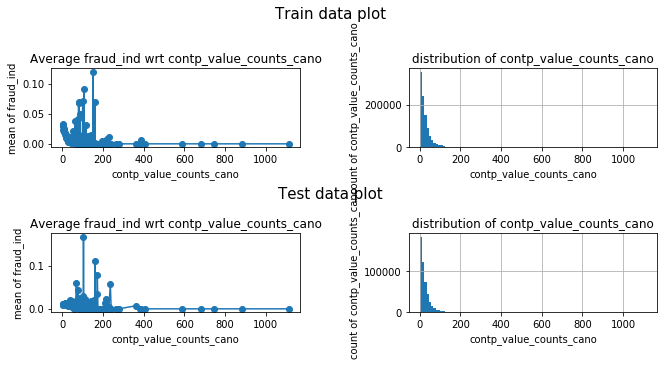

contp_ratio_cano


<Figure size 432x288 with 0 Axes>

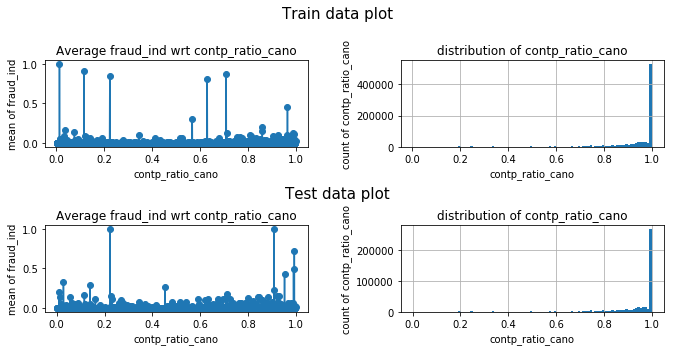

cano_etymd_nunique


<Figure size 432x288 with 0 Axes>

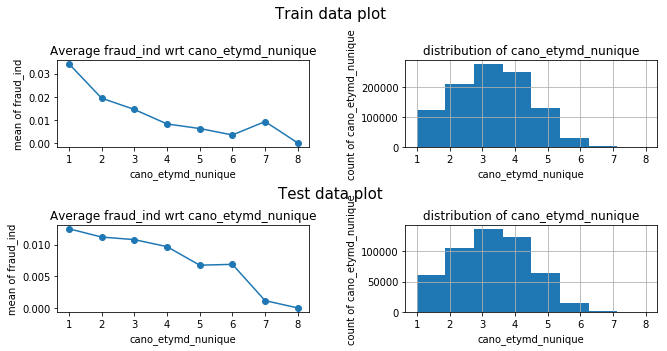

etymd_value_counts_cano


<Figure size 432x288 with 0 Axes>

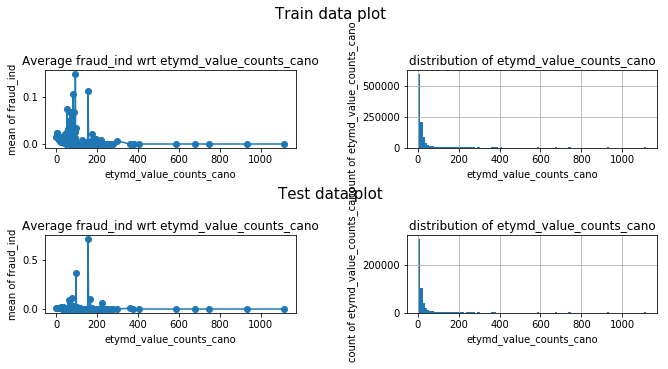

etymd_ratio_cano


<Figure size 432x288 with 0 Axes>

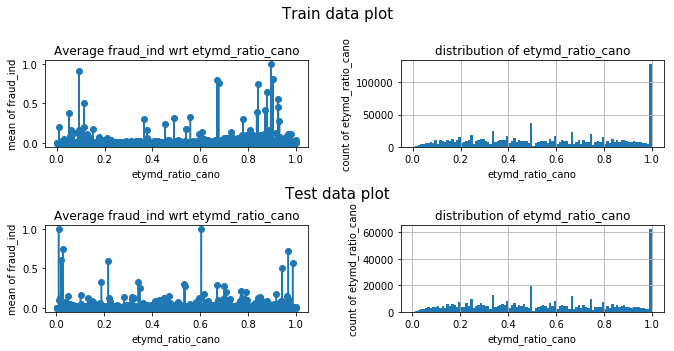

cano_stscd_nunique


<Figure size 432x288 with 0 Axes>

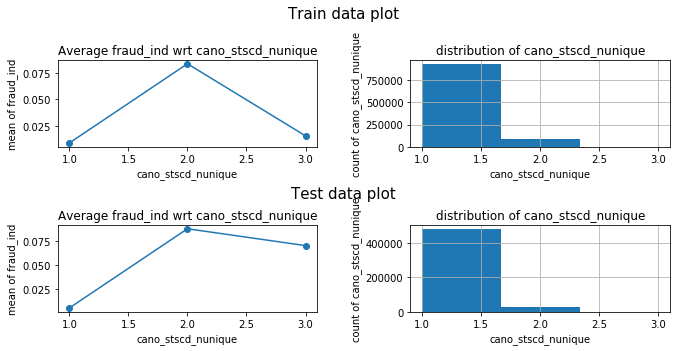

stscd_value_counts_cano


<Figure size 432x288 with 0 Axes>

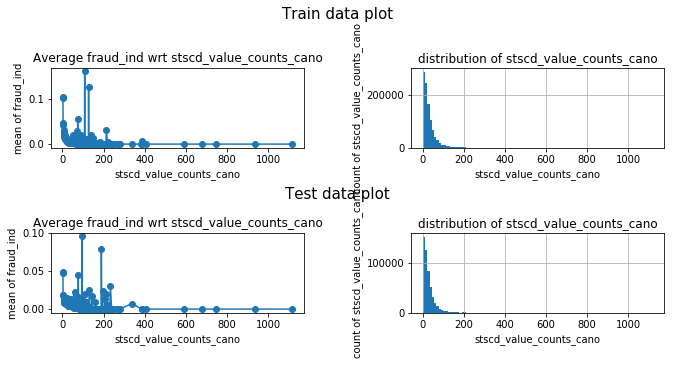

stscd_ratio_cano


<Figure size 432x288 with 0 Axes>

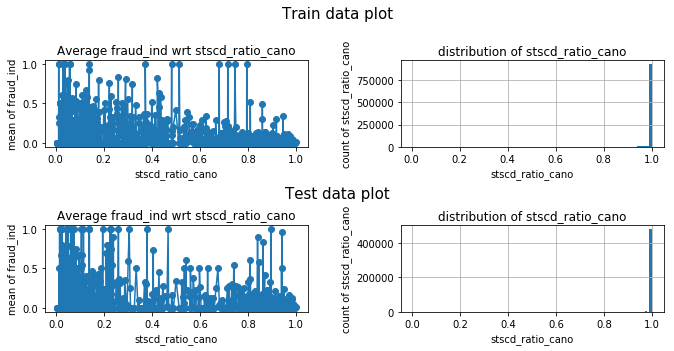

cano_hcefg_nunique


<Figure size 432x288 with 0 Axes>

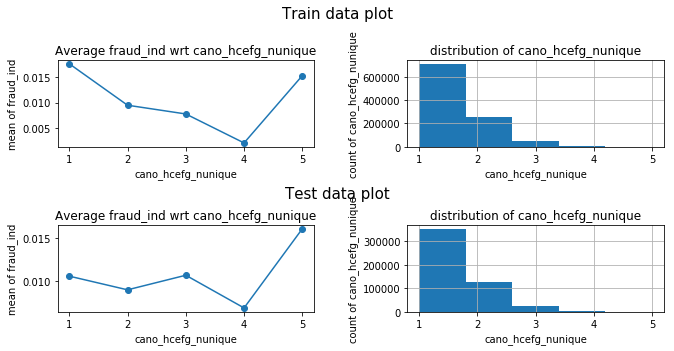

hcefg_value_counts_cano


<Figure size 432x288 with 0 Axes>

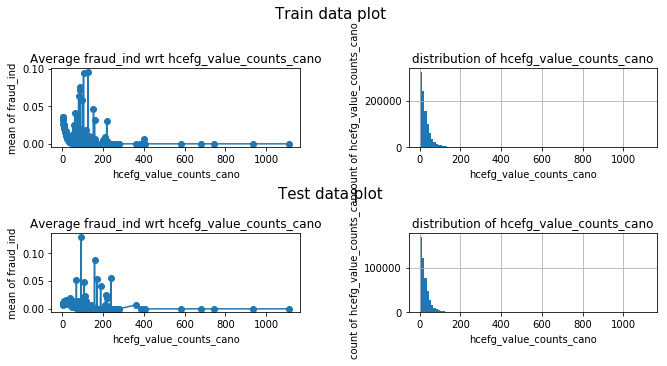

hcefg_ratio_cano


<Figure size 432x288 with 0 Axes>

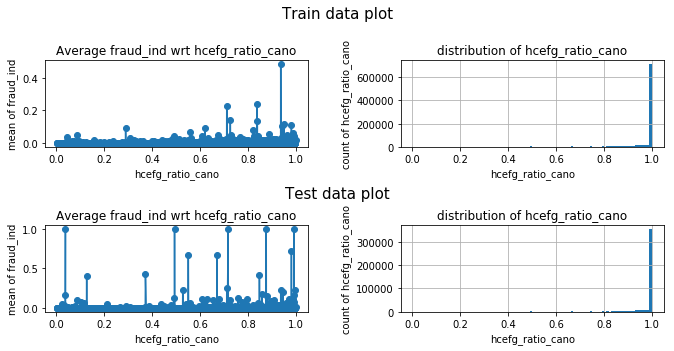

cano_only_consecutive_stscd2


<Figure size 432x288 with 0 Axes>

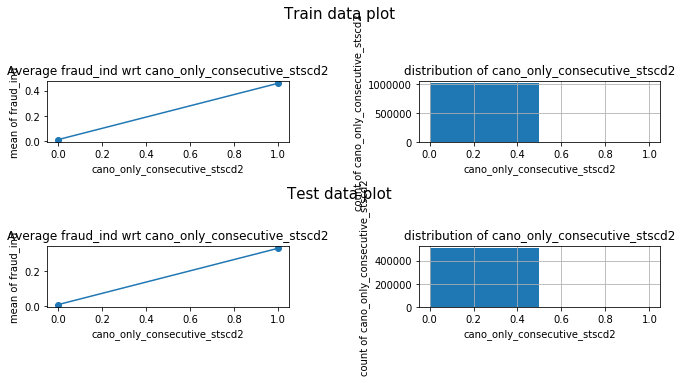

bacno_consecutive_and_only_ecfg


<Figure size 432x288 with 0 Axes>

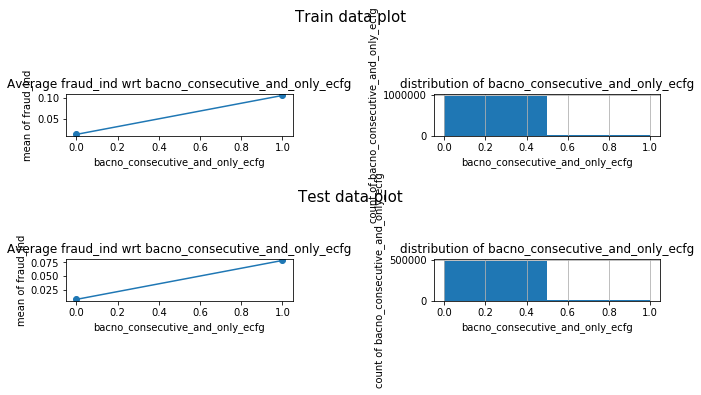

cano_lastday_use


<Figure size 432x288 with 0 Axes>

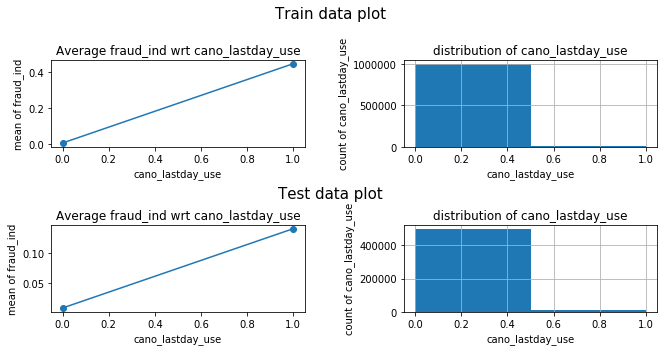

cano_lastday_use_twokind


<Figure size 432x288 with 0 Axes>

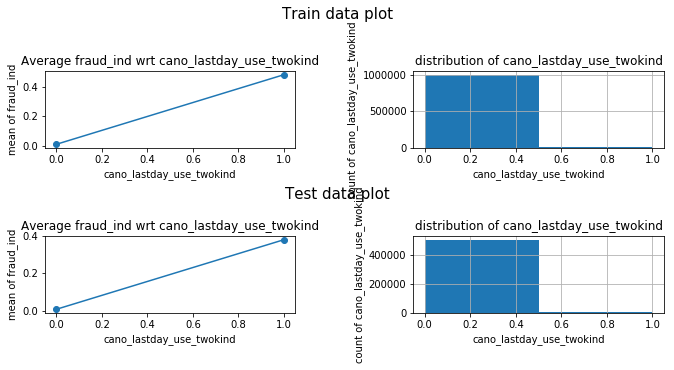

cano_lastlocdt


<Figure size 432x288 with 0 Axes>

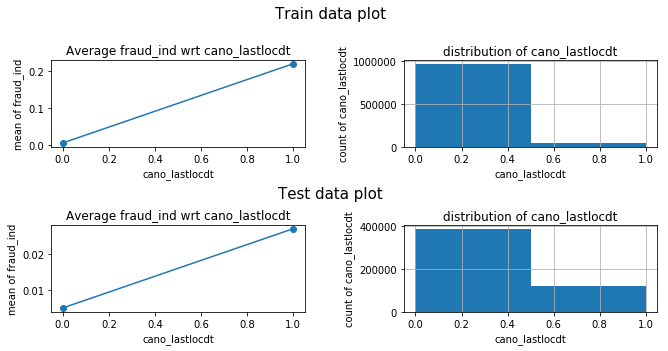

bacno_lastlocdt


<Figure size 432x288 with 0 Axes>

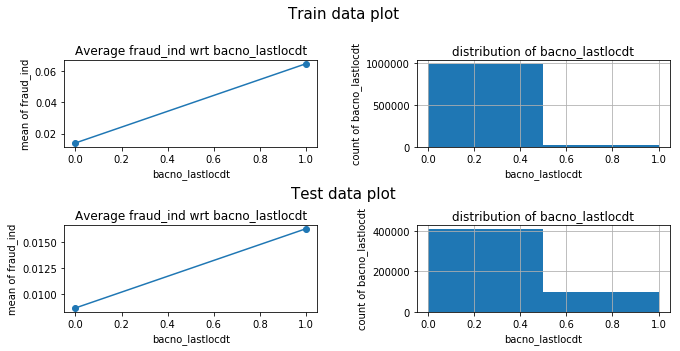

cano_lastlocdt2


<Figure size 432x288 with 0 Axes>

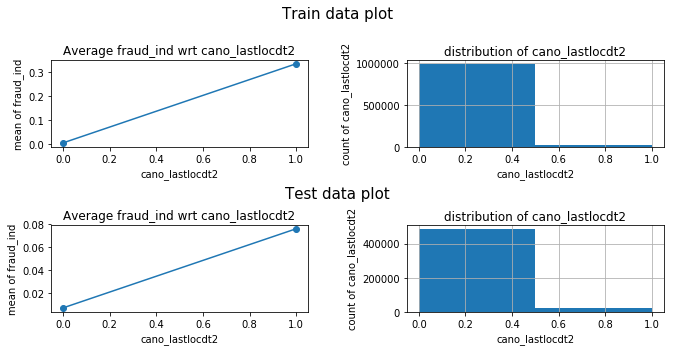

bacno_stscd_equal2


<Figure size 432x288 with 0 Axes>

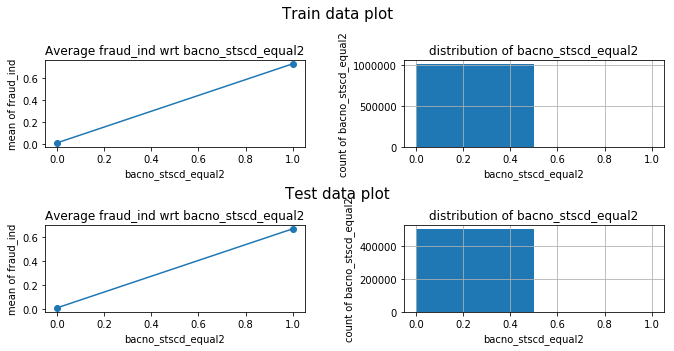

bacno_ecfg_equal1


<Figure size 432x288 with 0 Axes>

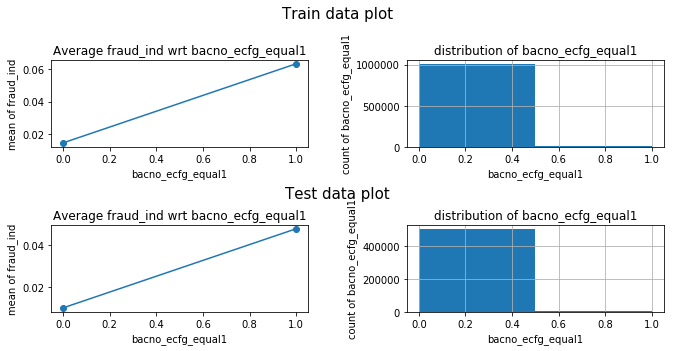

bacno_1_count


<Figure size 432x288 with 0 Axes>

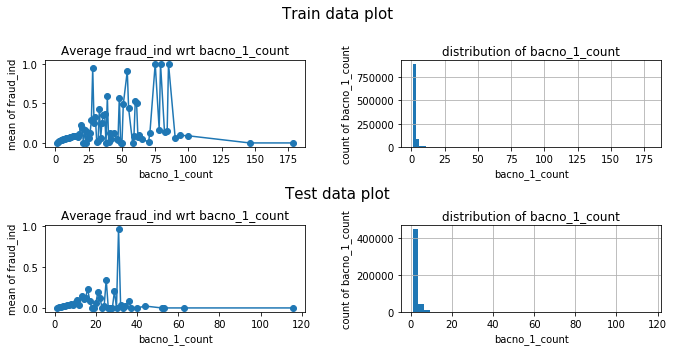

bacno_2day_count


<Figure size 432x288 with 0 Axes>

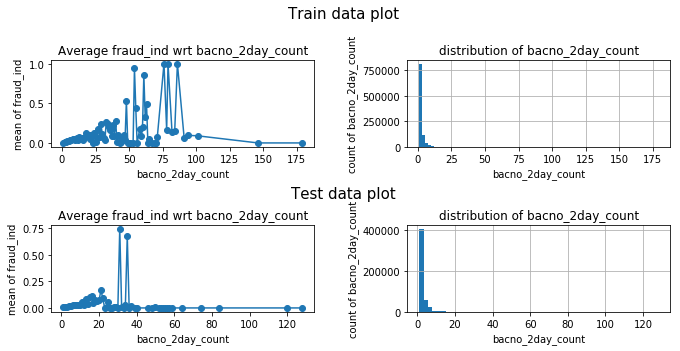

bacno_3day_count


<Figure size 432x288 with 0 Axes>

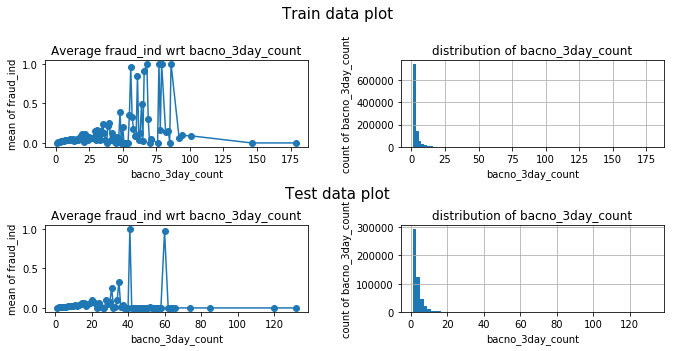

bacno_7day_count


<Figure size 432x288 with 0 Axes>

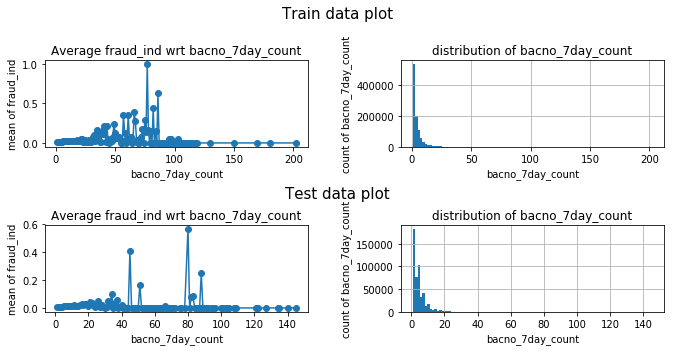

bacno_2day_after_count


<Figure size 432x288 with 0 Axes>

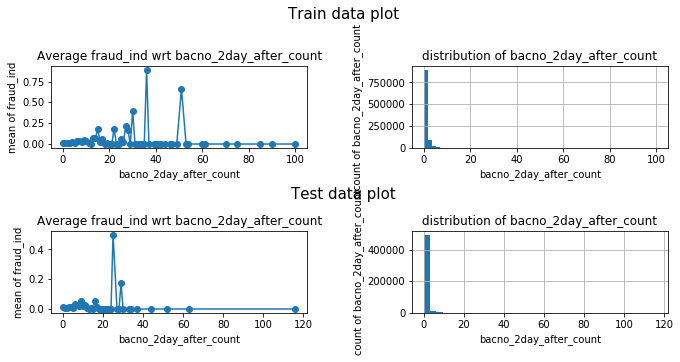

bacno_3day_after_count


<Figure size 432x288 with 0 Axes>

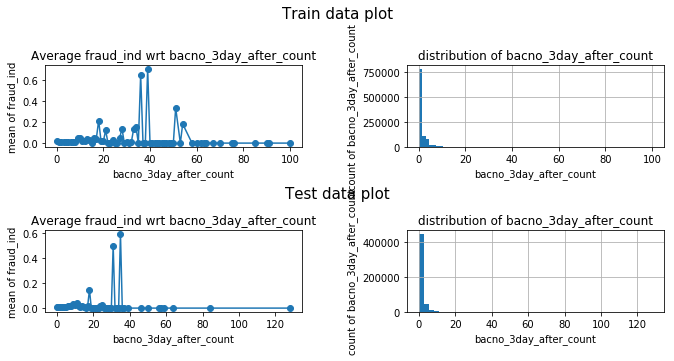

bacno_7day_after_count


<Figure size 432x288 with 0 Axes>

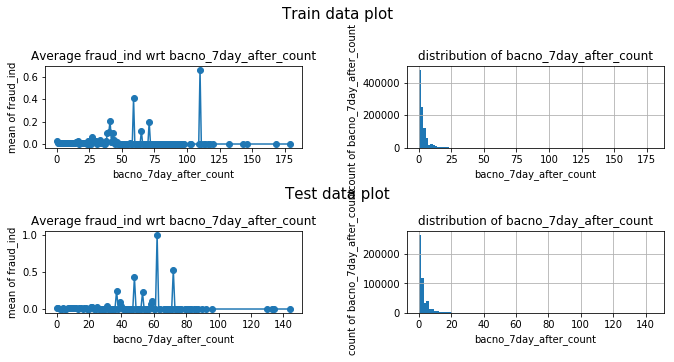

bacno_cano_changetimes


<Figure size 432x288 with 0 Axes>

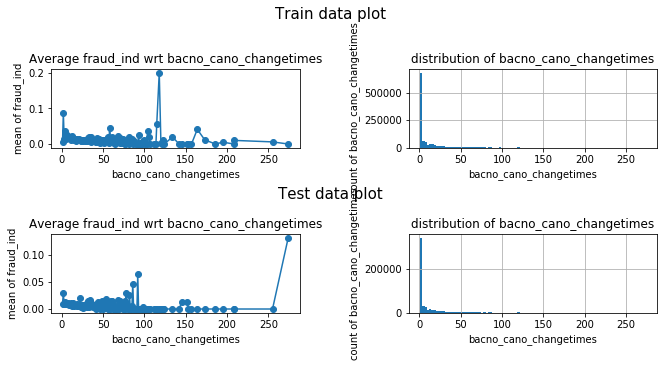

cano_change_ratio


<Figure size 432x288 with 0 Axes>

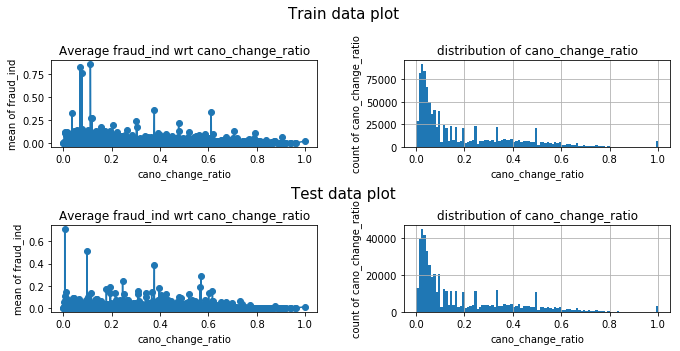

bacno_locdt_diff


<Figure size 432x288 with 0 Axes>

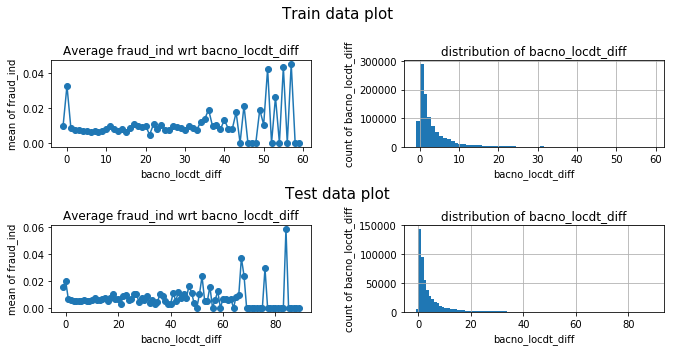

bacno_loctm_diff


<Figure size 432x288 with 0 Axes>

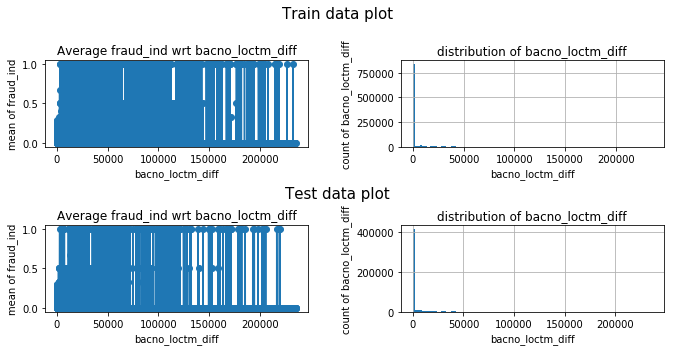

bacno_cano_monoincrease


<Figure size 432x288 with 0 Axes>

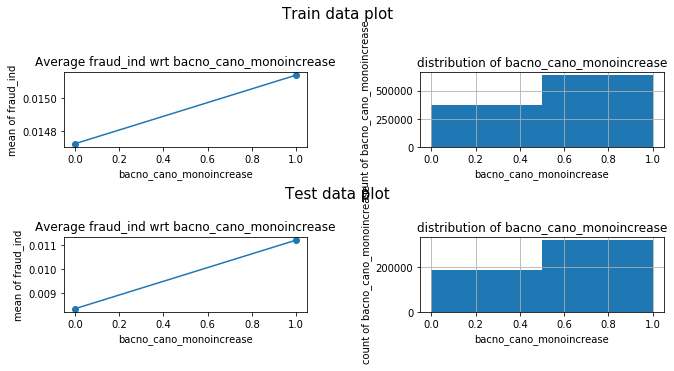

bacno_contp_mode


<Figure size 432x288 with 0 Axes>

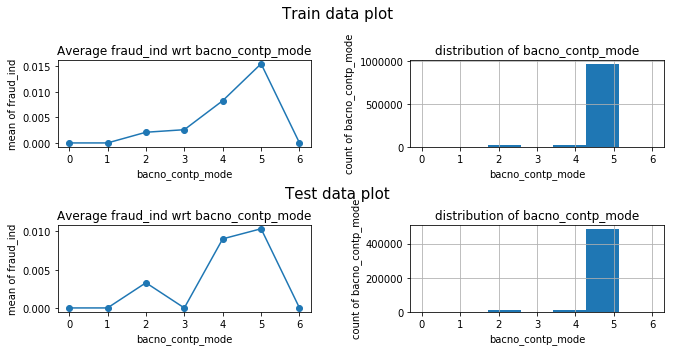

cano_contp_mode


<Figure size 432x288 with 0 Axes>

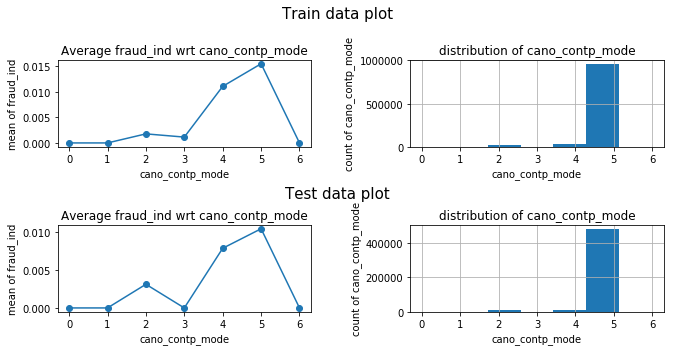

bacno_etymd_mode


<Figure size 432x288 with 0 Axes>

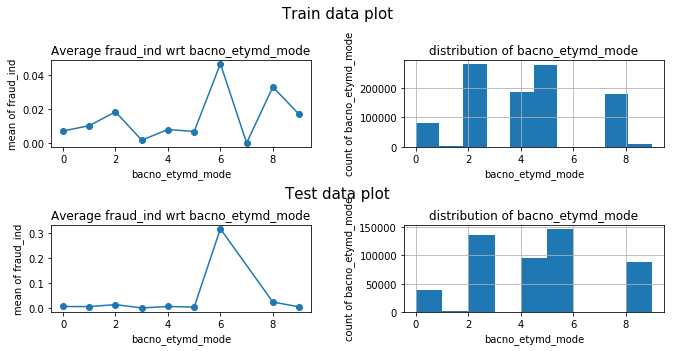

cano_etymd_mode


<Figure size 432x288 with 0 Axes>

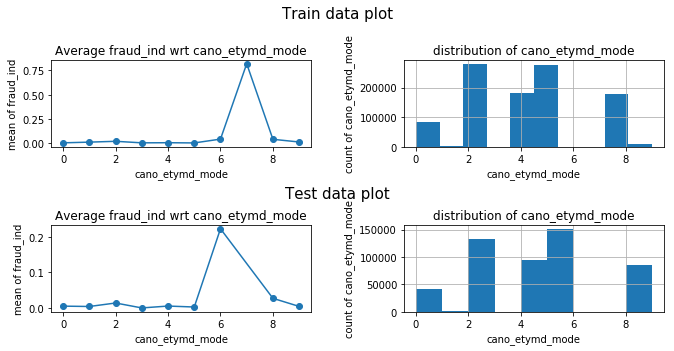

bacno_mchno_mode


<Figure size 432x288 with 0 Axes>

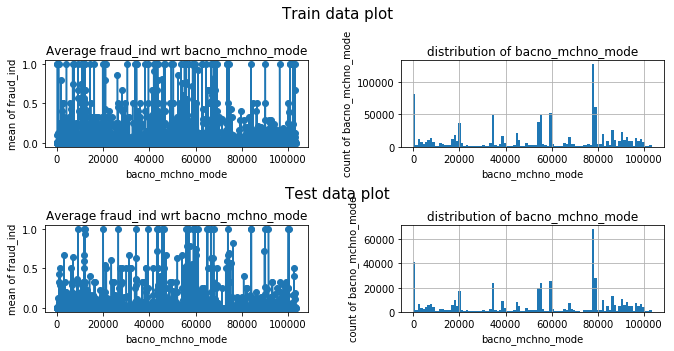

cano_mchno_mode


<Figure size 432x288 with 0 Axes>

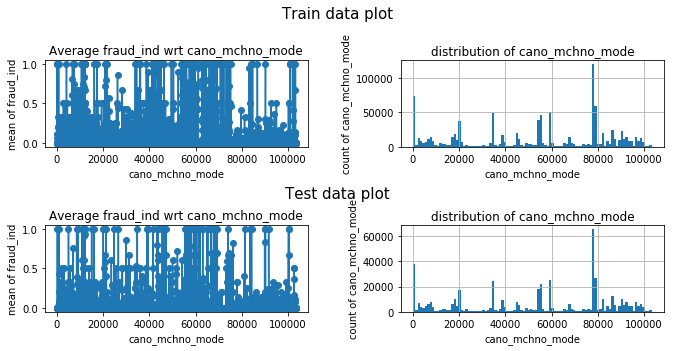

bacno_acqic_mode


<Figure size 432x288 with 0 Axes>

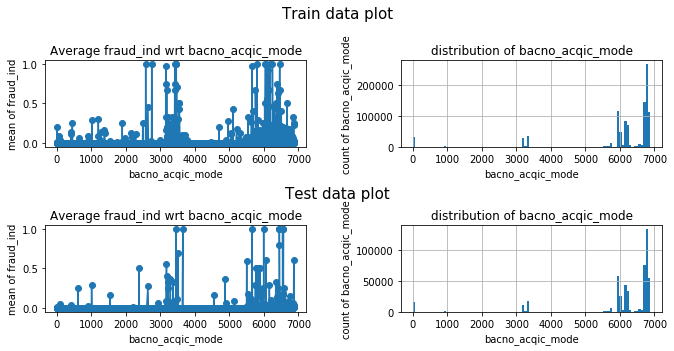

cano_acqic_mode


<Figure size 432x288 with 0 Axes>

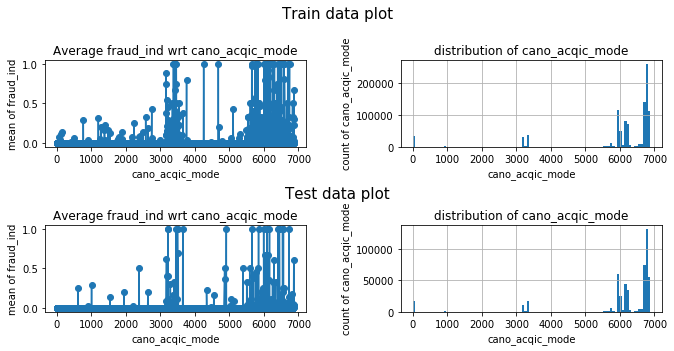

bacno_mcc_mode


<Figure size 432x288 with 0 Axes>

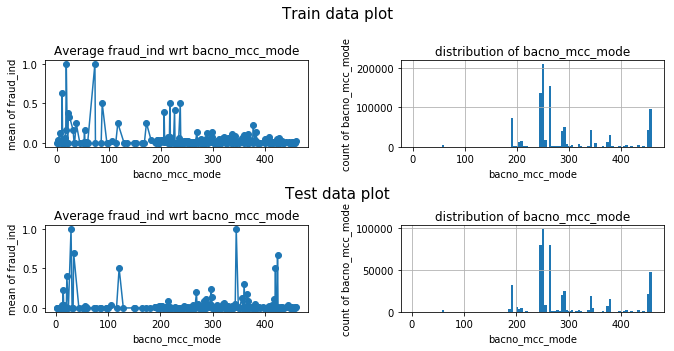

cano_mcc_mode


<Figure size 432x288 with 0 Axes>

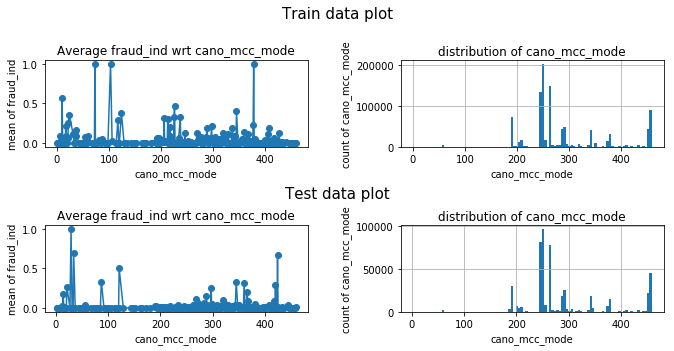

bacno_ecfg_mode


<Figure size 432x288 with 0 Axes>

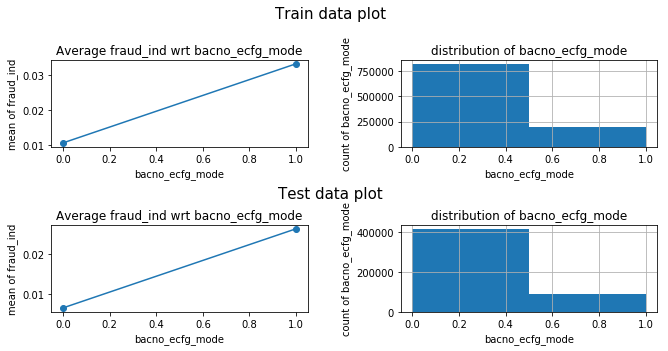

cano_ecfg_mode


<Figure size 432x288 with 0 Axes>

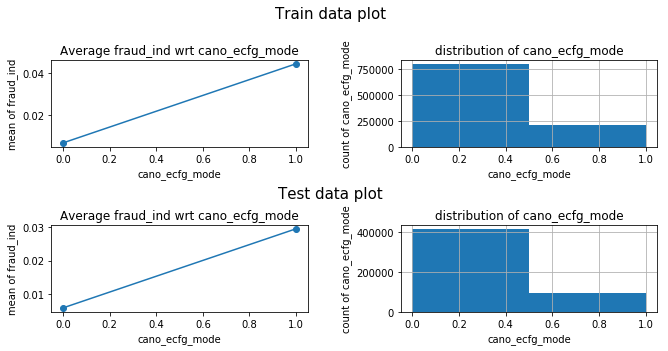

bacno_hcefg_mode


<Figure size 432x288 with 0 Axes>

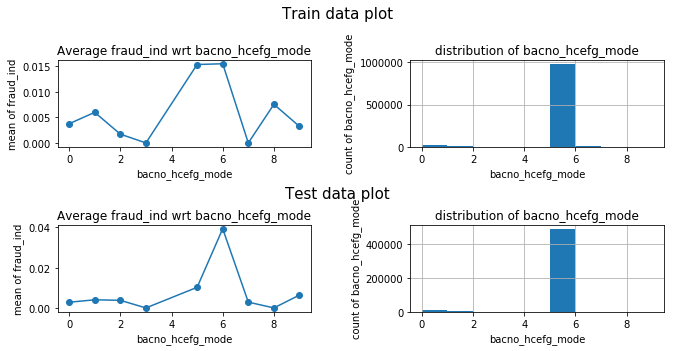

cano_hcefg_mode


<Figure size 432x288 with 0 Axes>

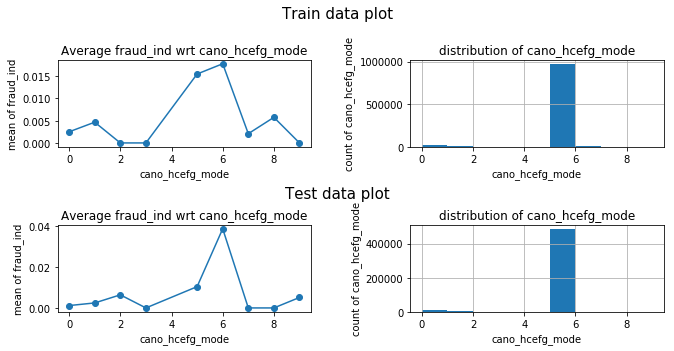

bacno_stscd_mode


<Figure size 432x288 with 0 Axes>

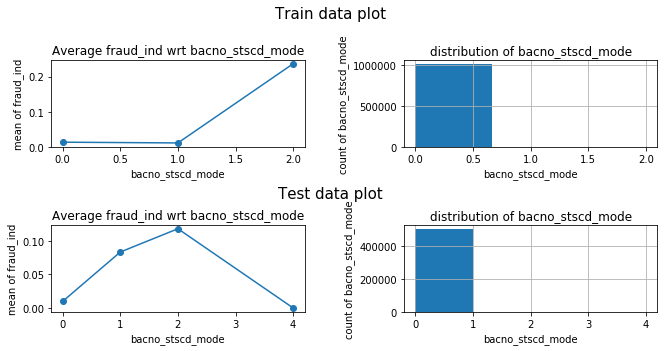

cano_stscd_mode


<Figure size 432x288 with 0 Axes>

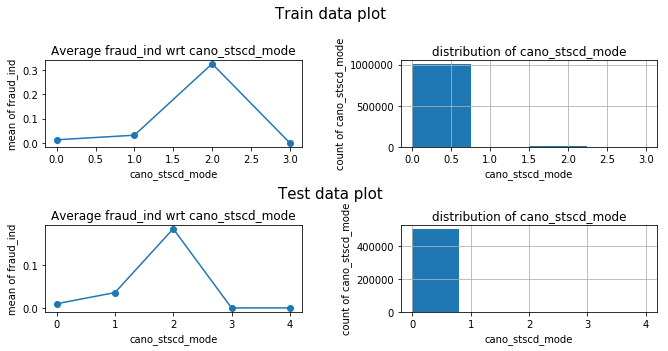

bacno_contp_diff1


<Figure size 432x288 with 0 Axes>

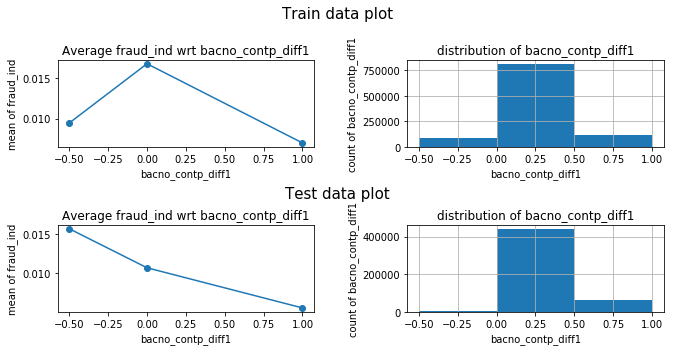

bacno_contp_diff2


<Figure size 432x288 with 0 Axes>

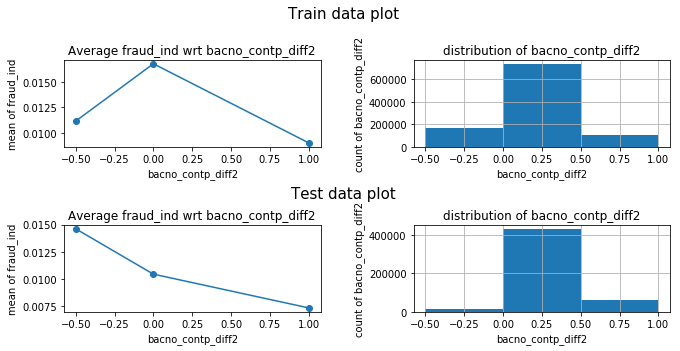

bacno_contp_diff3


<Figure size 432x288 with 0 Axes>

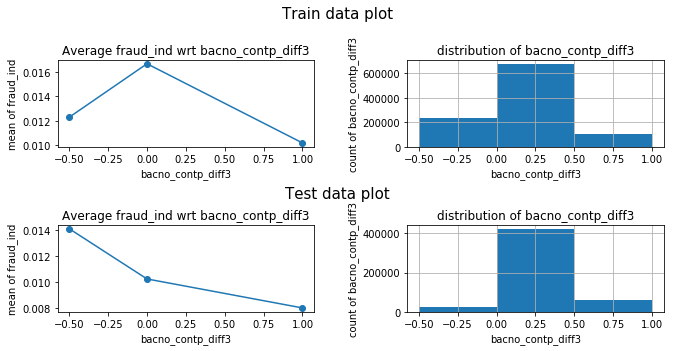

bacno_etymd_diff1


<Figure size 432x288 with 0 Axes>

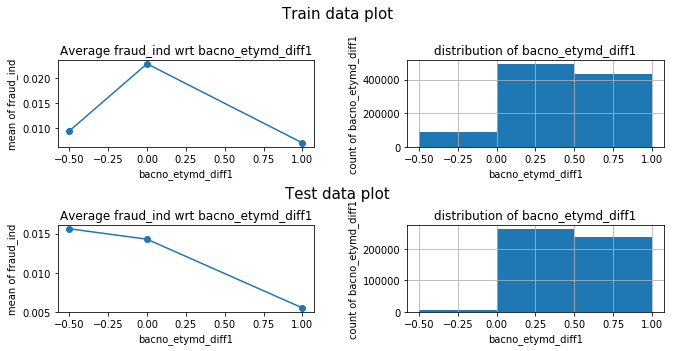

bacno_etymd_diff2


<Figure size 432x288 with 0 Axes>

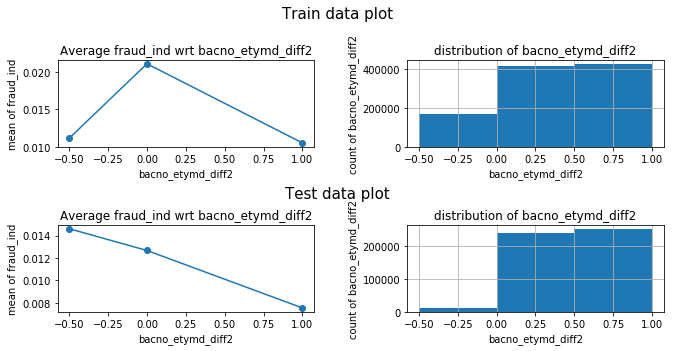

bacno_etymd_diff3


<Figure size 432x288 with 0 Axes>

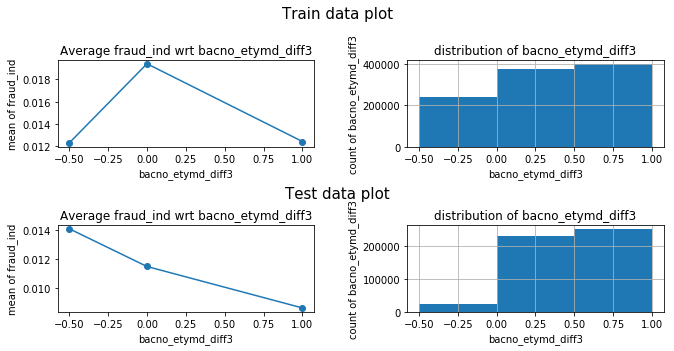

bacno_mchno_diff1


<Figure size 432x288 with 0 Axes>

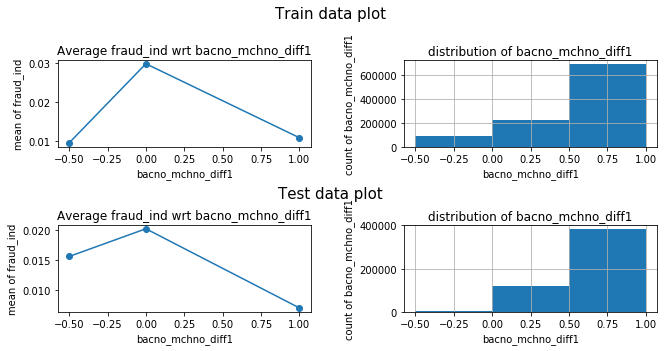

bacno_mchno_diff2


<Figure size 432x288 with 0 Axes>

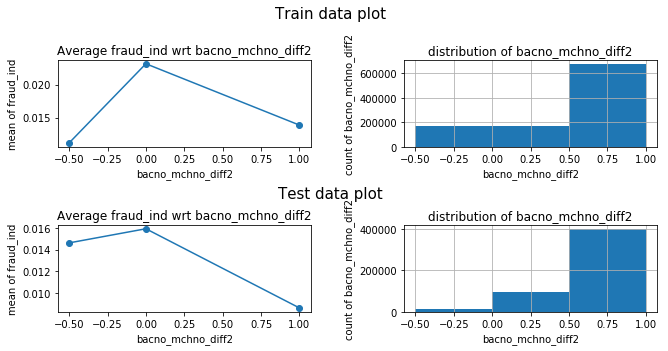

bacno_mchno_diff3


<Figure size 432x288 with 0 Axes>

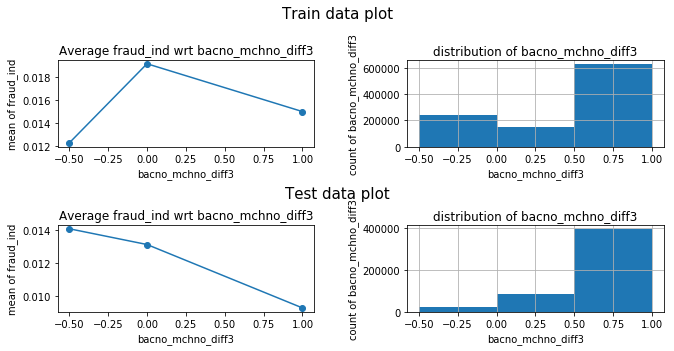

bacno_acqic_diff1


<Figure size 432x288 with 0 Axes>

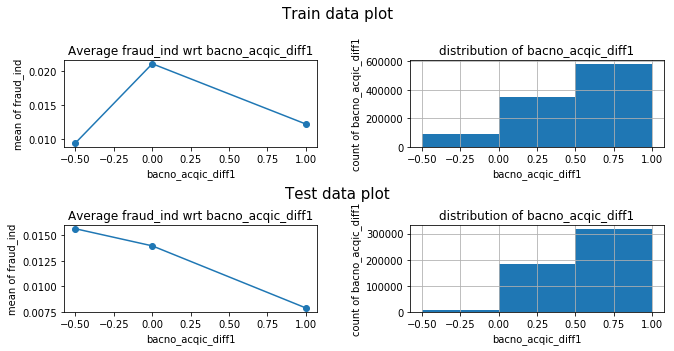

bacno_acqic_diff2


<Figure size 432x288 with 0 Axes>

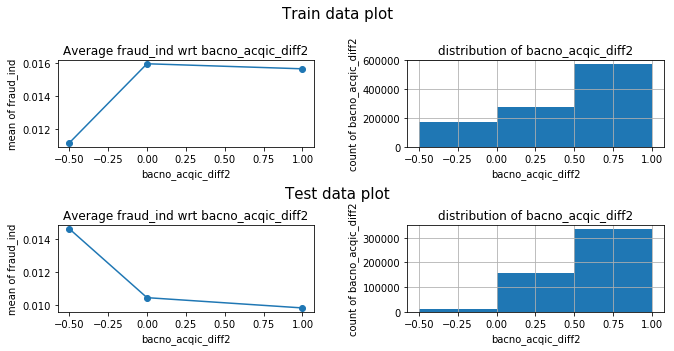

bacno_acqic_diff3


<Figure size 432x288 with 0 Axes>

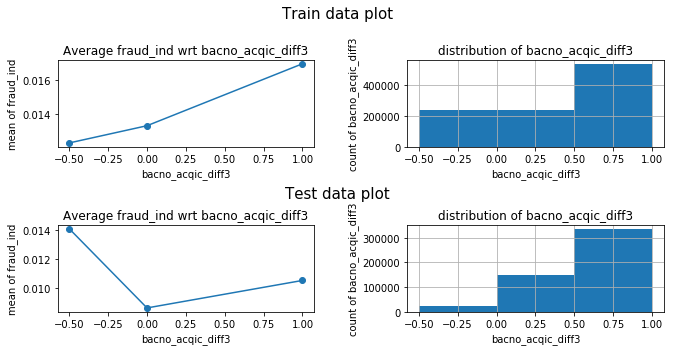

bacno_mcc_diff1


<Figure size 432x288 with 0 Axes>

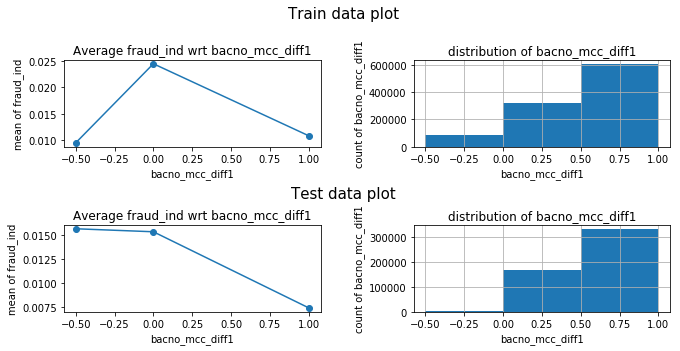

bacno_mcc_diff2


<Figure size 432x288 with 0 Axes>

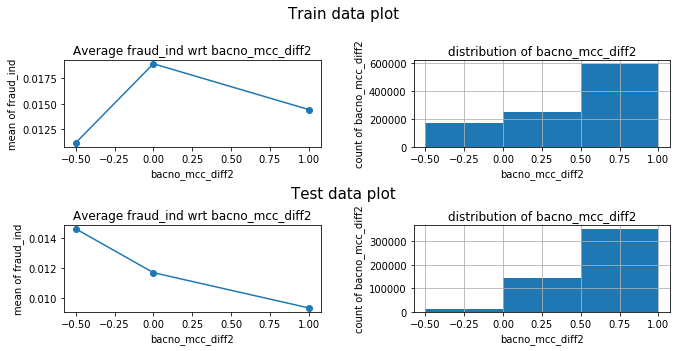

bacno_mcc_diff3


<Figure size 432x288 with 0 Axes>

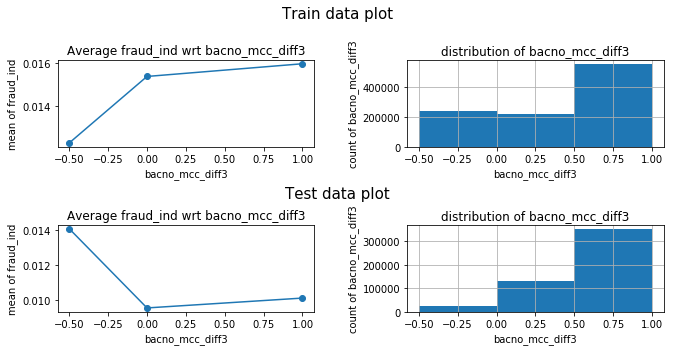

bacno_ecfg_diff1


<Figure size 432x288 with 0 Axes>

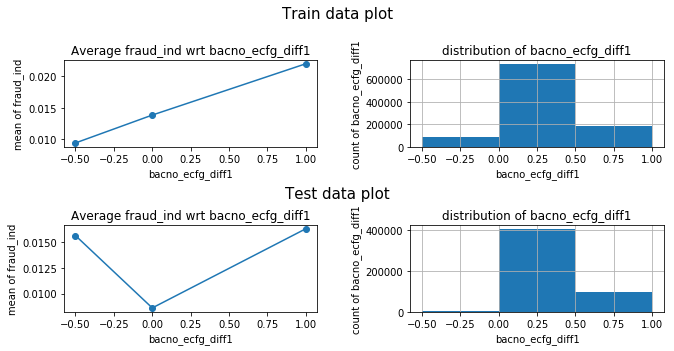

bacno_ecfg_diff2


<Figure size 432x288 with 0 Axes>

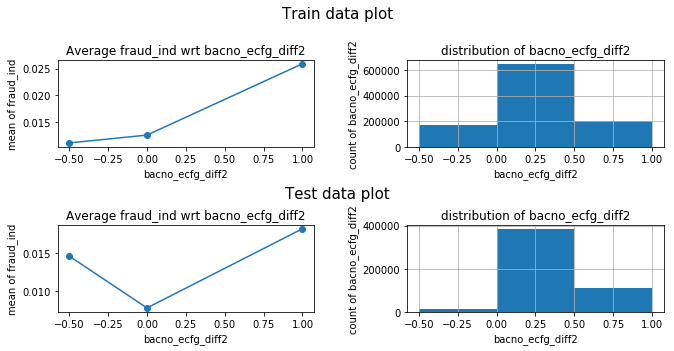

bacno_ecfg_diff3


<Figure size 432x288 with 0 Axes>

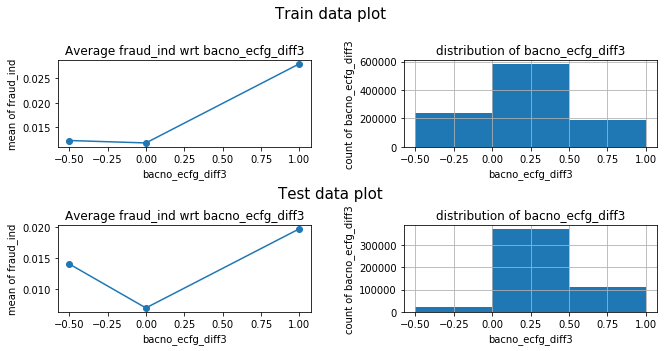

bacno_hcefg_diff1


<Figure size 432x288 with 0 Axes>

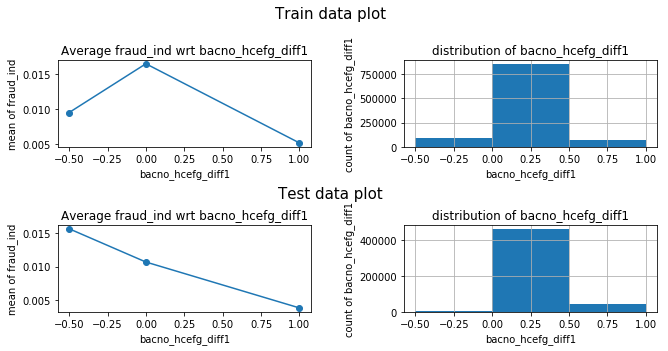

bacno_hcefg_diff2


<Figure size 432x288 with 0 Axes>

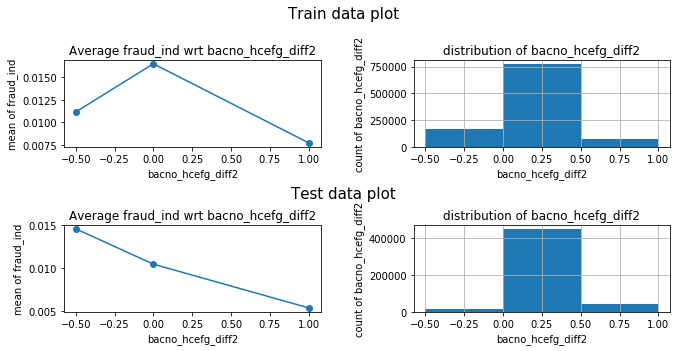

bacno_hcefg_diff3


<Figure size 432x288 with 0 Axes>

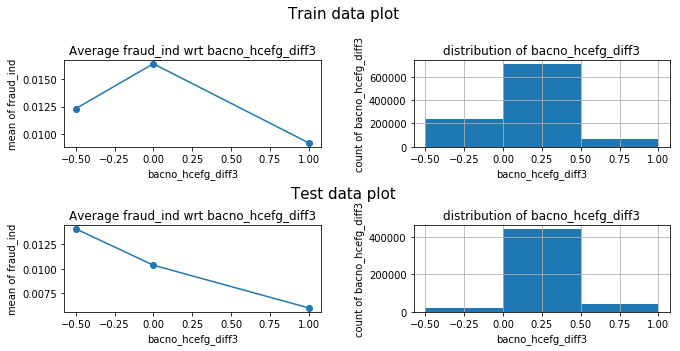

bacno_stscd_diff1


<Figure size 432x288 with 0 Axes>

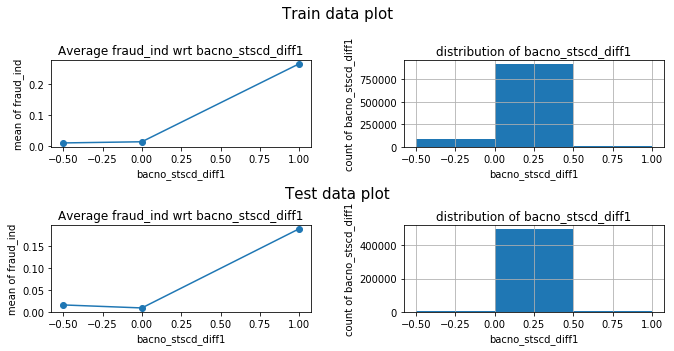

bacno_stscd_diff2


<Figure size 432x288 with 0 Axes>

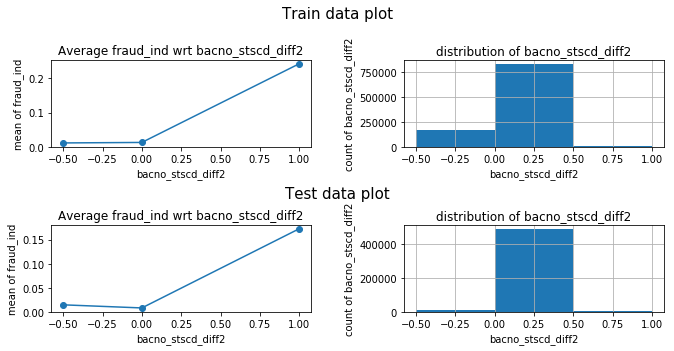

bacno_stscd_diff3


<Figure size 432x288 with 0 Axes>

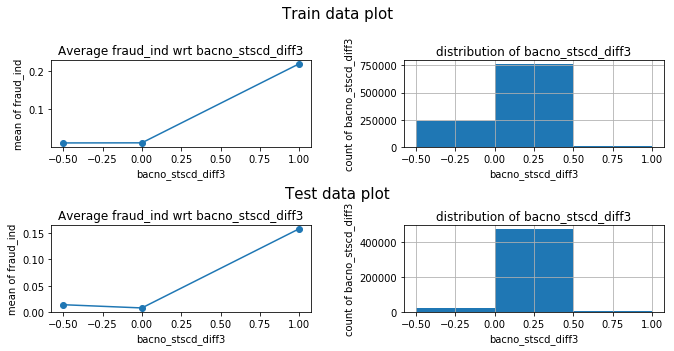

bacno_stocn_diff1


<Figure size 432x288 with 0 Axes>

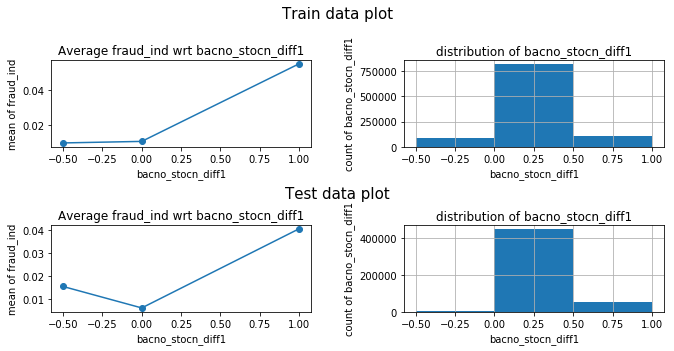

bacno_stocn_diff2


<Figure size 432x288 with 0 Axes>

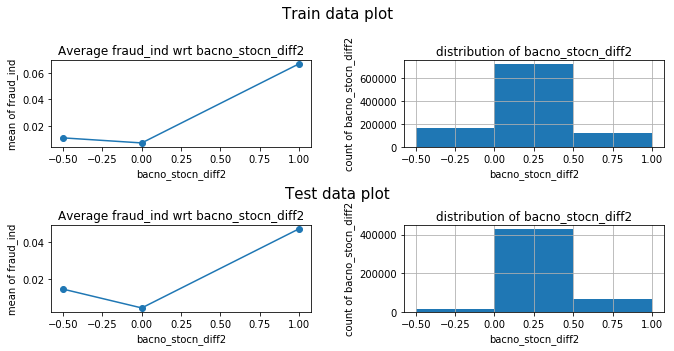

bacno_stocn_diff3


<Figure size 432x288 with 0 Axes>

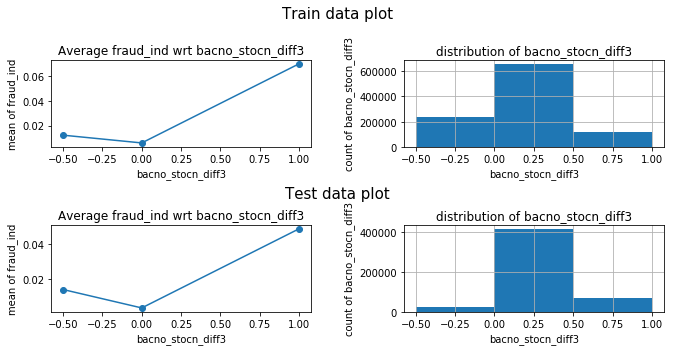

bacno_scity_diff1


<Figure size 432x288 with 0 Axes>

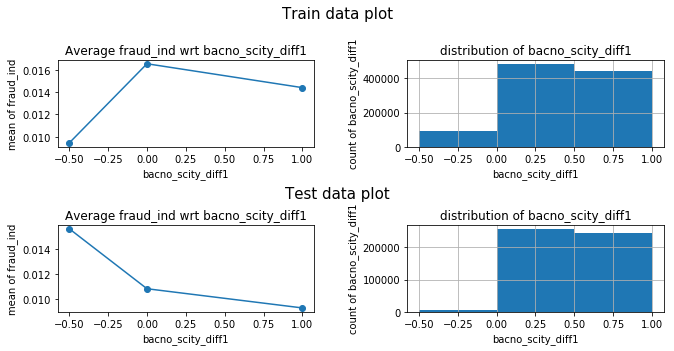

bacno_scity_diff2


<Figure size 432x288 with 0 Axes>

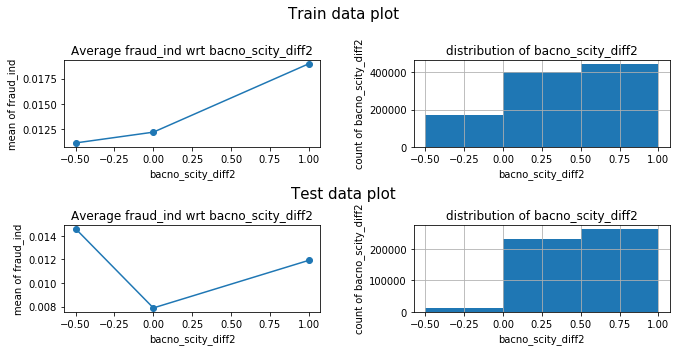

bacno_scity_diff3


<Figure size 432x288 with 0 Axes>

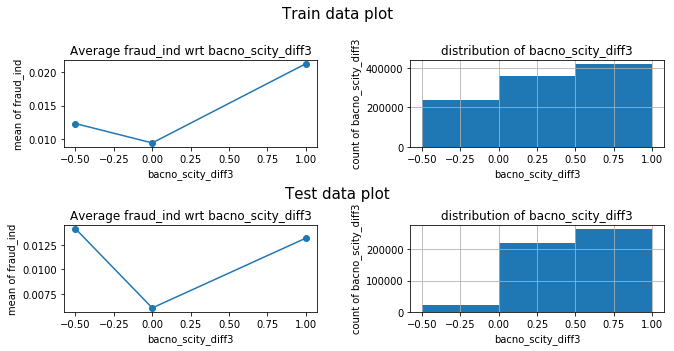

bacno_csmcu_diff1


<Figure size 432x288 with 0 Axes>

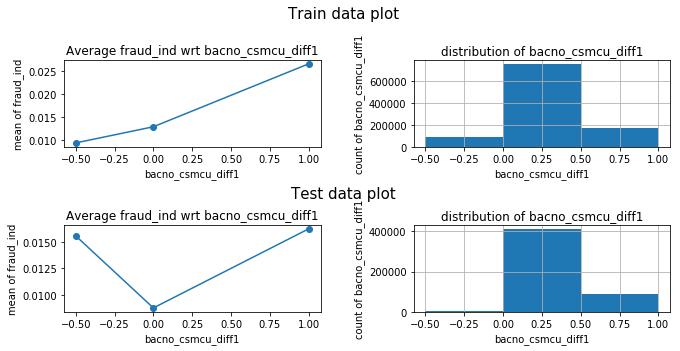

bacno_csmcu_diff2


<Figure size 432x288 with 0 Axes>

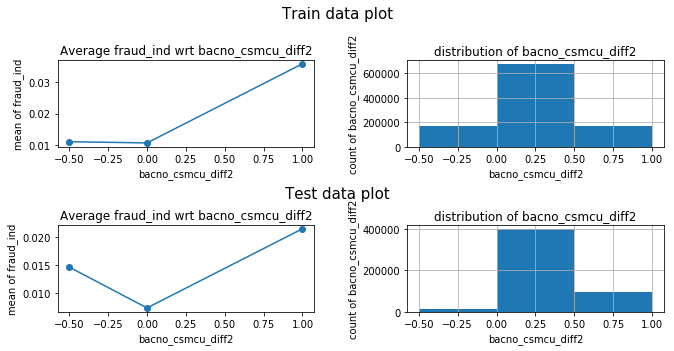

bacno_csmcu_diff3


<Figure size 432x288 with 0 Axes>

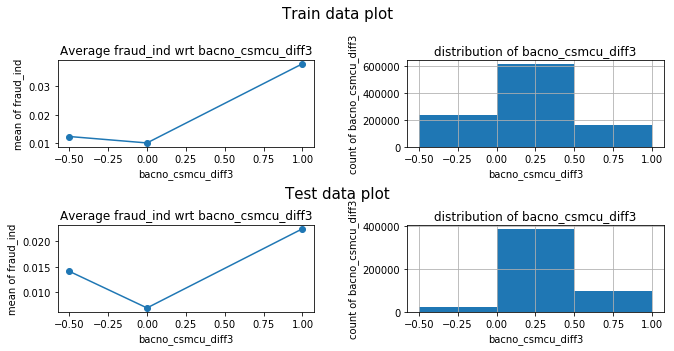

cano_contp_diff1


<Figure size 432x288 with 0 Axes>

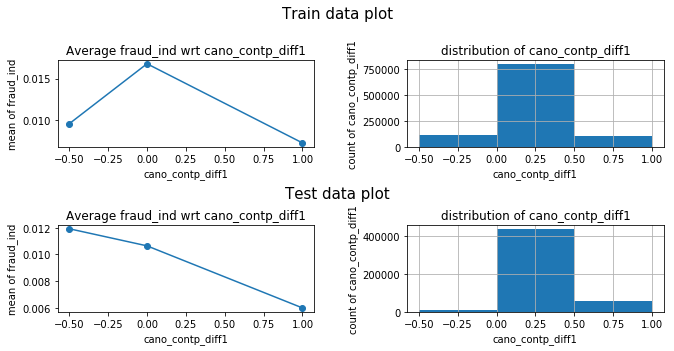

cano_contp_diff2


<Figure size 432x288 with 0 Axes>

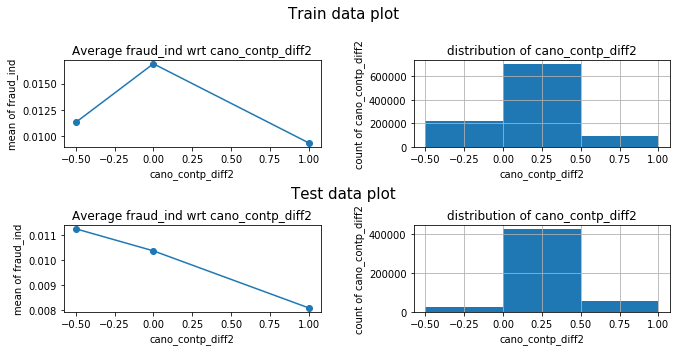

cano_contp_diff3


<Figure size 432x288 with 0 Axes>

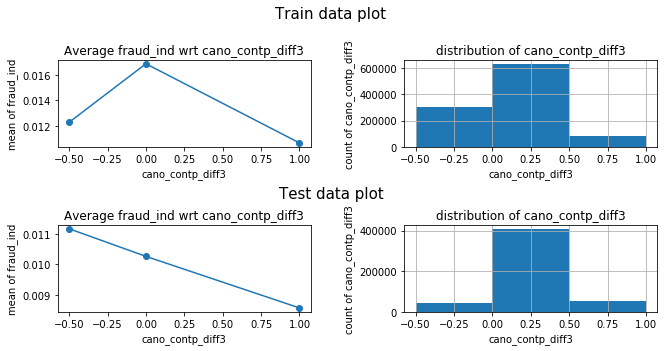

cano_etymd_diff1


<Figure size 432x288 with 0 Axes>

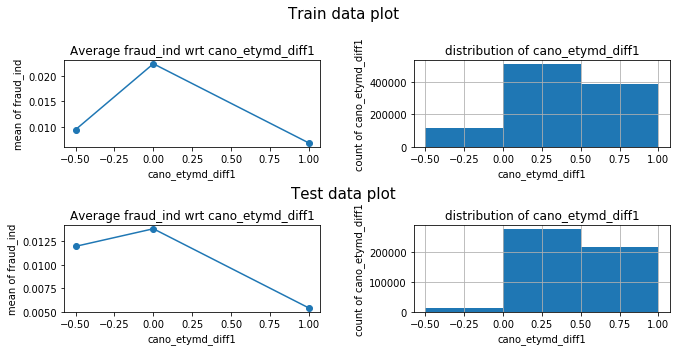

cano_etymd_diff2


<Figure size 432x288 with 0 Axes>

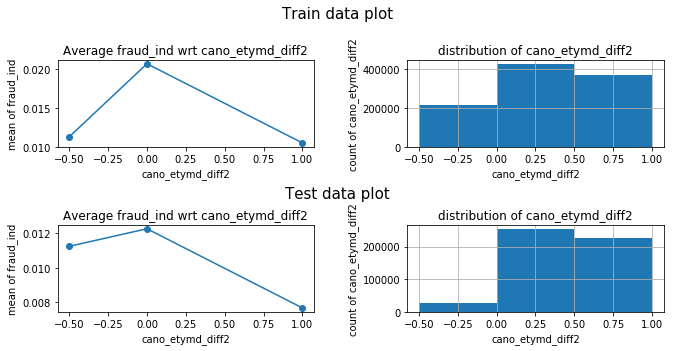

cano_etymd_diff3


<Figure size 432x288 with 0 Axes>

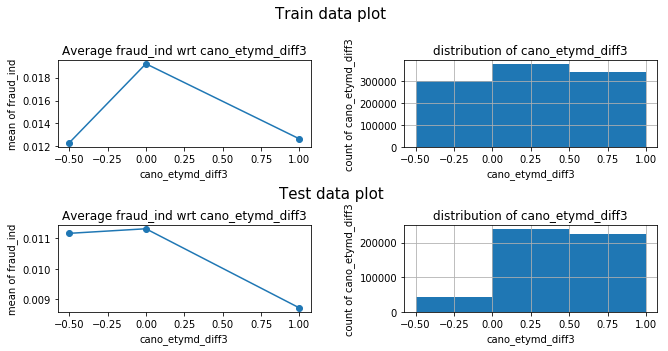

cano_mchno_diff1


<Figure size 432x288 with 0 Axes>

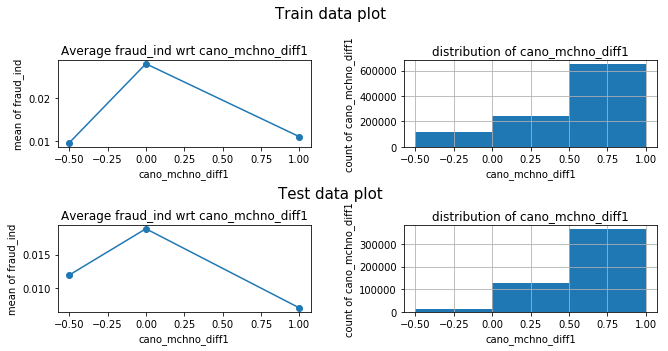

cano_mchno_diff2


<Figure size 432x288 with 0 Axes>

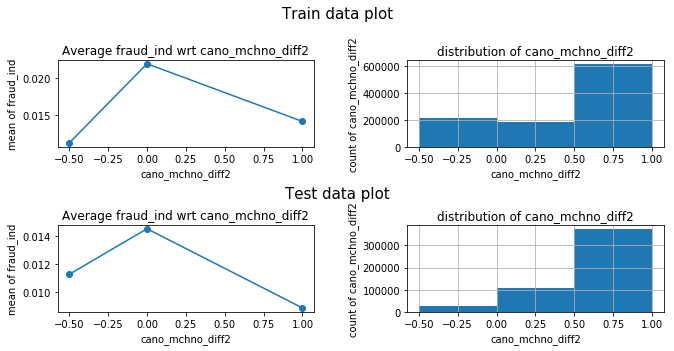

cano_mchno_diff3


<Figure size 432x288 with 0 Axes>

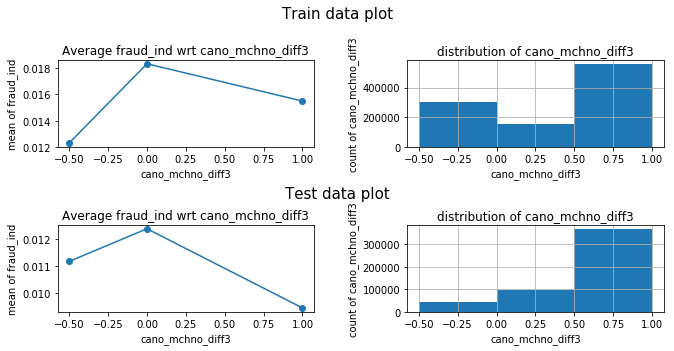

cano_acqic_diff1


<Figure size 432x288 with 0 Axes>

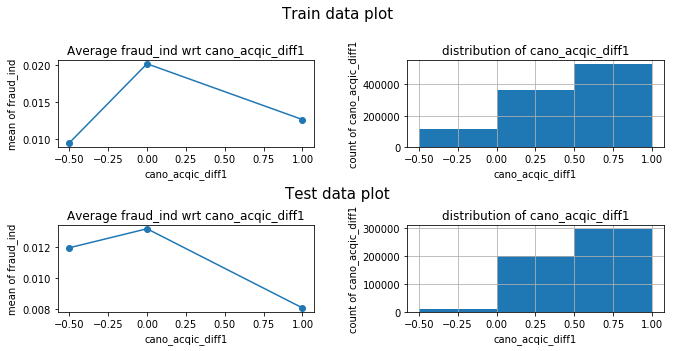

cano_acqic_diff2


<Figure size 432x288 with 0 Axes>

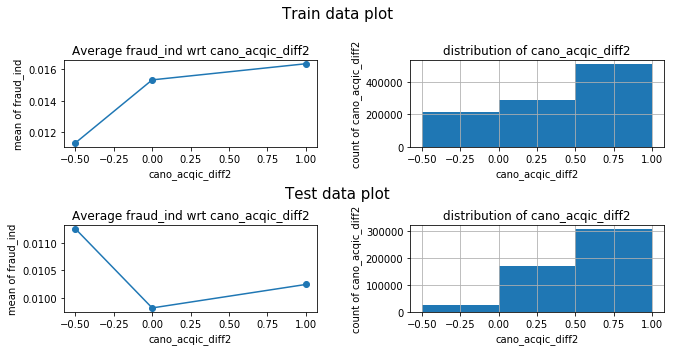

cano_acqic_diff3


<Figure size 432x288 with 0 Axes>

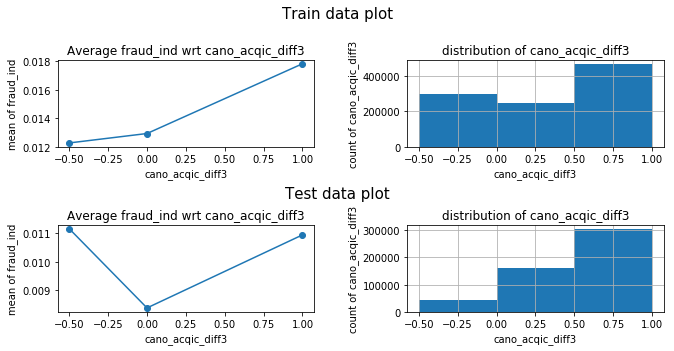

cano_mcc_diff1


<Figure size 432x288 with 0 Axes>

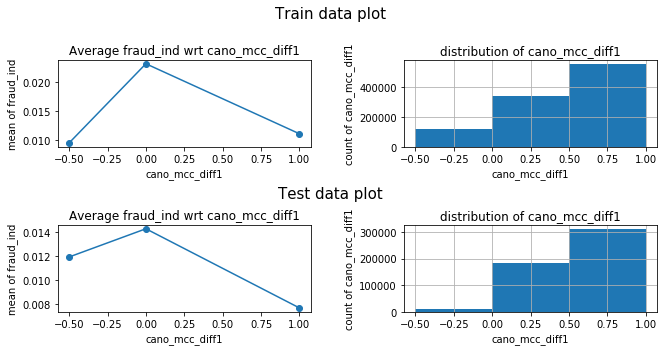

cano_mcc_diff2


<Figure size 432x288 with 0 Axes>

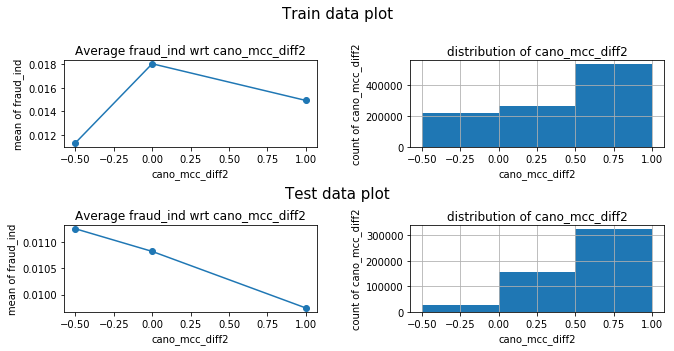

cano_mcc_diff3


<Figure size 432x288 with 0 Axes>

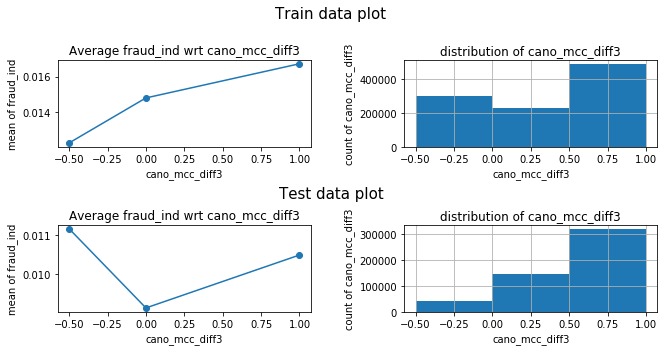

cano_ecfg_diff1


<Figure size 432x288 with 0 Axes>

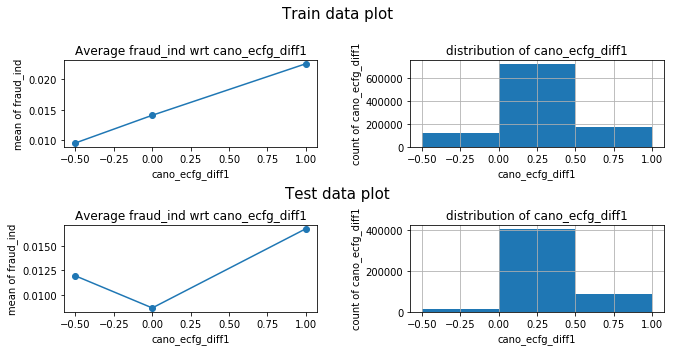

cano_ecfg_diff2


<Figure size 432x288 with 0 Axes>

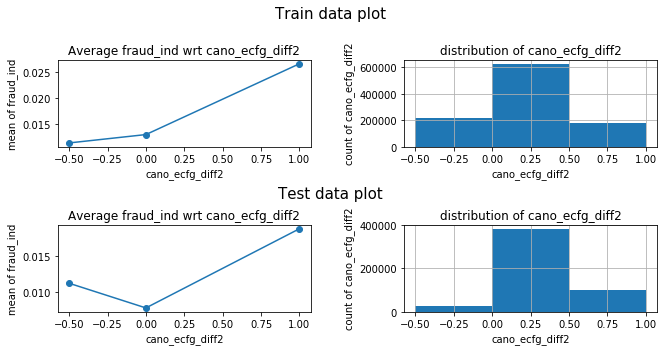

cano_ecfg_diff3


<Figure size 432x288 with 0 Axes>

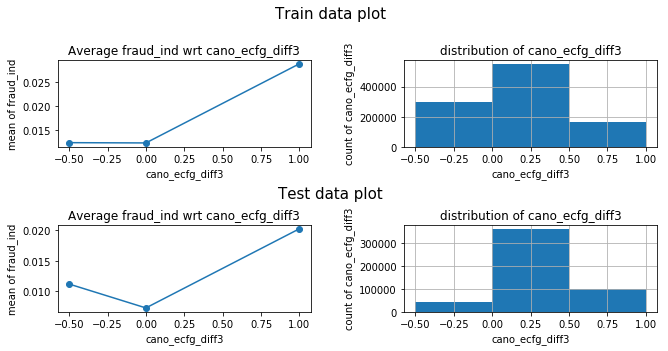

cano_hcefg_diff1


<Figure size 432x288 with 0 Axes>

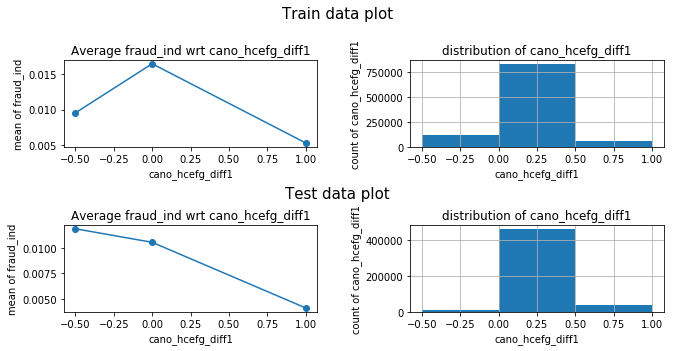

cano_hcefg_diff2


<Figure size 432x288 with 0 Axes>

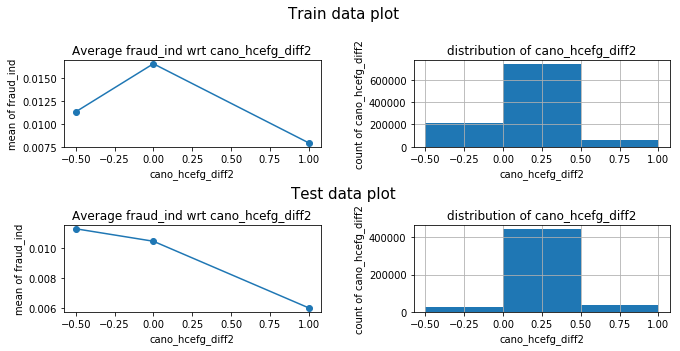

cano_hcefg_diff3


<Figure size 432x288 with 0 Axes>

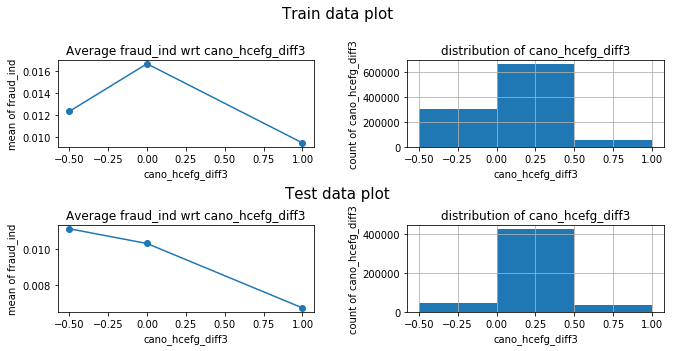

cano_stscd_diff1


<Figure size 432x288 with 0 Axes>

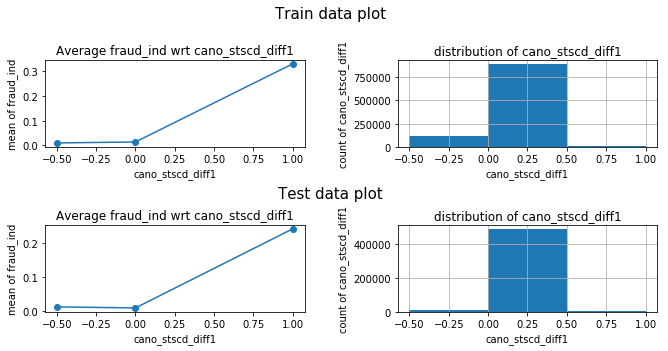

cano_stscd_diff2


<Figure size 432x288 with 0 Axes>

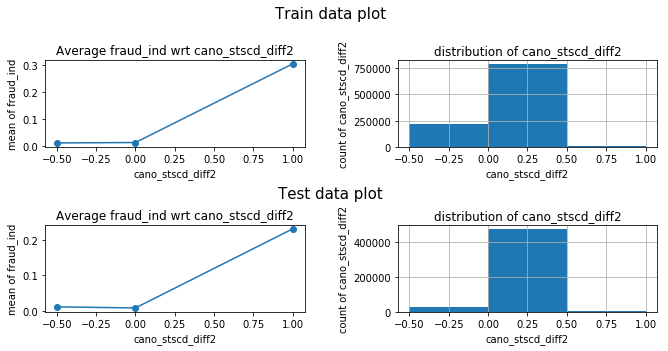

cano_stscd_diff3


<Figure size 432x288 with 0 Axes>

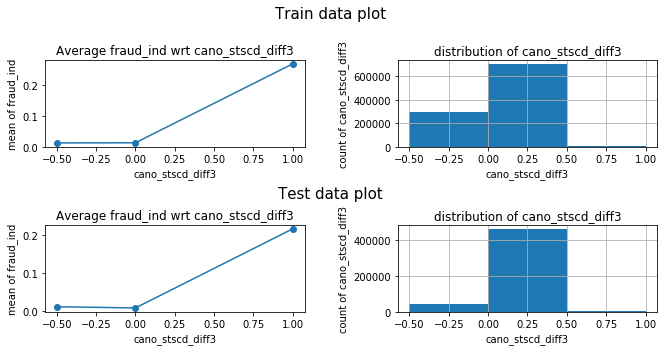

cano_stocn_diff1


<Figure size 432x288 with 0 Axes>

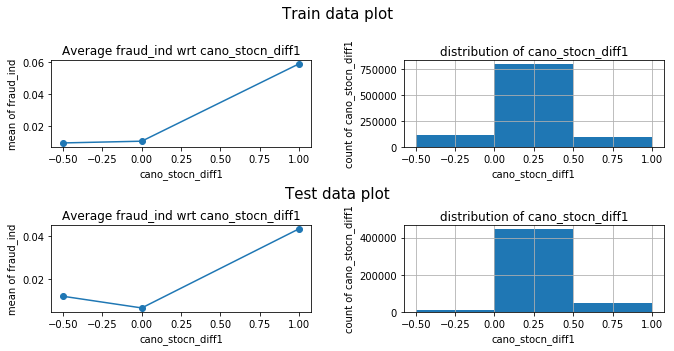

cano_stocn_diff2


<Figure size 432x288 with 0 Axes>

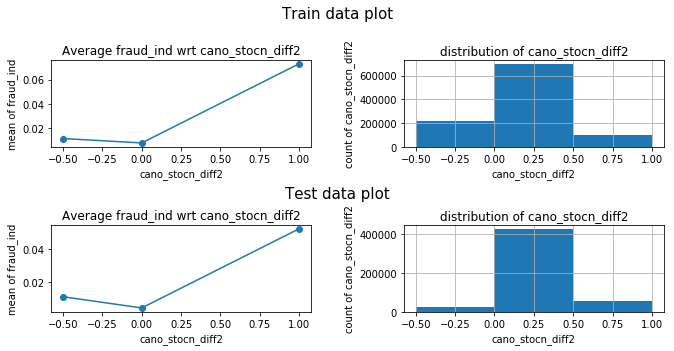

cano_stocn_diff3


<Figure size 432x288 with 0 Axes>

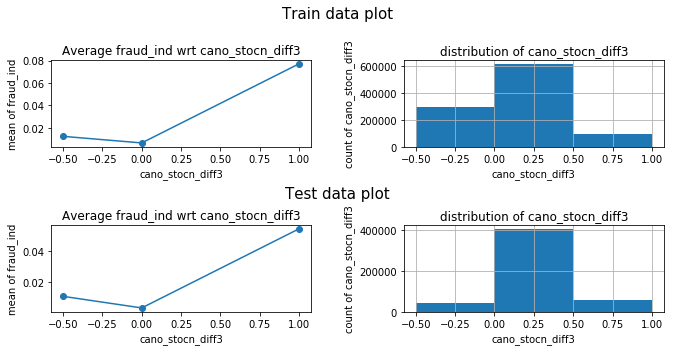

cano_scity_diff1


<Figure size 432x288 with 0 Axes>

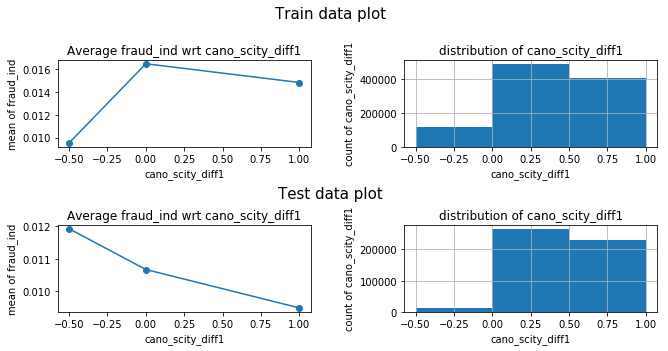

cano_scity_diff2


<Figure size 432x288 with 0 Axes>

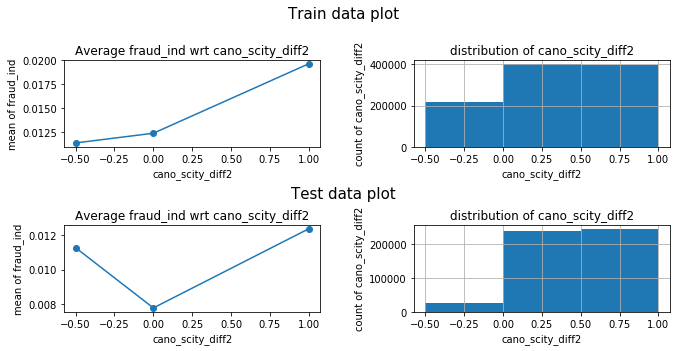

cano_scity_diff3


<Figure size 432x288 with 0 Axes>

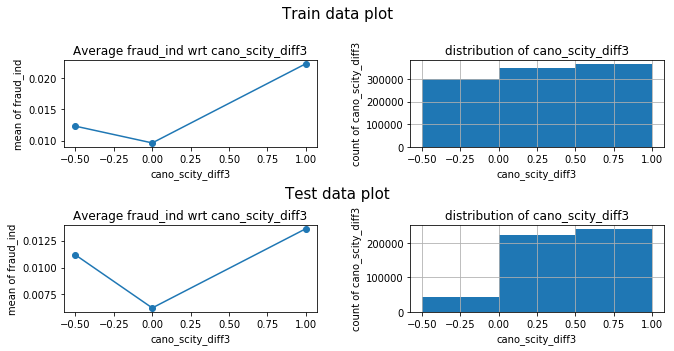

cano_csmcu_diff1


<Figure size 432x288 with 0 Axes>

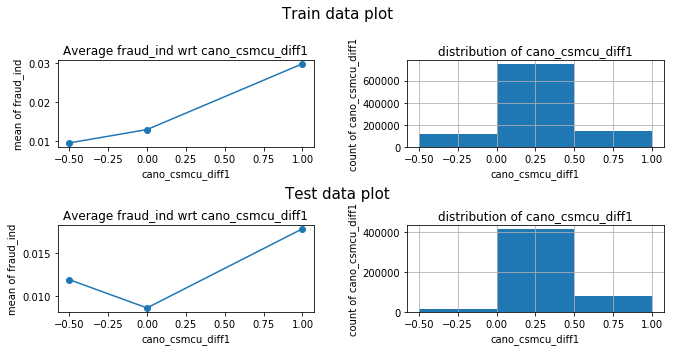

cano_csmcu_diff2


<Figure size 432x288 with 0 Axes>

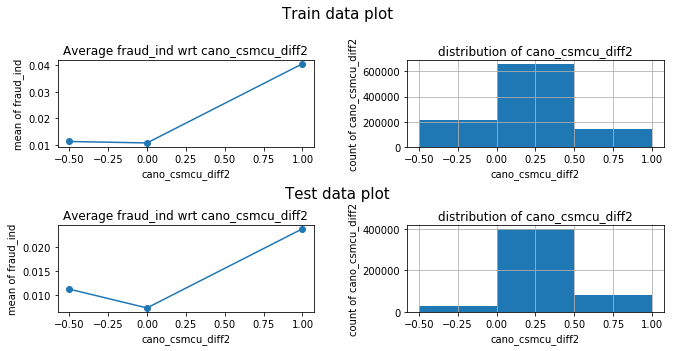

cano_csmcu_diff3


<Figure size 432x288 with 0 Axes>

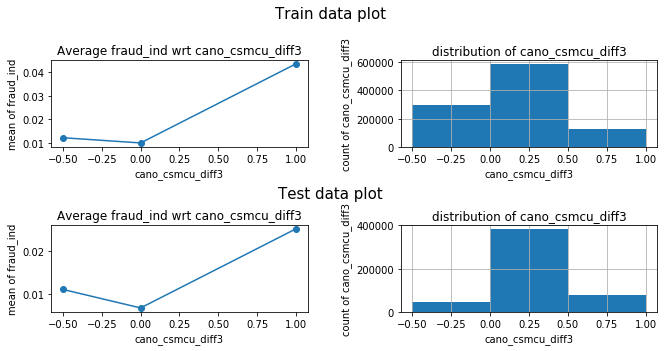

pca2_feature_1


<Figure size 432x288 with 0 Axes>

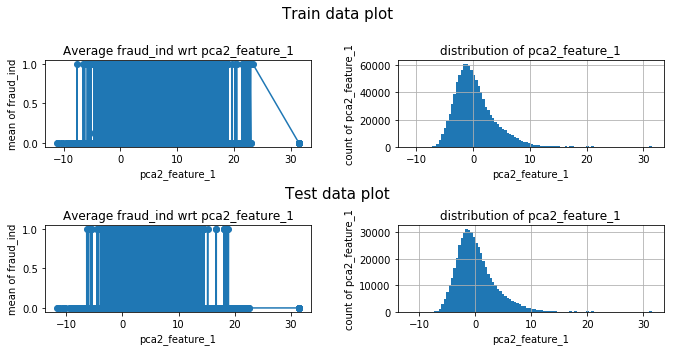

pca2_feature_2


<Figure size 432x288 with 0 Axes>

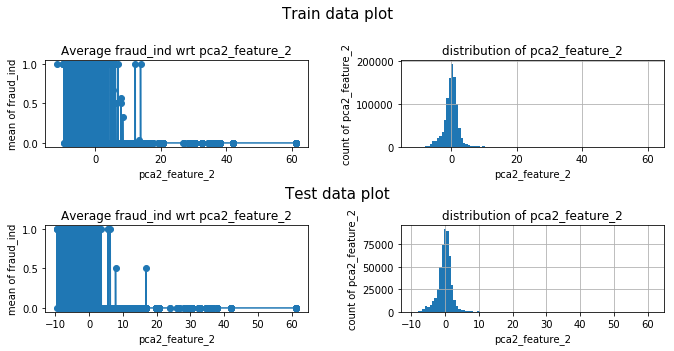

pca3_feature_1


<Figure size 432x288 with 0 Axes>

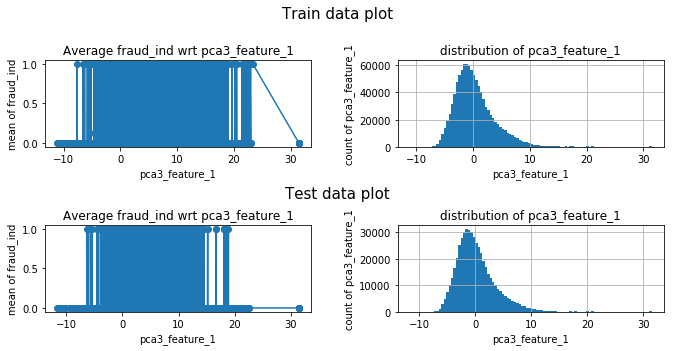

pca3_feature_2


<Figure size 432x288 with 0 Axes>

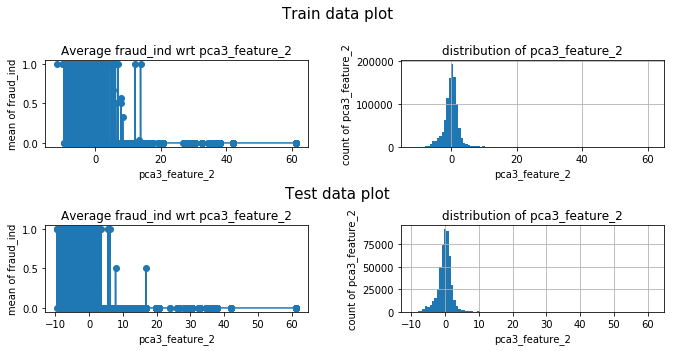

pca3_feature_3


<Figure size 432x288 with 0 Axes>

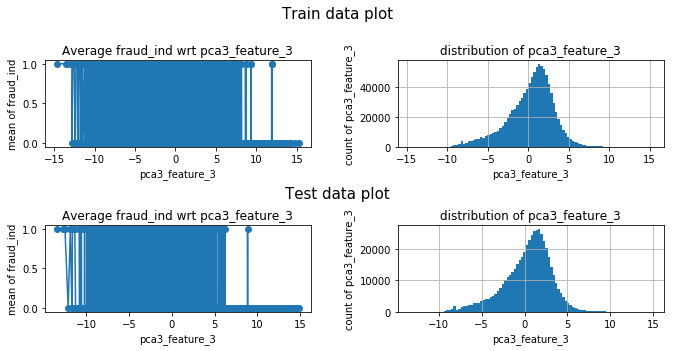

isolationtree_all_feature


<Figure size 432x288 with 0 Axes>

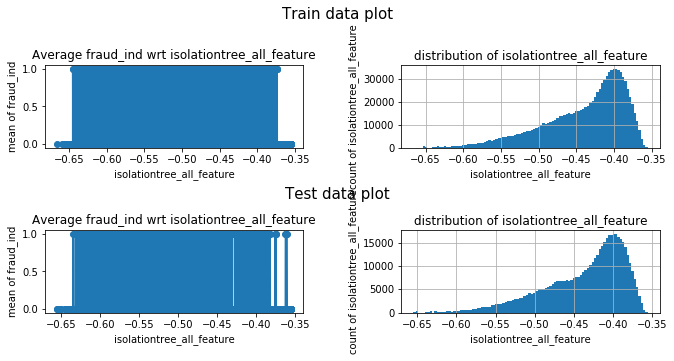

isolationtree_all_feature2


<Figure size 432x288 with 0 Axes>

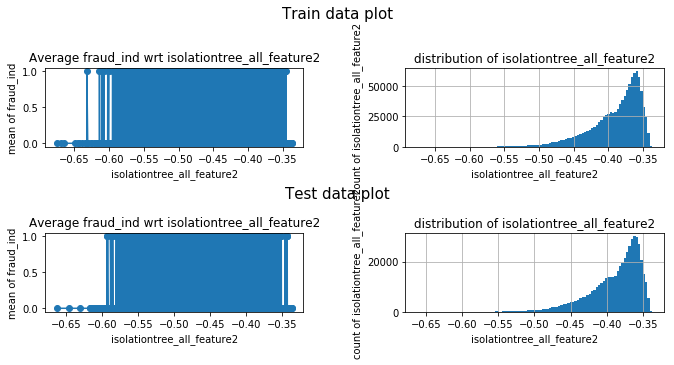

isolationtree_all_feature3


<Figure size 432x288 with 0 Axes>

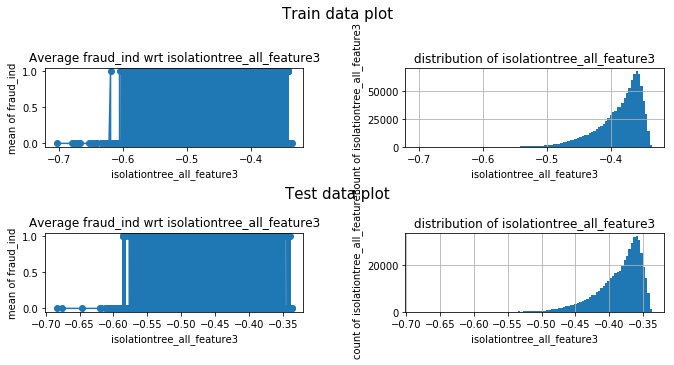

isolationtree_all_feature4


<Figure size 432x288 with 0 Axes>

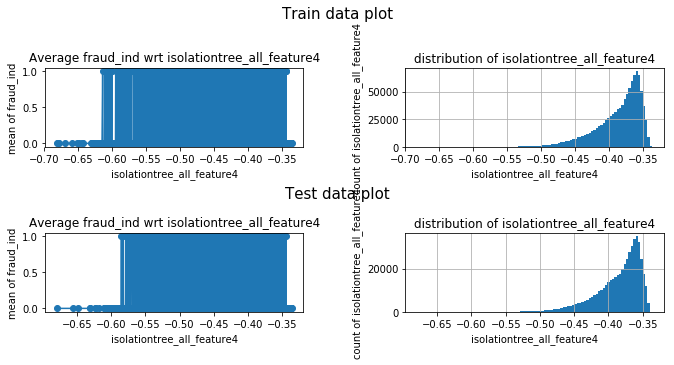

kmeans_all_feature


<Figure size 432x288 with 0 Axes>

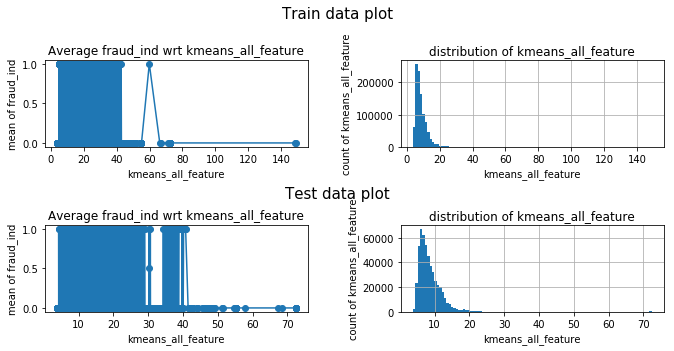

kmeans_all_feature2


<Figure size 432x288 with 0 Axes>

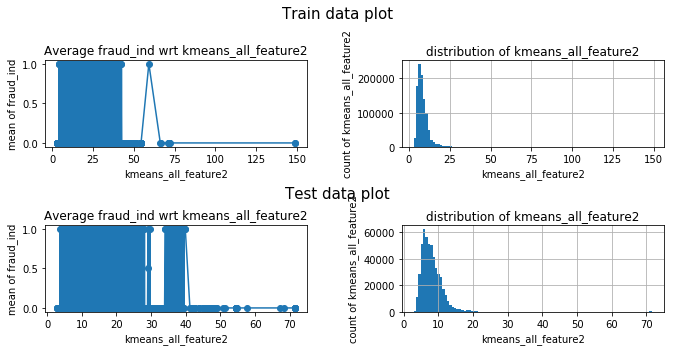

kmeans_all_feature3


<Figure size 432x288 with 0 Axes>

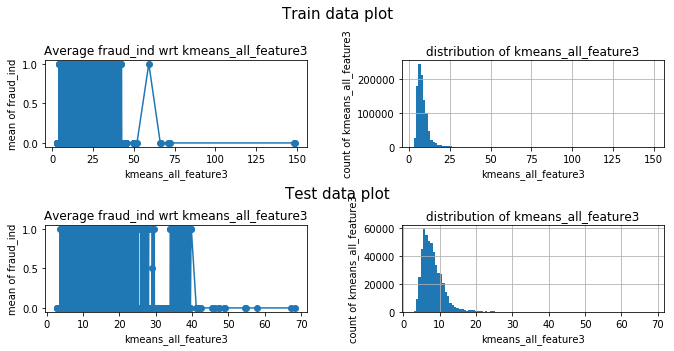

kmeans_all_feature4


<Figure size 432x288 with 0 Axes>

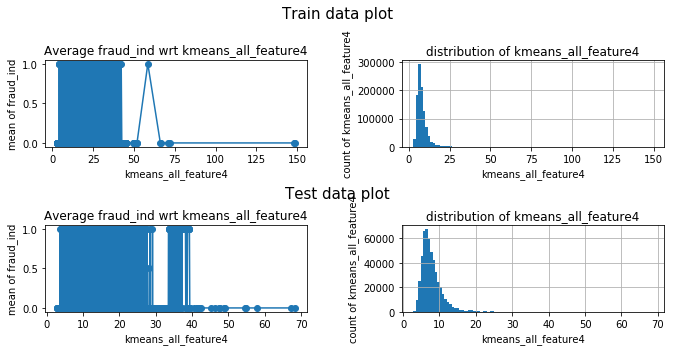

kmeans_all_feature5


<Figure size 432x288 with 0 Axes>

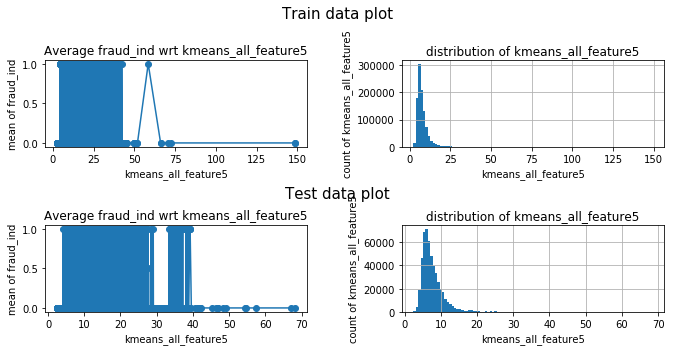

kmeans_all_feature10


<Figure size 432x288 with 0 Axes>

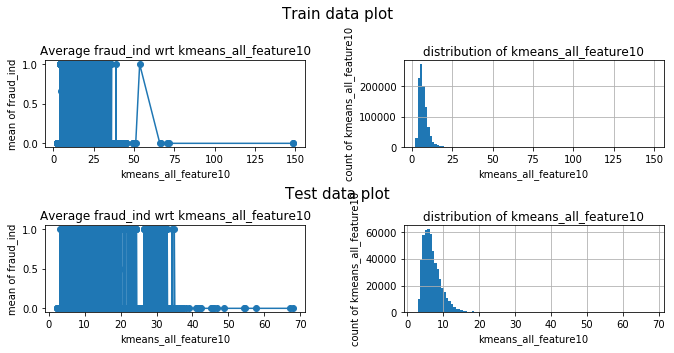

svm_rbf


<Figure size 432x288 with 0 Axes>

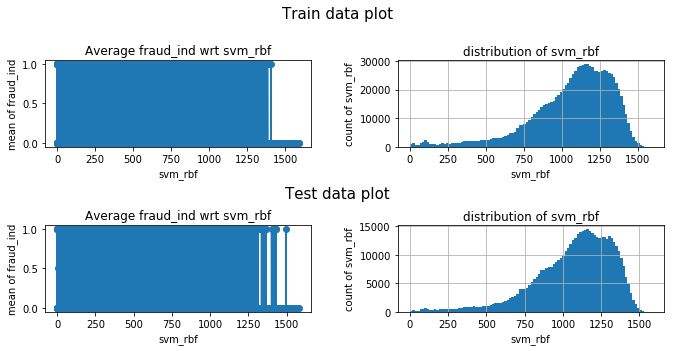

In [8]:
train_d = all_data[all_data['locdt']<=60]
valid_d = all_data[(all_data['locdt']>60)&(all_data['locdt']<=90)]
# 自己做的圖表function，畵資料分佈的bar chart和對fraud_ind的關係

for c in train_d.columns:
    analze_distribution(train_d,'fraud_ind',c,valid_d)


from featexp import get_univariate_plots
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['hcefg'], bins=100, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['loctm_hr'], bins=10, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['flg_3dsmk'], bins=10, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['csmcu'], bins=100, data_test=valid_d)

## 檢查train和test data的分佈有哪裡不一樣

In [ ]:
def compare_distribution(train_data,test_data,target_name):
    target = train_data[target_name]
    target2 = test_data[target_name]
    print(target_name)
    print('nunique train',target.nunique())
    print('nunique test',target2.nunique())
    print('max train',target.max())
    print('max test',target2.max())

    fig, axs = plt.subplots(1,2,figsize=(10,3))
    
    bins = target.nunique() if target.nunique()<100 else 100
    target.hist(bins=bins,ax=axs[0])
    
    bins = target2.nunique() if target2.nunique()<100 else 100
    target2.hist(bins=bins,ax=axs[1])
    plt.show()


for c in all_data.drop(columns='fraud_ind'):
    compare_distribution(all_data[all_data['locdt']<=90].drop(columns='fraud_ind'),all_data[all_data['locdt']>90].drop(columns='fraud_ind'),c)

## fraud資料和normal資料的各個特徵差異

In [ ]:
normal_data = all_data[all_data['fraud_ind']==0]
fraud_data = all_data[all_data['fraud_ind']==1]

for c in normal_data.columns:
    print(c)
    plt.clf()
    fig, axs = plt.subplots(1,2,figsize=(10,3))

    bins = normal_data[c].nunique() if normal_data[c].nunique()<100 else 100
    normal_data[c].hist(bins=bins,ax=axs[0])
    axs[0].set_title('Normal data')
    bins = fraud_data[c].nunique() if fraud_data[c].nunique()<100 else 100
    fraud_data[c].hist(bins=bins,ax=axs[1])
    axs[1].set_title('Fraud data')
    plt.show()


### 檢查在test data中,新出現的類別有多少
bacno, mchno, acqic, mcc, stocn, scity, csmcu 

In [9]:
def find_new_category(x,target_name):
    x_train = x[x['locdt']<=90][target_name].unique()
    x_test = x[x['locdt']>90][target_name].unique()
    
    print(target_name)
    print('{} categories in Training data:'.format(x_train.shape[0]))
    print('{} categories in Testing data:'.format(x_test.shape[0]))

    x_new_test=[]
    for b in x_test:
        if b not in x_train:
            x_new_test.append(b)

    print('{} new categories'.format(len(x_new_test)))    

In [10]:
# 幾乎所有在test data的都是新用戶 乾
# 所以重點特徵工程不能使用用戶過去的fraud記錄
find_new_category(all_data,'bacno')

# 幾乎都太多只出現在test data上的新類別,這樣得轉換可以用來訓練(TODO)

find_new_category(all_data,'mchno')
find_new_category(all_data,'acqic')
find_new_category(all_data,'mcc')
find_new_category(all_data,'stocn')
find_new_category(all_data,'scity')
find_new_category(all_data,'csmcu')


bacno
95214 categories in Training data:
71099 categories in Testing data:
67971 new categories
mchno
89316 categories in Training data:
45501 categories in Testing data:
13467 new categories
acqic
6051 categories in Training data:
3748 categories in Testing data:
815 new categories
mcc
434 categories in Training data:
372 categories in Testing data:
26 new categories
stocn
103 categories in Training data:
87 categories in Testing data:
6 new categories
scity
5698 categories in Training data:
2857 categories in Testing data:
949 new categories
csmcu
72 categories in Training data:
57 categories in Testing data:
4 new categories


## 觀察large category的feature是否有很多種bacno的fraud

In [ ]:
# mchno_bacno_count = all_data.groupby('mchno').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())
# acqic_bacno_count = all_data.groupby('acqic').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())
# mcc_bacno_count = all_data.groupby('mcc').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())

# print(mchno_bacno_count.sum())
# print(mchno_bacno_count[mchno_bacno_count>1].sort_values())

# print(acqic_bacno_count.sum())
# print(acqic_bacno_count[acqic_bacno_count>1].sort_values())

# print(mcc_bacno_count.sum())
# print(mcc_bacno_count[mcc_bacno_count>1].sort_values())

## 以每個bacno來看fraud情況
* 找出使用者被盜刷卡時，和一般的交易差在哪裡


In [ ]:
bacno_fraud_count = all_data.groupby('bacno').apply(lambda s:s[s['fraud_ind']==1]['bacno'].shape[0])

In [ ]:
# print('All fraud instance',all_data.fraud_ind.sum(skipna=True))
# print('{} different bacno'.format(bacno_fraud_count[bacno_fraud_count>0].shape[0]))

# bacno_fraud_count[(bacno_fraud_count<10)&(bacno_fraud_count>0)].hist(bins=9)
# plt.show()
# plt.clf()
# bacno_fraud_count[(bacno_fraud_count>0)].hist(bins=100)

## 幾乎都只被騙過一兩次

In [ ]:
list1=['locdt','cano','etymd','mchno','acqic','mcc','stocn','conam','fraud_ind']
list2=['locdt','conam','cano','ecfg','stscd','stocn','mchno','fraud_ind']
list3=['locdt','conam','cano','stocn','scity','flbmk','csmcu','ecfg','fraud_ind']
list4=['locdt','cano','contp','bacno_contp_diff1','fraud_ind']
# 
# ,'ecfg','etymd'
bacno_10fraud_more_list = bacno_fraud_count[(bacno_fraud_count==1)].index
pd.set_option('display.max_rows', 1000)
# print(x)
# pd.reset_option('display.max_rows')

cnt=0
for b in bacno_10fraud_more_list:
    cnt+=1
    if cnt>300:
        break
    print()
    
    print(b,all_data[all_data['bacno']==b]['fraud_ind'].sum())
    print(all_data[all_data['bacno']==b][list4])
        
#     print(all_data[all_data['bacno']==b][list4].sort_values(by=['locdt']))

In [ ]:
print(all_data.bacno_contp_mode.value_counts())

In [ ]:
for i in all_data.columns:
    print(i)
    

In [ ]:
all_data = all_data.sort_values(by=['bacno','locdt','loctm'],)
print(all_data[['bacno','locdt','loctm']])

In [ ]:
list1=['locdt','cano','etymd','mchno','acqic','mcc','stocn','conam','fraud_ind']
list2=['locdt','loctm','cano','cano_lastlocdt2','contp','csmcu','ecfg','fraud_ind',\
       'flbmk','flg_3dsmk','hcefg','insfg','iterm','mcc','mchno','ovrlt','fraud_ind',\
       'scity','stocn','stscd','conam','etymd','fraud_ind']
# 
# ,'ecfg'

pd.set_option('display.max_columns', 500)
bacno_10fraud_more_list = bacno_fraud_count[(bacno_fraud_count>=2)].index
pd.set_option('display.max_rows', 1000)
# print(x)
# pd.reset_option('display.max_rows')

cnt=0
for b in bacno_10fraud_more_list:
    cnt+=1
    if cnt>100:
        break
    print()
    
    print(b,all_data[all_data['bacno']==b]['fraud_ind'].sum())
    print(all_data[all_data['bacno']==b][list2])

曾經在該國被盜刷的紀錄
曾經在該mchno被盜刷的紀錄
曾經在該mchno被盜刷
最後一筆是不是盜刷
